<a href="https://colab.research.google.com/github/pablohd10/clasificacion-radiografias-torax/blob/main/clasificador-RX-torax.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

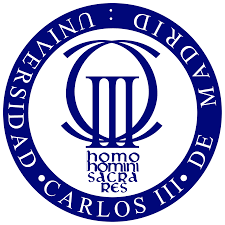

# **PRACTICA 02 - APLICACIONES AVANZADAS DE LA IA - IA EN SALUD**
---
**GRUPO 10**
*   Sergio Caño Amor (100429678)
*   Eduardo Enrique Angulo Luna (100545176)
*   Pablo Hidalgo Delgado (100451225)


## **1. Introducción.**

El objetivo de esta práctica es entrenar modelos capaces de clasificar imágenes médicas. En nuestro caso, hemos escogido imágenes de **radiografías de tórax**. Para ello, construiremos dos modelos:

* Un **clasificador binario**, cuyo objetivo es determinar si una radiografía de tórax presenta indicios de alguna `enfermedad` (COVID-19 o neumonía bacteriana) o si corresponde a un paciente `sano`.

* Un **clasificador multiclase**, que será capaz de diferenciar entre tres categorías: `COVID-19`, `neumonía bacteriana` o `sano`.

Siguiendo la recomendación de la profesora, optamos por utilizar un modelo pre-entrenado, ya que esto nos permitirá obtener mejores resultados al aprovechar características previamente aprendidas en redes profundas aplicadas a imágenes médicas.

### **1.1 Planteamiento del problema**
Para abordar esta práctica, decidimos utilizar un modelo pre-entrenado adecuado para imágenes de radiografías de tórax. Esto lo haremos para las capas convolucionales, mientras que para la parte de clasificación (Perceptrón Multicapa), tratarmeos de realizar nuestro modelo personalizado y realizar varios experimentos con distintos hiperparámetros. La arquitectura del modelo pre-entrenado que utilizaremos será **ResNet50**. Exploraremos distintos modelos que utilicen esta arquitectura y escogeremos los que más se adecúen a cada problema de clasificación binaria y multiclase.

## **2. Lectura de los datos.**

En primer lugar, importamos las librerías que necesitaremos a lo largo del proyecto y establecemos las semillas de reproducibilidad:

In [ ]:
import os
import random
import zipfile
import numpy as np
import numpy as np
from PIL import Image
import gc
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, accuracy_score, recall_score, f1_score, confusion_matrix
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img
from tensorflow.keras.applications.resnet50 import preprocess_input

# Configuración de la semilla para la reproducibilidad
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

A continuación, descomprimimos el zip:

In [ ]:
# Ruta al archivo .zip
zip_path = 'covid-chest-xray.zip'

extract_path = "./"  # Carpeta donde se extraerán los archivos

# Descomprimimos
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

Leemos los datos.

In [ ]:
# Directorio raíz donde están las carpetas con imágenes
dataset_path = "etiquetadas"

# Clases (nombres de las carpetas)
clases = ["Bacterial", "COVID-19", "Normal"]

# Listas para almacenar imágenes y etiquetas
X_raw = []  # Lista para imágenes sin procesar
y = []  # Lista para etiquetas

# Mapeo de clases a números
label_map = {clase: idx for idx, clase in enumerate(clases)}

for clase in clases:
    class_index = label_map[clase]
    folder_path = os.path.join(dataset_path, clase)

    for filename in os.listdir(folder_path):
        if filename.lower().endswith((".png", ".jpg", ".jpeg")):  # Extensiones soportadas
            img_path = os.path.join(folder_path, filename)

            try:
                # Abrimos la imagen con PIL y guardarla sin procesar
                img = Image.open(img_path)
                X_raw.append(img)  # Guardamos la imagen en formato PIL
                y.append(class_index)  # Guardamos la etiqueta
            except Exception as e:
                print(f"Error con la imagen {img_path}: {e}")

## **3. Análisis exploratorio de los datos.**
Antes de empezar con la división en datos de entrenamiento, validación y test, vamos a realizar un **análisis exploratorio de datos** (`EDA`). De esta manera, podremos investigar y resumir las características más importantes de nuestro conjunto de datos. Esto nos servirá para comprender mejor las imagenes de las que disponemos y optimizar la obtención de nuestro modelo, así como para evaluar la necesidad de preprocesado de las imágenes.

### **3.1 Información básica**

In [ ]:
total_imagenes = len(X_raw)
print(f"Total de imágenes cargadas: {total_imagenes}\n")
for i, img in enumerate(X_raw[:5]):  # Mostramos las dimensiones y modo de las primeras 5 imágenes
    print(f"Imagen {i+1}: Tamaño original = {img.size}, Modo = {img.mode}")

Total de imágenes cargadas: 876

Imagen 1: Tamaño original = (411, 385), Modo = RGB
Imagen 2: Tamaño original = (526, 462), Modo = RGBA
Imagen 3: Tamaño original = (744, 744), Modo = RGBA
Imagen 4: Tamaño original = (1024, 811), Modo = RGB
Imagen 5: Tamaño original = (507, 491), Modo = RGBA


Observamos que disponemos de un total de **876 imágenes**.

Además, es importante notar que estas imagenes tienen **distintas dimensiones**, y también **distintos modos de codificación**. Vamos a explorar qué modos están presentes en las imagenes:

In [ ]:
# Almacenamos modos y dimensiones únicas
modos_unicos = set()

for img in X_raw:
    modos_unicos.add(img.mode) # Guardamos modo

print(f"Modos de codificación de imagen únicos: {modos_unicos}")

Modos de codificación de imagen únicos: {'RGB', 'L', 'RGBA', 'P'}


Como podemos observar, el conjunto de datos con el que trabajamos contiene imágenes en diferentes formatos de color, entre los que se incluyen:

- **RGB**: Imágenes con tres canales, correspondientes a los colores rojo, verde y azul.

- **RGBA**: Similar a RGB, pero con un cuarto canal adicional que representa la transparencia (canal alfa), donde 0 indica total transparencia y 255 opacidad total.

- **P**: Formato de paleta indexada, donde cada píxel almacena un índice que apunta a un color específico dentro de una paleta predefinida.

- **L**: Imágenes en escala de grises, que contienen un único canal con valores de intensidad de luz.

Para entrenar nuestra CNN, necesitaremos que todas las imágenes se encuentren en **RGB**, por lo que las transformaremos a este modo en el apartado de preproceso.

###**3.2 Distribución de clases**

En esta sección, analizaremos la distribución de las muestras entre las tres clases posibles.

- Imágenes correspondientes a un paciente con **neumonía bacterial** (enfermedad)

- Imágenes correspondientes a un paciente con **COVID-19** (enfermedad)

- Imágenes correspondientes a un paciente **sano**

Para ello, contaremos la cantidad de muestras en cada clase y representaremos los resultados en un gráfico de barras. Este análisis nos permitirá identificar posibles desbalances en los datos que podrían afectar el rendimiento del modelo.

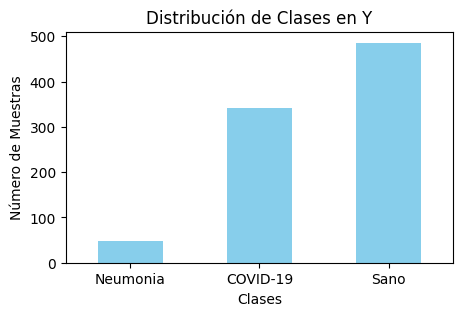

Número de imágenes por clase:
Neumonia: 48
COVID-19: 342
Sano: 486


In [ ]:
clases = ["Neumonia", "COVID-19", "Sano"]
label_map = {idx: clase for idx, clase in enumerate(clases)}  # Mapeo de índices a nombres de la clase

# Convertimos y en una Serie de Pandas
y_series = pd.Series(y)

# Contamos las ocurrencias de cada clase en `y`
conteo_clases_y = y_series.value_counts().sort_index()

# Reemplazamos los índices numéricos por los nombres de las clases
conteo_clases_y.index = conteo_clases_y.index.map(label_map)

# GRÁFICA
plt.figure(figsize=(5, 3))
conteo_clases_y.plot(kind='bar', color='skyblue')

# Etiquetas de los ejes
plt.xlabel('Clases')
plt.ylabel('Número de Muestras')
plt.title('Distribución de Clases en Y')

# Mostramos el gráfico
plt.xticks(rotation=0)
plt.show()

# Imprimimos cuántas imágenes hay de cada clase
print("Número de imágenes por clase:")
for clase, cantidad in conteo_clases_y.items():
    print(f"{clase}: {cantidad}")

En la gráfica de barras se observa un claro **desbalance** entre las muestras de neumonía bacteriana y las de las otras dos clases.

En un `clasificador binario`, este desbalance no debería ser un problema significativo, ya que las muestras de enfermedades (neumonía y COVID-19) serán relativamente similares a las muestras de "sin enfermedad" (sano).

Sin embargo, al utilizar un `clasificador multiclase`, el número reducido de muestras de neumonía bacteriana podría ser insuficiente para que el modelo generalice correctamente. En este caso, sería recomendable aplicar técnicas de **data augmentation**, como la rotación de imágenes, ajuste de brillo o la alteración de la perspectiva, para aumentar la diversidad de los datos de entrenamiento y mejorar el rendimiento del modelo. Exploraremos esta opción en nuestro clasificador multiclase.

### **3.3 Visualización de imágenes**

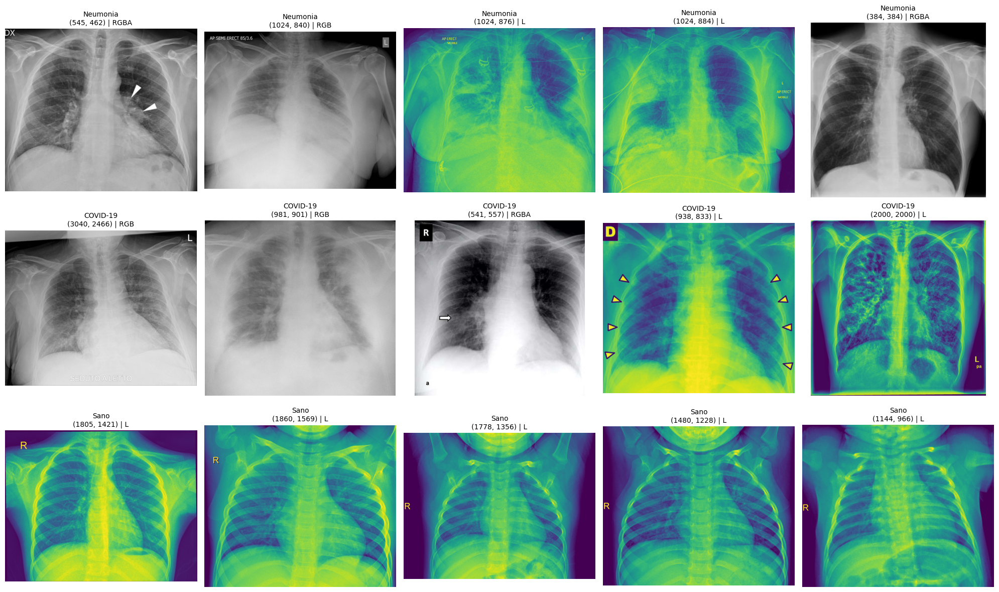

In [ ]:
def mostrar_imagenes_por_clase(X, y, clases, num_imagenes=5, seed=41):
    """
    Muestra imágenes aleatorias de cada clase con sus dimensiones y modo.

    Parámetros:
    - X: Lista de imágenes originales (PIL Images).
    - y: Lista de etiquetas correspondientes a cada imagen.
    - clases: Lista con los nombres de las clases.
    - num_imagenes: Número de imágenes a mostrar por clase (por defecto 5).
    - seed: Semilla para asegurar reproducibilidad (por defecto 41).
    """
    random.seed(seed)  # Fijamos la semilla para obtener siempre las mismas imágenes

    plt.figure(figsize=(num_imagenes * 4, len(clases) * 4))  # Ajustamos tamaño de la figura

    for i, clase in enumerate(clases):
        # Obtenemos índices de todas las imágenes de la clase actual
        indices_clase = [idx for idx, label in enumerate(y) if label == i]

        # Seleccionamos aleatoriamente num_imagenes imágenes (si hay menos, tomar todas)
        imagenes_seleccionadas = random.sample(indices_clase, min(num_imagenes, len(indices_clase)))

        for j, idx in enumerate(imagenes_seleccionadas):
            img = X[idx]
            dimensiones = img.size  # (ancho, alto)
            modo = img.mode  # RGB, RGBA, L, etc.

            # Mostramos imagen en la subfigura correspondiente
            plt.subplot(len(clases), num_imagenes, i * num_imagenes + j + 1)
            plt.imshow(img)
            plt.title(f"{clase}\n{dimensiones} | {modo}", fontsize=10)  # Título con info
            plt.axis("off")  # Ocultamos ejes

    plt.tight_layout()
    plt.show()

# Mostramos 5 imagenes por clase
mostrar_imagenes_por_clase(X_raw, y, clases)


## **4. Elección del modelo pre-entrenado**

Para abordar esta práctica, decidimos utilizar un modelo pre-entrenado y aplicar la técnica de `transfer learning` para aprovechar el conocimiento previamente adquirido por modelos entrenados en grandes conjuntos de datos. Tras evaluar diversas opciones de modelos pre-entrenados especializados en imágenes médicas correspondientes a radiografías de tórax, barajamos las siguientes alternativas:

- **CheXNet**: Este modelo fue entrenado en un conjunto de datos grande centrado en la detección de neumonía en general. Sin embargo, no está específicamente diseñado para diferenciar COVID-19 de otras formas de neumonía, lo que lo hace menos adecuado para este problema en particular.

- **COVID-Net**: A pesar de contar con un conjunto de datos más pequeño, este modelo está específicamente entrenado para distinguir entre COVID-19, neumonía bacteriana y personas sanas. Su especialización lo hace más adecuado para una clasificación multiclase, ya que ofrece una capacidad más precisa para detectar y diferenciar entre estas tres categorías.

- **DeepCOVID-XR**: Este modelo ha demostrado ser muy eficaz para diferenciar entre imágenes de COVID-19 y no-COVID. Aunque no está específicamente entrenado para diferenciar neumonía bacteriana de otras patologías, su rendimiento en la clasificación binaria (sano vs enfermo) lo hace muy adecuado para nuestro caso de clasificación binaria, donde la distinción entre estos dos grupos es fundamental.

Después de analizar estas opciones, decidimos utilizar el modelo **DeepCOVID-XR** para abordar el problema de **clasificación binaria** (sano vs enfermo), ya que este modelo ya ha sido entrenado con un gran volumen de imágenes relacionadas con el COVID-19, lo que le otorga una excelente capacidad de generalización para detectar signos de enfermedad en las radiografías.

Por otro lado, el modelo **COVID-Net** es el que mejor se ajusta para la clasificación multiclase. Sin embargo, tras explorar sus características e intentar descargarlo, no fue posible obtener el modelo. Por esta razón, se optó por utilizar **ImageNet**, un modelo preentrenado con imágenes de propósito general, para llevar a cabo la **clasificación multiclase**.

## **4. Preproceso de las imágenes**

Previamente a entrenar los modelos, debemos realizar una transformación de los datos para que puedan ser interpretados por los algoritmos de CNN de manera eficiente y correcta. Las transformaciones de datos que realizamos son las siguientes:

### **4.1 Redimensionamiento y conversión a RGB**

Convertimos a **formato RGB** las imágenes para homogenizarlas, ya que algunas presentan diferentes formatos `(RGB, RGBA, P, L)`. Esto es necesario para asegurar la compatibilidad con modelos pre-entrenados, que generalmente utilizan imágenes con 3 canales (RGB). También debemos redimensionar las imágenes a **224x224 píxeles**, el tamaño estándar para muchos modelos pre-entrenados, incluidos los que utilizaremos (DeepCOVID-XR e ImageNet). Estas transformaciones garantizan la compatibilidad, mejoran la eficiencia computacional y aseguran un procesamiento adecuado durante el entrenamiento del modelo.

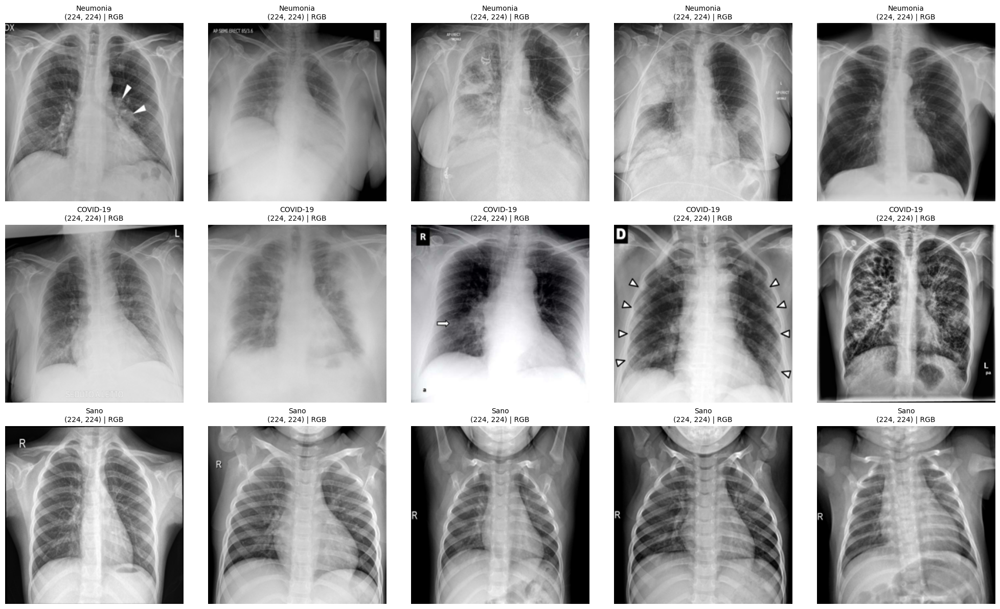

Total de imágenes procesadas: 876
Dimensiones de X: (876, 224, 224, 3), Dimensiones de y: (876,)


In [ ]:
IMG_SIZE = 224  # Tamaño de redimensionamiento
X = []  # Lista para imágenes procesadas

for img in X_raw:
    try:
        img = img.convert("RGB")  # Convertimos a 3 canales (RGB)
        img = img.resize((IMG_SIZE, IMG_SIZE))  # Redimensionamos
        X.append(img)
    except Exception as e:
        print(f"Error procesando imagen: {e}")

mostrar_imagenes_por_clase(X, y, clases)

# Convertimos las listas de imagenes preprocesadas y etiquetas a arrays de NumPy
X = np.array(X)
y = np.array(y)

# Verificamos dimensiones
print(f"Total de imágenes procesadas: {len(X)}")
print(f"Dimensiones de X: {X.shape}, Dimensiones de y: {y.shape}")

### **SECCIÓN A: RESOLUCIÓN DEL PROBLEMA BINARIO**

En esta sección construiremos el clasificador binario. Para ello, realizamos los siguientes pasos:

#### **4.2.A Conversión a clases binarias**




Transformamos el problema en una tarea de clasificación binaria, donde agrupamos las clases en **sano** (0) y **enfermo** (1). Utilizamos el método `where` de la librería numpy, asignando el valor 0 a las imágenes correspondientes a personas sanas (clase 2) y el valor 1 a aquellas con neumonía bacteriana o COVID-19 (clases 0 y 1).

In [ ]:
y_bin = np.where(y == 2, 0, 1)

#### **4.3.A. Aleatorización de los datos y división en train, validation y test**

Dividimos el dataset en conjuntos de entrenamiento (train), prueba (test) y validación (validation). Para ello, utilizamos la función `train_test_split` de la librería sklearn. Decidimos dividir los datos en un **80% para train** y **20% para test**. El conjunto de **validación** se corresponderá con un **20% del conjunto de entrenamiento**.

Realizamos **particiones estratificadas** para asegurarnos de que disponemos de una muestra representativa de imágenes de cada clase en cada uno de nuestros 3 conjuntos. Además, aleatorizamos las imágenes especificando el parámetro `suffle=True`.

Número de imágenes por clase en el conjunto de entrenamiento:
0    310
1    250
Name: count, dtype: int64

Número de imágenes por clase en el conjunto de validación:
0    78
1    62
Name: count, dtype: int64

Número de imágenes por clase en el conjunto de test:
0    98
1    78
Name: count, dtype: int64


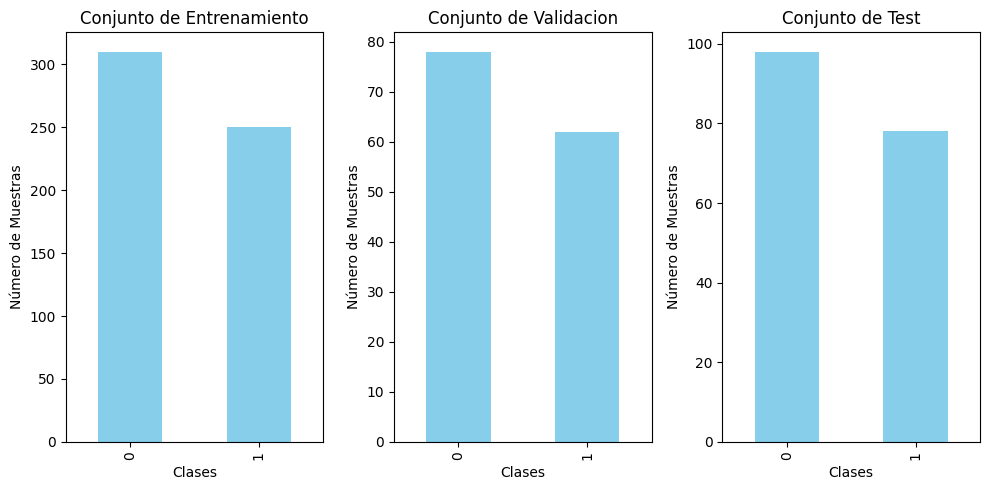

In [ ]:
# Dividimos los datos en conjuntos de entrenamiento, validación y prueba
X_train_temp, X_test, y_train_temp, y_test = train_test_split(X, y_bin, test_size=0.2, random_state=42, stratify=y_bin, shuffle=True)
X_train, X_validation, y_train, y_validation = train_test_split(X_train_temp, y_train_temp, test_size=0.2, random_state=42, stratify=y_train_temp, shuffle=True)

y_train_series = pd.Series(y_train.flatten())  # Aplanamos y convertimos a Series
y_validation_series = pd.Series(y_validation.flatten())
y_test_series = pd.Series(y_test.flatten())

conteo_clases_train = y_train_series.value_counts().sort_index()
conteo_clases_test = y_test_series.value_counts().sort_index()
conteo_clases_validation = y_validation_series.value_counts().sort_index()

# Imprimimos número de imágenes de cada clase en el conjunto de entrenamiento
print("Número de imágenes por clase en el conjunto de entrenamiento:")
print(conteo_clases_train)

# Imprimimos número de imágenes de cada clase en el conjunto de validación
print("\nNúmero de imágenes por clase en el conjunto de validación:")
print(conteo_clases_validation)

# Imprimimos número de imágenes de cada clase en el conjunto de test
print("\nNúmero de imágenes por clase en el conjunto de test:")
print(conteo_clases_test)

# Creamos la gráfica de barras para los conjuntos de entrenamiento y prueba
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
conteo_clases_train.plot(kind='bar', color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Número de Muestras')
plt.title('Conjunto de Entrenamiento')

plt.subplot(1, 3, 2)
conteo_clases_validation.plot(kind='bar', color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Número de Muestras')
plt.title('Conjunto de Validacion')

plt.subplot(1, 3, 3)
conteo_clases_test.plot(kind='bar', color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Número de Muestras')
plt.title('Conjunto de Test')

plt.tight_layout()
plt.show()

#### **4.4.A Normalización de los datos**

Dado que utilizaremos **ResNet50** como base de nuestra arquitectura, es fundamental asegurar que las imágenes de entrada cumplan con el mismo preprocesamiento utilizado durante el entrenamiento original de dicho modelo. ResNet50 fue entrenado con el dataset **ImageNet**, cuyas imágenes fueron normalizadas restando el valor medio de cada canal (R, G, B).

Además, es importante destacar que **DeepCOVID-XR**, modelo del cual partimos para cargar los pesos preentrenados, probablemente también ha sido inicializado a partir de una **red base preentrenada en ImageNet**. Por lo tanto, aplicar esta misma normalización garantiza que las características de las imágenes estén en un rango coherente con lo que el modelo espera, maximizando así el aprovechamiento de los pesos aprendidos.

Para asegurar la compatibilidad y el correcto funcionamiento del modelo preentrenado, aplicamos el preprocesamiento utilizando la función `preprocess_input` de TensorFlow, que realiza esta normalización de manera automática. Este paso es esencial para que el modelo interprete correctamente las características de las imágenes de nuestro conjunto de datos.


In [ ]:
# Normalizamos las imágenes antes de hacer la predicción
X_train = preprocess_input(X_train)  # Aplicamos el preprocesamiento a las imágenes de entrenamiento
X_validation = preprocess_input(X_validation)  # Aplicamos el preprocesamiento a las imágenes de validación
X_test = preprocess_input(X_test)  # Aplicamos el preprocesamiento a las imágenes de test

#### **5.A Construcción del modelo pre-entrenado DeepCOVID-XR**

Utilizamos la arquitectura **ResNet50** como base para nuestro modelo, cargando los pesos preentrenados del modelo **DeepCOVID-XR**. Configuramos el parámetro `include_top=False` para excluir la capa superior del modelo, permitiéndonos entrenar un perceptrón multicapa personalizado en su lugar, mientras mantenemos los pesos de las capas convolucionales congelados `base_model.trainable = False`

Para procesar la salida de las capas convolucionales, aplanamos la matriz resultante y agregamos una **capa densa** con `num_neurons` neuronas y la función de activación **ReLU**. Además, incorporamos una capa de **dropout** con `droput_rate` para evitar el sobreajuste durante el entrenamiento. La capa final consiste en **1 neurona** con una función de activación **sigmoide**, ya que estamos trabajando con un problema de clasificación binaria.

In [ ]:
# Función para construir el modelo con distintos hiperparámetros
def build_model(num_neurons, dropout_rate):
    # Cargamos el modelo base (suponiendo que es ResNet50 o similar)
    base_model = tf.keras.applications.ResNet50(weights=None, include_top=False, input_shape=(224, 224, 3))
    # Congelamos las capas convolucionales del modelo base
    base_model.trainable = False

    # Añadimos capas finales para la clasificación de COVID-19 vs sano
    x = Flatten()(base_model.output)
    x = Dense(num_neurons, activation="relu")(x)
    x = Dropout(dropout_rate)(x)
    output = Dense(1, activation="sigmoid")(x) # Salida binaria --> 1 neurona con función de activación sigmoide

    model = Model(inputs=base_model.input, outputs=output)

    # Cargamos pesos preentrenados DeepCOVID-XR
    model.load_weights("/content/ResNet50_224_up_uncrop.h5", by_name=True)
    return model

#### **6.A Experimentación con varios modelos y selección de hiperparámetros**


A continuación, procedemos a entrenar el modelo y evaluarlo con el conjunto de validación. Realizamos múltiples experimientos con distintos hiperparámetros para así escoger los que mejor rendimiento ofrecen para nuestro problema

Entrenando con lr=0.0001, neuronas=128, dropout=0.3, epochs=50
Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step - accuracy: 0.5565 - loss: 191.4514
Epoch 1: val_accuracy improved from -inf to 0.95714, saving model to best_model_lr0.0001_neurons128_dropout0.3_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.5599 - loss: 187.1902 - val_accuracy: 0.9571 - val_loss: 0.4643
Epoch 2/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.8663 - loss: 1.1662
Epoch 2: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 12s 138ms/step - accuracy: 0.8623 - loss: 1.1102 - val_accuracy: 0.7714 - val_loss: 0.4248
Epoch 3/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.7203 - loss: 0.4858
Epoch 3: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - accuracy: 0.7278 - loss: 0.4812 - val_accuracy: 0.9357 - val_loss: 0.3664
Epoch 4/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.8979 - loss: 0.3603
Epoch 4: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - accuracy: 0.8980 - loss: 0.3597 - val_accuracy: 0.9143 - val_loss: 0.2471
Epoch 5/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8740 - loss: 0.3280
Epoch 5: val_accuracy did not improve 

18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 420ms/step - accuracy: 0.9618 - loss: 0.1369 - val_accuracy: 0.9643 - val_loss: 0.1580


5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 830ms/step


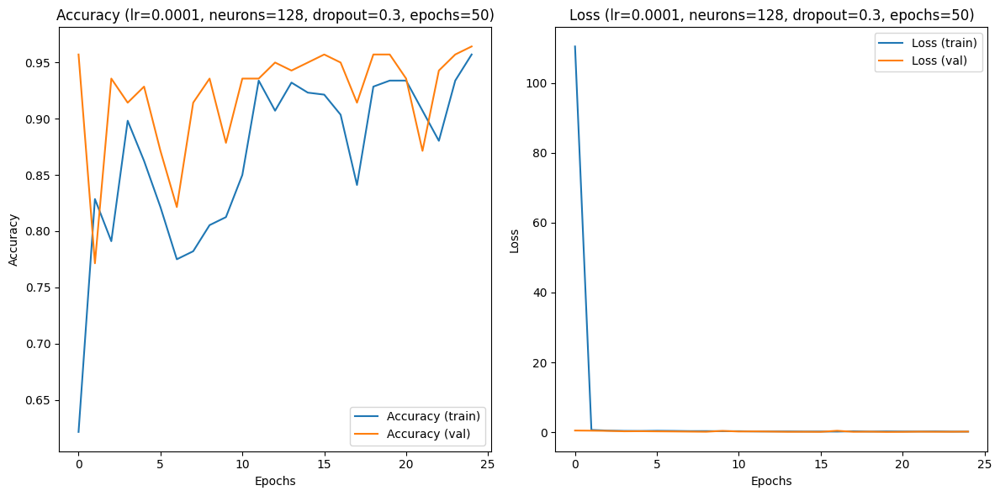

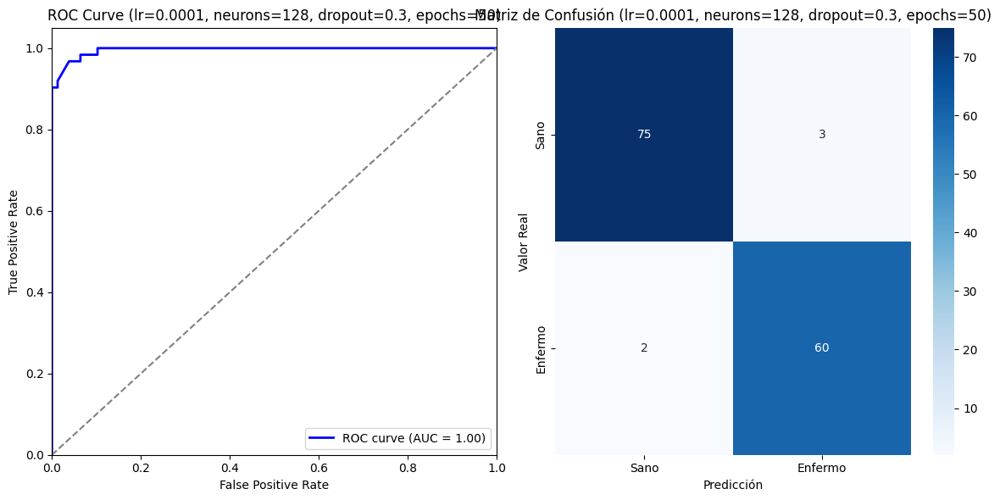

Entrenando con lr=0.0001, neuronas=128, dropout=0.5, epochs=50
Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.5518 - loss: 187.2654
Epoch 1: val_accuracy improved from -inf to 0.90714, saving model to best_model_lr0.0001_neurons128_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.5572 - loss: 183.5296 - val_accuracy: 0.9071 - val_loss: 4.0996
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8584 - loss: 14.9666
Epoch 2: val_accuracy did not improve from 0.90714
18/18 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step - accuracy: 0.8596 - loss: 14.7474 - val_accuracy: 0.8857 - val_loss: 4.8543
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.8995 - loss: 1.9225
Epoch 3: val_accuracy improved from 0.90714 to 0.95000, saving model to best_model_lr0.0001_neurons128_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 484ms/step - accuracy: 0.9004 - loss: 1.8839 - val_accuracy: 0.9500 - val_loss: 0.7516
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9129 - loss: 0.8803
Epoch 4: val_accuracy did not improve from 0.95000
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - accuracy: 0.9118 - loss: 0.8809 - val_accuracy: 0.9500 - val_loss: 0.1075
Epoch 5/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8750 - loss: 0.3803
Epoch 5: val_accuracy did not improve from 0.95000
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 122ms/step - accuracy: 0.8755 - loss: 0.3742 - val_accuracy: 0.9500 - val_loss: 0.1058
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8203 - loss: 0.2190
Epoch 6: val_accuracy did not improve from 0.95000
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - accuracy: 0.8219 - loss: 0.2177 - val_accuracy: 0.9357 - val_loss: 0.2399
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8443 - loss: 0.2183
Epoch 7: val_accuracy improved from 0.9

18/18 ━━━━━━━━━━━━━━━━━━━━ 6s 295ms/step - accuracy: 0.8455 - loss: 0.2176 - val_accuracy: 0.9571 - val_loss: 0.1002
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9123 - loss: 0.1465
Epoch 8: val_accuracy improved from 0.95714 to 0.97857, saving model to best_model_lr0.0001_neurons128_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 6s 344ms/step - accuracy: 0.9112 - loss: 0.1471 - val_accuracy: 0.9786 - val_loss: 0.0674
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.8604 - loss: 0.2162
Epoch 9: val_accuracy did not improve from 0.97857
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - accuracy: 0.8615 - loss: 0.2169 - val_accuracy: 0.9357 - val_loss: 0.1864
Epoch 10/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9346 - loss: 0.2520
Epoch 10: val_accuracy did not improve from 0.97857
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - accuracy: 0.9353 - loss: 0.2530 - val_accuracy: 0.9500 - val_loss: 0.3034
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9332 - loss: 0.2560
Epoch 11: val_accuracy did not improve from 0.97857
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - accuracy: 0.9336 - loss: 0.2552 - val_accuracy: 0.9500 - val_loss: 0.1814
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9350 - loss: 0.1995
Epoch 12: val_accuracy did not imp

5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 795ms/step


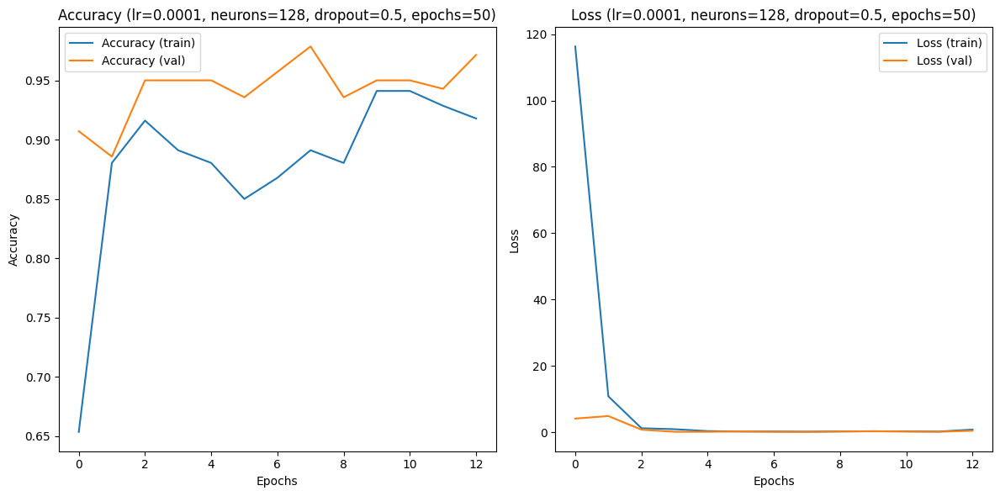

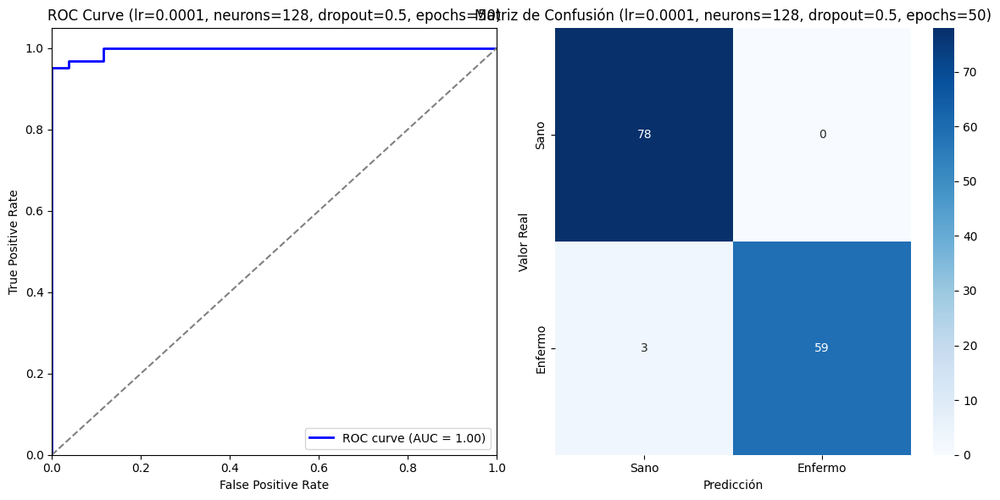

Entrenando con lr=0.0001, neuronas=256, dropout=0.3, epochs=50
Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.5300 - loss: 199.7366
Epoch 1: val_accuracy improved from -inf to 0.81429, saving model to best_model_lr0.0001_neurons256_dropout0.3_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - accuracy: 0.5352 - loss: 196.5969 - val_accuracy: 0.8143 - val_loss: 34.6238
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9011 - loss: 20.9271
Epoch 2: val_accuracy improved from 0.81429 to 0.94286, saving model to best_model_lr0.0001_neurons256_dropout0.3_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 33s 898ms/step - accuracy: 0.9019 - loss: 20.5290 - val_accuracy: 0.9429 - val_loss: 6.9094
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9413 - loss: 8.2485
Epoch 3: val_accuracy did not improve from 0.94286
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - accuracy: 0.9416 - loss: 8.1919 - val_accuracy: 0.9286 - val_loss: 8.4324
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9706 - loss: 3.0756
Epoch 4: val_accuracy improved from 0.94286 to 0.96429, saving model to best_model_lr0.0001_neurons256_dropout0.3_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 508ms/step - accuracy: 0.9707 - loss: 3.0614 - val_accuracy: 0.9643 - val_loss: 3.7985
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.9698 - loss: 3.1459
Epoch 5: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - accuracy: 0.9700 - loss: 3.1719 - val_accuracy: 0.9643 - val_loss: 2.9214
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9620 - loss: 2.9243
Epoch 6: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - accuracy: 0.9620 - loss: 2.9352 - val_accuracy: 0.9643 - val_loss: 1.5191
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9811 - loss: 0.9959
Epoch 7: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - accuracy: 0.9810 - loss: 1.0183 - val_accuracy: 0.9357 - val_loss: 2.6832
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9786 - loss: 1.2034
Epoch 8: val_accuracy did not improve f

18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 485ms/step - accuracy: 0.9673 - loss: 0.8853 - val_accuracy: 0.9786 - val_loss: 0.6266
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9762 - loss: 0.4497
Epoch 10: val_accuracy did not improve from 0.97857
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - accuracy: 0.9764 - loss: 0.4579 - val_accuracy: 0.9571 - val_loss: 1.0128
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9828 - loss: 0.6062
Epoch 11: val_accuracy did not improve from 0.97857
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - accuracy: 0.9827 - loss: 0.6166 - val_accuracy: 0.9500 - val_loss: 1.3186
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9767 - loss: 0.6388
Epoch 12: val_accuracy did not improve from 0.97857
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - accuracy: 0.9767 - loss: 0.6421 - val_accuracy: 0.9357 - val_loss: 2.8746
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9625 - loss: 1.8680
Epoch 13: val_accuracy did not i

4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step 

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 830ms/step


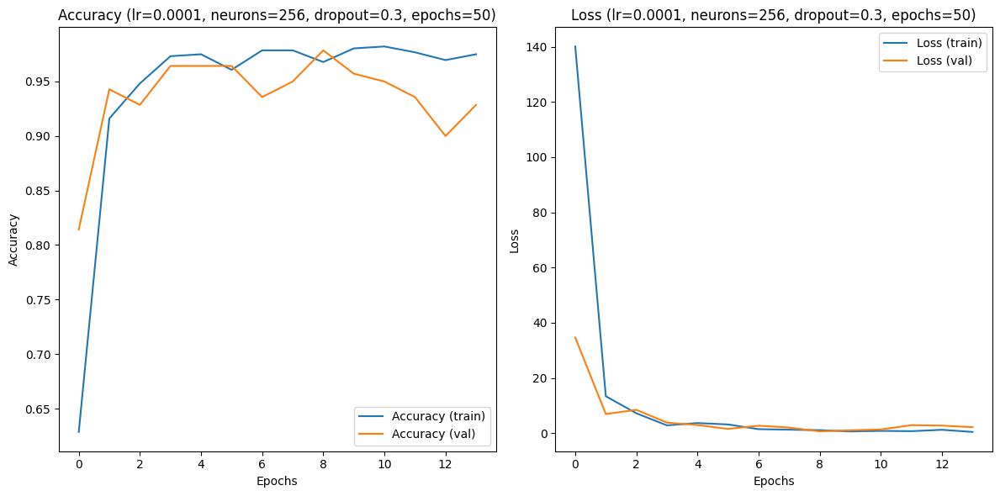

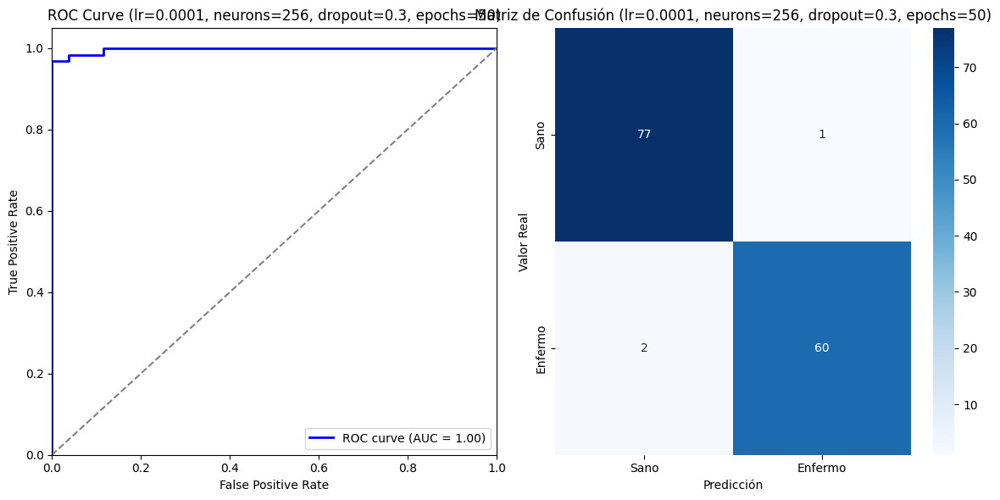

Entrenando con lr=0.0001, neuronas=256, dropout=0.5, epochs=50
Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step - accuracy: 0.5746 - loss: 275.4886
Epoch 1: val_accuracy improved from -inf to 0.75714, saving model to best_model_lr0.0001_neurons256_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.5785 - loss: 269.2715 - val_accuracy: 0.7571 - val_loss: 35.3839
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.8734 - loss: 14.6559
Epoch 2: val_accuracy improved from 0.75714 to 0.93571, saving model to best_model_lr0.0001_neurons256_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.8750 - loss: 14.3771 - val_accuracy: 0.9357 - val_loss: 5.3743
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9444 - loss: 3.9305
Epoch 3: val_accuracy improved from 0.93571 to 0.95000, saving model to best_model_lr0.0001_neurons256_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.9449 - loss: 3.8835 - val_accuracy: 0.9500 - val_loss: 1.4773
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9574 - loss: 1.0248
Epoch 4: val_accuracy did not improve from 0.95000
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - accuracy: 0.9574 - loss: 1.0462 - val_accuracy: 0.9286 - val_loss: 2.8192
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9523 - loss: 1.4975
Epoch 5: val_accuracy improved from 0.95000 to 0.95714, saving model to best_model_lr0.0001_neurons256_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.9530 - loss: 1.4716 - val_accuracy: 0.9571 - val_loss: 0.7446
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9745 - loss: 0.3895
Epoch 6: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - accuracy: 0.9744 - loss: 0.3913 - val_accuracy: 0.9214 - val_loss: 0.6658
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9185 - loss: 0.4568
Epoch 7: val_accuracy improved from 0.95714 to 0.97143, saving model to best_model_lr0.0001_neurons256_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 17s 880ms/step - accuracy: 0.9191 - loss: 0.4540 - val_accuracy: 0.9714 - val_loss: 0.0697
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9195 - loss: 0.1493
Epoch 8: val_accuracy did not improve from 0.97143
18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - accuracy: 0.9207 - loss: 0.1485 - val_accuracy: 0.9500 - val_loss: 0.0615
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9276 - loss: 0.1520
Epoch 9: val_accuracy did not improve from 0.97143
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - accuracy: 0.9281 - loss: 0.1546 - val_accuracy: 0.9643 - val_loss: 0.1038
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9327 - loss: 0.1680
Epoch 10: val_accuracy did not improve from 0.97143
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - accuracy: 0.9326 - loss: 0.1696 - val_accuracy: 0.9429 - val_loss: 0.0905
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9405 - loss: 0.1146
Epoch 11: val_accuracy did not impr

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 959ms/step


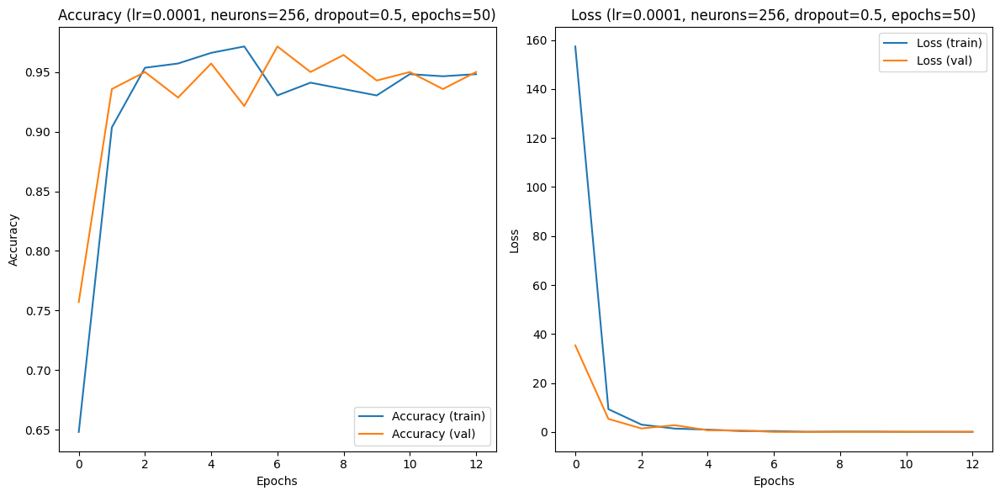

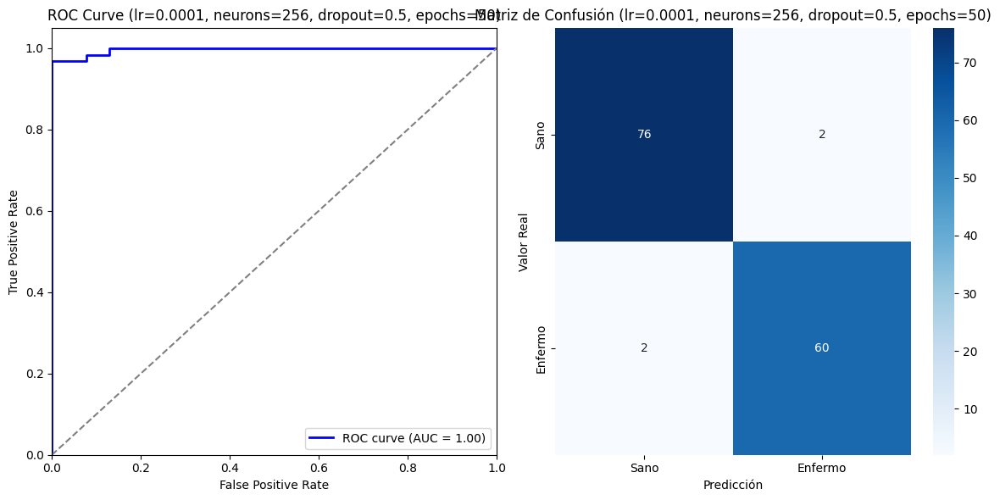

Entrenando con lr=0.001, neuronas=128, dropout=0.3, epochs=50
Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.6868 - loss: 550.4533
Epoch 1: val_accuracy improved from -inf to 0.95714, saving model to best_model_lr0.001_neurons128_dropout0.3_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.6928 - loss: 536.9835 - val_accuracy: 0.9571 - val_loss: 15.7942
Epoch 2/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9391 - loss: 27.8671
Epoch 2: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - accuracy: 0.9406 - loss: 27.1036 - val_accuracy: 0.9571 - val_loss: 14.3072
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9745 - loss: 8.5425
Epoch 3: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 142ms/step - accuracy: 0.9735 - loss: 8.8109 - val_accuracy: 0.9571 - val_loss: 6.6779
Epoch 4/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9799 - loss: 3.2604
Epoch 4: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - accuracy: 0.9784 - loss: 3.4086 - val_accuracy: 0.9286 - val_loss: 9.3807
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.9475 - loss: 5.6441
Epoch 5: val_accuracy improved fro

18/18 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.9479 - loss: 5.5580 - val_accuracy: 0.9643 - val_loss: 3.7781
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9757 - loss: 3.3945
Epoch 6: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 139ms/step - accuracy: 0.9751 - loss: 3.4233 - val_accuracy: 0.9357 - val_loss: 2.8718
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.9425 - loss: 1.5509
Epoch 7: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9416 - loss: 1.5443 - val_accuracy: 0.9643 - val_loss: 0.5949
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8476 - loss: 23.5127
Epoch 8: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - accuracy: 0.8465 - loss: 23.1087 - val_accuracy: 0.7429 - val_loss: 0.4455
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.7101 - loss: 7.2815
Epoch 9: val_accuracy did not improve f

5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 850ms/step


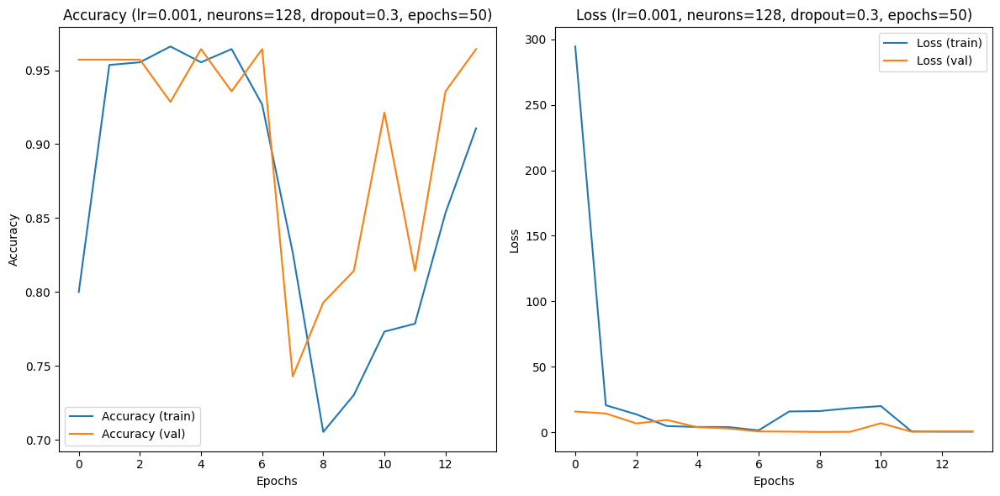

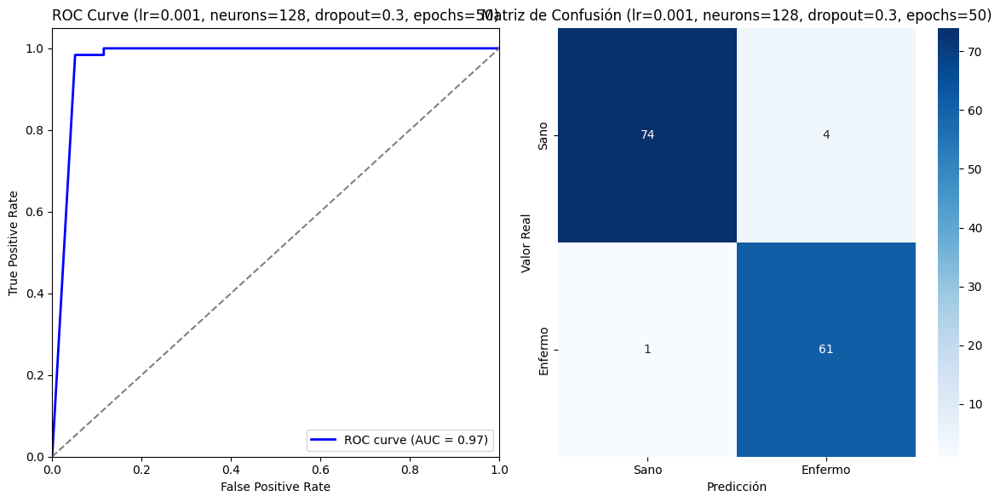

Entrenando con lr=0.001, neuronas=128, dropout=0.5, epochs=50
Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - accuracy: 0.5492 - loss: 1326.7900
Epoch 1: val_accuracy improved from -inf to 0.62857, saving model to best_model_lr0.001_neurons128_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - accuracy: 0.5532 - loss: 1312.1947 - val_accuracy: 0.6286 - val_loss: 834.4126
Epoch 2/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.8003 - loss: 351.9128
Epoch 2: val_accuracy improved from 0.62857 to 0.94286, saving model to best_model_lr0.001_neurons128_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.8072 - loss: 333.5720 - val_accuracy: 0.9429 - val_loss: 35.8942
Epoch 3/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9525 - loss: 36.9319
Epoch 3: val_accuracy did not improve from 0.94286
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step - accuracy: 0.9515 - loss: 37.7199 - val_accuracy: 0.9429 - val_loss: 25.5588
Epoch 4/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9374 - loss: 16.4839
Epoch 4: val_accuracy improved from 0.94286 to 0.95000, saving model to best_model_lr0.001_neurons128_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 13s 746ms/step - accuracy: 0.9389 - loss: 16.6393 - val_accuracy: 0.9500 - val_loss: 16.3275
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9173 - loss: 8.3479
Epoch 5: val_accuracy improved from 0.95000 to 0.95714, saving model to best_model_lr0.001_neurons128_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 22s 816ms/step - accuracy: 0.9178 - loss: 8.2472 - val_accuracy: 0.9571 - val_loss: 0.6756
Epoch 6/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.8715 - loss: 0.3778
Epoch 6: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8741 - loss: 0.3900 - val_accuracy: 0.9500 - val_loss: 0.2185
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9038 - loss: 0.3300
Epoch 7: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - accuracy: 0.9032 - loss: 0.3301 - val_accuracy: 0.9429 - val_loss: 0.2994
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8896 - loss: 0.3480
Epoch 8: val_accuracy improved from 0.95714 to 0.96429, saving model to best_model_lr0.001_neurons128_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - accuracy: 0.8902 - loss: 0.3466 - val_accuracy: 0.9643 - val_loss: 0.2505
Epoch 9/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9170 - loss: 0.3088
Epoch 9: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.9180 - loss: 0.3057 - val_accuracy: 0.9643 - val_loss: 0.2191
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9410 - loss: 0.2466
Epoch 10: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 138ms/step - accuracy: 0.9410 - loss: 0.2452 - val_accuracy: 0.9643 - val_loss: 0.1327
Epoch 11/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9315 - loss: 0.2433
Epoch 11: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - accuracy: 0.9321 - loss: 0.2433 - val_accuracy: 0.9500 - val_loss: 0.2156
Epoch 12/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9360 - loss: 0.2418
Epoch 12: val_accuracy did not impro

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 778ms/step


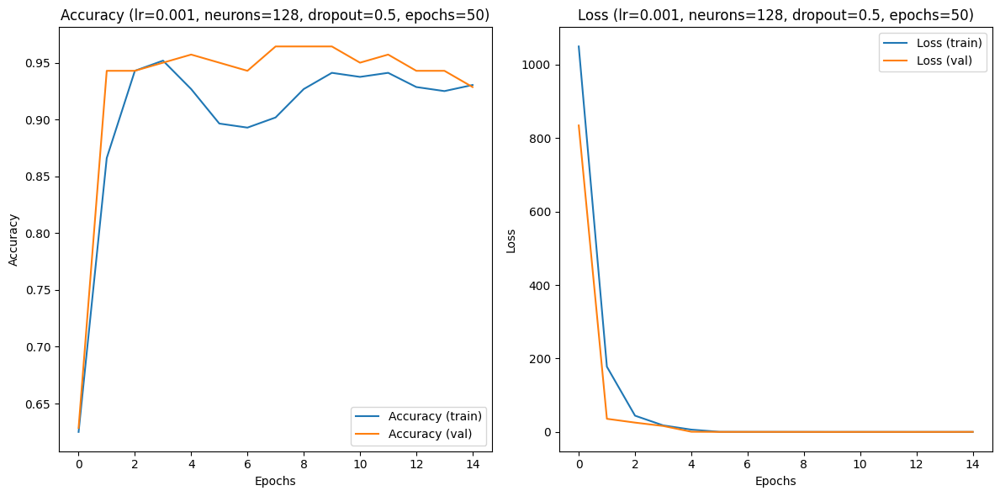

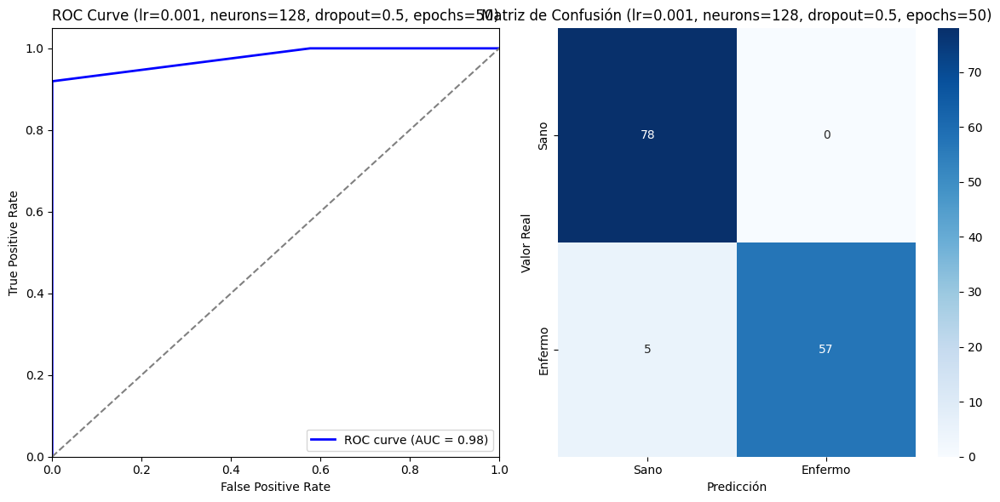

Entrenando con lr=0.001, neuronas=256, dropout=0.3, epochs=50
Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.5869 - loss: 1807.7324
Epoch 1: val_accuracy improved from -inf to 0.85714, saving model to best_model_lr0.001_neurons256_dropout0.3_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.5908 - loss: 1762.3257 - val_accuracy: 0.8571 - val_loss: 56.5399
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9048 - loss: 46.8959
Epoch 2: val_accuracy improved from 0.85714 to 0.95000, saving model to best_model_lr0.001_neurons256_dropout0.3_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.9060 - loss: 45.6817 - val_accuracy: 0.9500 - val_loss: 11.0661
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9507 - loss: 12.4163
Epoch 3: val_accuracy did not improve from 0.95000
18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - accuracy: 0.9505 - loss: 12.3415 - val_accuracy: 0.9286 - val_loss: 12.1258
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9412 - loss: 5.3081
Epoch 4: val_accuracy did not improve from 0.95000
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - accuracy: 0.9419 - loss: 5.2129 - val_accuracy: 0.9500 - val_loss: 0.3181
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9764 - loss: 0.1305
Epoch 5: val_accuracy did not improve from 0.95000
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 134ms/step - accuracy: 0.9759 - loss: 0.1326 - val_accuracy: 0.9500 - val_loss: 0.1062
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9485 - loss: 0.2284
Epoch 6: val_accuracy improved from 

18/18 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9481 - loss: 0.2269 - val_accuracy: 0.9571 - val_loss: 0.1072
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9583 - loss: 0.1213
Epoch 7: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - accuracy: 0.9581 - loss: 0.1209 - val_accuracy: 0.9571 - val_loss: 0.0967
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9458 - loss: 0.0995
Epoch 8: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - accuracy: 0.9461 - loss: 0.0997 - val_accuracy: 0.9286 - val_loss: 0.1345
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9309 - loss: 0.1262
Epoch 9: val_accuracy did not improve from 0.95714
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 144ms/step - accuracy: 0.9314 - loss: 0.1250 - val_accuracy: 0.9429 - val_loss: 0.0868
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.9408 - loss: 0.0870
Epoch 10: val_accuracy improved from 0.9

18/18 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9413 - loss: 0.0863 - val_accuracy: 0.9643 - val_loss: 0.1433
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9589 - loss: 0.0997
Epoch 11: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - accuracy: 0.9579 - loss: 0.1010 - val_accuracy: 0.9500 - val_loss: 0.1553
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9398 - loss: 0.0722
Epoch 12: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - accuracy: 0.9401 - loss: 0.0721 - val_accuracy: 0.9571 - val_loss: 0.2171
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9629 - loss: 0.0608
Epoch 13: val_accuracy did not improve from 0.96429
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - accuracy: 0.9627 - loss: 0.0611 - val_accuracy: 0.9429 - val_loss: 0.2862
Epoch 14/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9531 - loss: 0.1004
Epoch 14: val_accuracy did not im

5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 815ms/step


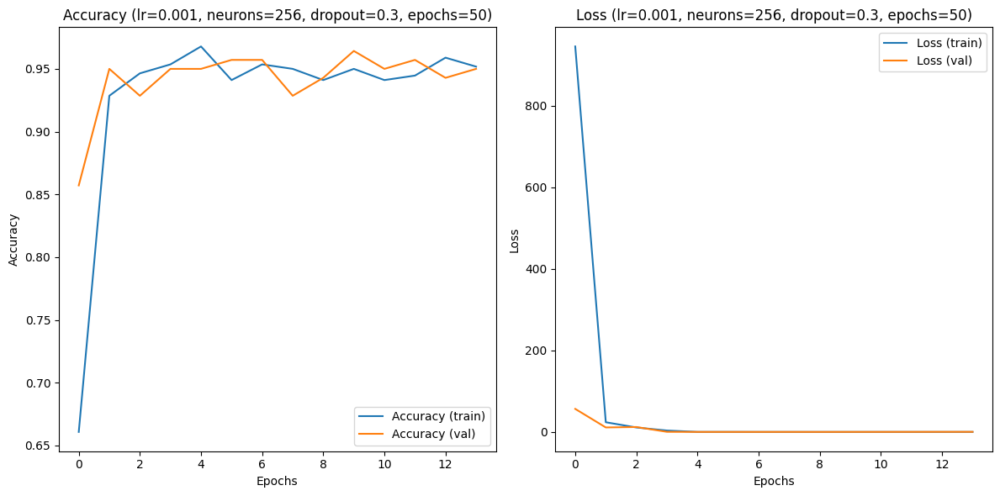

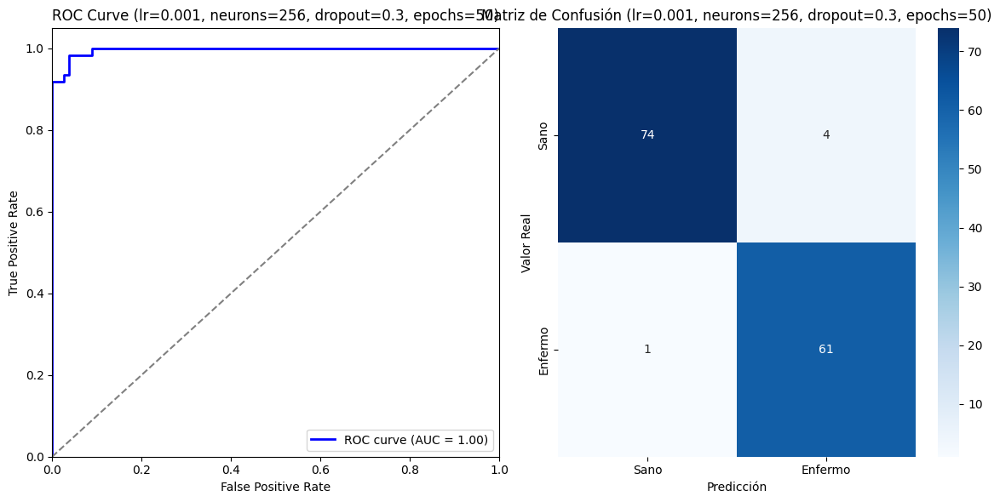

Entrenando con lr=0.001, neuronas=256, dropout=0.5, epochs=50
Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - accuracy: 0.5649 - loss: 2445.2559
Epoch 1: val_accuracy improved from -inf to 0.90714, saving model to best_model_lr0.001_neurons256_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.5706 - loss: 2394.9199 - val_accuracy: 0.9071 - val_loss: 119.0612
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9134 - loss: 106.7160
Epoch 2: val_accuracy improved from 0.90714 to 0.94286, saving model to best_model_lr0.001_neurons256_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - accuracy: 0.9145 - loss: 105.3281 - val_accuracy: 0.9429 - val_loss: 35.4774
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9421 - loss: 39.2292
Epoch 3: val_accuracy did not improve from 0.94286
18/18 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - accuracy: 0.9427 - loss: 38.8751 - val_accuracy: 0.9357 - val_loss: 32.1797
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9547 - loss: 23.0662
Epoch 4: val_accuracy did not improve from 0.94286
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - accuracy: 0.9549 - loss: 22.9336 - val_accuracy: 0.9429 - val_loss: 8.8387
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9562 - loss: 9.5692
Epoch 5: val_accuracy did not improve from 0.94286
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 133ms/step - accuracy: 0.9556 - loss: 9.6727 - val_accuracy: 0.9429 - val_loss: 5.7730
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9509 - loss: 3.7446
Epoch 6: val_accuracy improved f

18/18 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.9509 - loss: 3.7071 - val_accuracy: 0.9500 - val_loss: 1.7531
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9153 - loss: 0.3899
Epoch 7: val_accuracy did not improve from 0.95000
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - accuracy: 0.9148 - loss: 0.3883 - val_accuracy: 0.9071 - val_loss: 0.2120
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.8784 - loss: 0.2107
Epoch 8: val_accuracy improved from 0.95000 to 0.98571, saving model to best_model_lr0.001_neurons256_dropout0.5_epochs50.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.8788 - loss: 0.2089 - val_accuracy: 0.9857 - val_loss: 0.0691
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9218 - loss: 0.1527
Epoch 9: val_accuracy did not improve from 0.98571
18/18 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - accuracy: 0.9215 - loss: 0.1524 - val_accuracy: 0.9786 - val_loss: 0.0981
Epoch 10/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9238 - loss: 0.1663
Epoch 10: val_accuracy did not improve from 0.98571
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - accuracy: 0.9225 - loss: 0.1668 - val_accuracy: 0.9786 - val_loss: 0.0702
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.8857 - loss: 0.1583
Epoch 11: val_accuracy did not improve from 0.98571
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - accuracy: 0.8854 - loss: 0.1577 - val_accuracy: 0.9857 - val_loss: 0.0615
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.8459 - loss: 6.9648
Epoch 12: val_accuracy did not impr

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 942ms/step


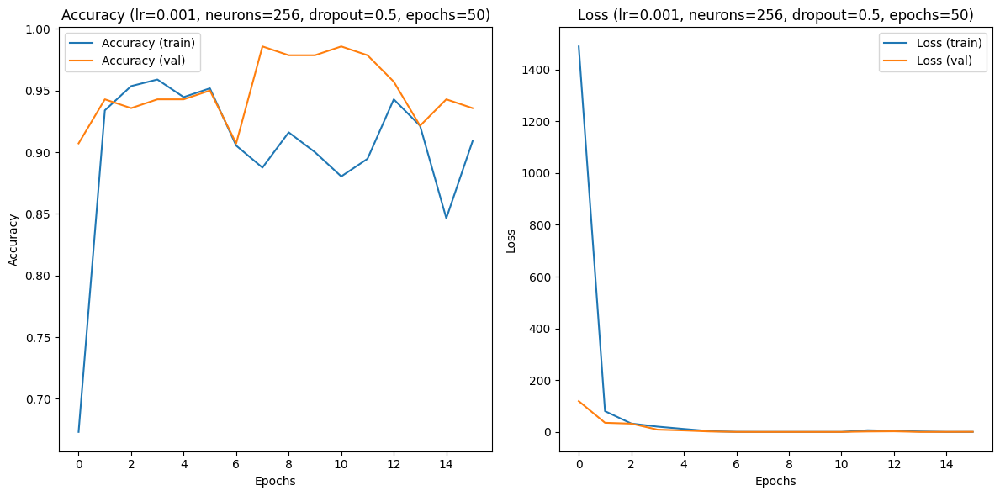

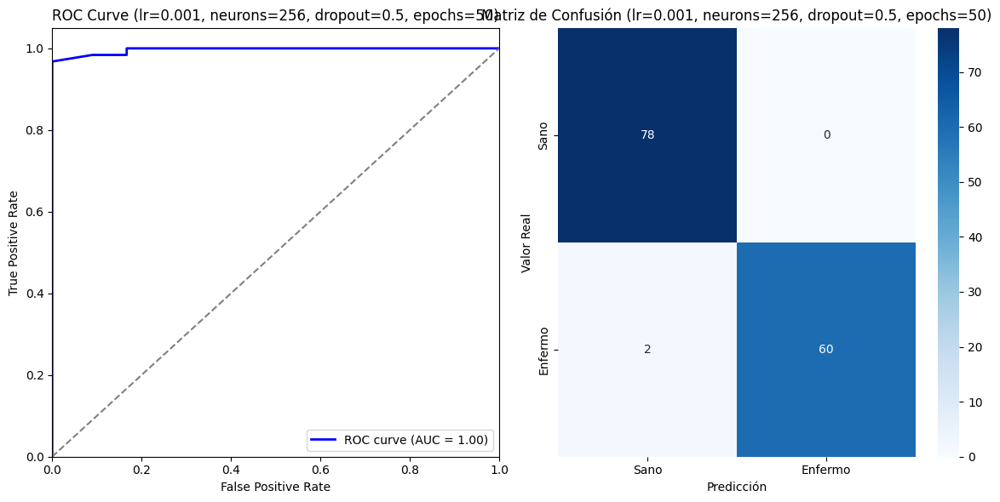

       lr  neurons  dropout  epochs   val_acc   val_auc  sensitivity  \
0  0.0001      128      0.3      50  0.964286  0.995864     0.967742   
1  0.0001      128      0.5      50  0.978571  0.995658     0.951613   
2  0.0001      256      0.3      50  0.978571  0.997519     0.967742   
3  0.0001      256      0.5      50  0.971429  0.996691     0.967742   
4  0.0010      128      0.3      50  0.964286  0.972911     0.983871   
5  0.0010      128      0.5      50  0.964286  0.976737     0.919355   
6  0.0010      256      0.3      50  0.964286  0.996278     0.983871   
7  0.0010      256      0.5      50  0.985714  0.996588     0.967742   

   specificity  f1_score  
0     0.961538  0.960000  
1     1.000000  0.975207  
2     0.987179  0.975610  
3     0.974359  0.967742  
4     0.948718  0.960630  
5     1.000000  0.957983  
6     0.948718  0.960630  
7     1.000000  0.983607  


In [ ]:
# Configuración de la semilla para la reproducibilidad
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# Hiperparámetros a probar
learning_rates = [0.0001, 0.001]
num_neurons_list = [128, 256]
dropout_rates = [0.3, 0.5]
num_epochs_list = [50]

# Almacenar resultados
results = []

# Función para liberar memoria
def clear_memory():
    gc.collect()

for lr in learning_rates:
    for num_neurons in num_neurons_list:
        for dropout_rate in dropout_rates:
            for epochs in num_epochs_list:
                print(f"Entrenando con lr={lr}, neuronas={num_neurons}, dropout={dropout_rate}, epochs={epochs}")

                # Crear y compilar el modelo
                model = build_model(num_neurons, dropout_rate)
                optimizer = Adam(learning_rate=lr)
                model.compile(optimizer=optimizer, loss="binary_crossentropy", metrics=["accuracy"])

                # Nombre para guardar el modelo con mejor val_accuracy
                model_filename = f"best_model_lr{lr}_neurons{num_neurons}_dropout{dropout_rate}_epochs{epochs}.h5"

                # Configuración de callbacks: guardar el mejor modelo
                callbacks = [
                    ModelCheckpoint(model_filename, save_best_only=True, monitor="val_accuracy", mode="max", verbose=1),
                    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
                ]

                # Entrenamiento del modelo
                history = model.fit(
                    X_train, y_train,
                    epochs=epochs,
                    batch_size=32,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=(X_validation, y_validation)
                )

                # Liberar memoria de los modelos no necesarios
                del model
                clear_memory()

                # Cargar el mejor modelo
                best_model = load_model(model_filename)

                # Obtener predicciones del mejor modelo
                y_pred_probs = best_model.predict(X_validation)  # Probabilidades
                y_pred = (y_pred_probs > 0.5).astype(int)  # Convertir a clases (0 o 1)

                # Calcular AUC
                fpr, tpr, _ = roc_curve(y_validation, y_pred_probs)
                roc_auc = auc(fpr, tpr)

                # Generar la matriz de confusión
                cm = confusion_matrix(y_validation, y_pred)

                # Extraer valores de la matriz de confusión
                TN, FP, FN, TP = cm.ravel()

                # Calcular sensibilidad y especificidad
                sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0
                specificity = TN / (TN + FP) if (TN + FP) > 0 else 0

                # Calcular la precisión de validación
                val_acc = accuracy_score(y_validation, y_pred)

                # Calcular F1-score
                f1 = f1_score(y_validation, y_pred)

                # Almacenar resultados de las métricas
                results.append({
                    "lr": lr,
                    "neurons": num_neurons,
                    "dropout": dropout_rate,
                    "epochs": epochs,
                    "val_acc": val_acc,
                    "val_auc": roc_auc,
                    "sensitivity": sensitivity,
                    "specificity": specificity,
                    "f1_score": f1
                })

                # Graficas para el entrenamiento actual (accuracy y loss)
                plt.figure(figsize=(12, 6))
                plt.subplot(1, 2, 1)
                plt.plot(history.history['accuracy'], label='Accuracy (train)')
                plt.plot(history.history['val_accuracy'], label='Accuracy (val)')
                plt.title(f'Accuracy (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
                plt.xlabel('Epochs')
                plt.ylabel('Accuracy')
                plt.legend()

                plt.subplot(1, 2, 2)
                plt.plot(history.history['loss'], label='Loss (train)')
                plt.plot(history.history['val_loss'], label='Loss (val)')
                plt.title(f'Loss (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
                plt.xlabel('Epochs')
                plt.ylabel('Loss')
                plt.legend()

                plt.tight_layout()
                plt.show()

                # Graficar la curva ROC
                plt.figure(figsize=(12, 6))
                plt.subplot(1, 2, 1)
                plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
                plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Línea diagonal
                plt.xlim([0.0, 1.0])
                plt.ylim([0.0, 1.05])
                plt.xlabel('False Positive Rate')
                plt.ylabel('True Positive Rate')
                plt.title(f'ROC Curve (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
                plt.legend(loc="lower right")

                # Graficar la matriz de confusión
                plt.subplot(1, 2, 2)
                sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Sano", "Enfermo"], yticklabels=["Sano", "Enfermo"])
                plt.xlabel('Predicción')
                plt.ylabel('Valor Real')
                plt.title(f'Matriz de Confusión (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')

                # Mostrar los gráficos
                plt.tight_layout()
                plt.show()

                # Liberar memoria después de mostrar gráficos
                clear_memory()

# Mostrar los resultados finales en tabla
results_df = pd.DataFrame(results)
print(results_df)

# Opcional: Guardar en CSV para análisis posterior
results_df.to_csv("experimentos_resultados_binario.csv", index=False)

Escogemos el modelo que **maximiza el accuracy de validación y el área bajo la curva ROC**. No obstante, dado que varios modelos presentan un desempeño muy similar en estas métricas, priorizamos aquel con la **mayor sensibilidad**. Esta decisión se fundamenta en la naturaleza del problema, donde consideramos que es más importante detectar correctamente los casos positivos de COVID-19, ya que un falso negativo podría implicar el no aislamiento oportuno de un paciente infectado, aumentando así el riesgo de propagación y retrasando el inicio de un tratamiento adecuado. Por lo tanto, consideramos que en este contexto es preferible maximizar la sensibilidad, aún si esto implica sacrificar en cierta medida la especificidad. De esta manera, los hiperparámetros escogidos son los siguientes:

* **lr = 0.001, neuronas = 256, dropout = 0.3**


#### **7.A Entrenamiento del modelo final y evaluación sobre el conjunto de test**

Una vez identificados los mejores hiperparámetros, procedemos a **entrenar el modelo final** utilizando la combinación óptima de parámetros. Para maximizar el aprovechamiento de los datos disponibles y mejorar la capacidad generalizadora del modelo, este entrenamiento se realiza utilizando el conjunto completo de train y validation, asegurando así que el modelo final haya aprendido de la mayor cantidad de ejemplos posible antes de evaluarse sobre el conjunto de test.

Para ello, primero debemos juntar los conjuntos de entrenamiento y validacion en uno solo:

In [ ]:
# Concatenamos X_train con X_validation
X_train = np.concatenate((X_train, X_validation), axis=0)

# Concatenamos y_train con y_validation
y_train = np.concatenate((y_train, y_validation), axis=0)

Entrenamos con los datos de entrenamiento y validación conjuntamente y evaluamos sobre el conjunto de test.

Epoch 1/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.6069 - loss: 1651.9142
Epoch 1: val_accuracy improved from -inf to 0.94318, saving model to best_model_test.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 72s 4s/step - accuracy: 0.6122 - loss: 1614.7368 - val_accuracy: 0.9432 - val_loss: 55.8661
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9014 - loss: 126.1667
Epoch 2: val_accuracy did not improve from 0.94318
18/18 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - accuracy: 0.9024 - loss: 124.6056 - val_accuracy: 0.9432 - val_loss: 87.3097
Epoch 3/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9648 - loss: 37.5582
Epoch 3: val_accuracy improved from 0.94318 to 0.94886, saving model to best_model_test.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 69s 4s/step - accuracy: 0.9651 - loss: 36.9596 - val_accuracy: 0.9489 - val_loss: 70.4681
Epoch 4/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9679 - loss: 22.3529
Epoch 4: val_accuracy improved from 0.94886 to 0.96023, saving model to best_model_test.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 93s 5s/step - accuracy: 0.9679 - loss: 22.3424 - val_accuracy: 0.9602 - val_loss: 48.7612
Epoch 5/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9731 - loss: 14.4754
Epoch 5: val_accuracy improved from 0.96023 to 0.96591, saving model to best_model_test.h5


18/18 ━━━━━━━━━━━━━━━━━━━━ 84s 5s/step - accuracy: 0.9733 - loss: 14.3561 - val_accuracy: 0.9659 - val_loss: 13.0379
Epoch 6/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9723 - loss: 11.6690
Epoch 6: val_accuracy did not improve from 0.96591
18/18 ━━━━━━━━━━━━━━━━━━━━ 61s 121ms/step - accuracy: 0.9724 - loss: 11.7720 - val_accuracy: 0.9432 - val_loss: 37.3466
Epoch 7/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9540 - loss: 7.5985
Epoch 7: val_accuracy did not improve from 0.96591
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - accuracy: 0.9546 - loss: 7.6162 - val_accuracy: 0.9659 - val_loss: 15.5038
Epoch 8/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9779 - loss: 4.5503
Epoch 8: val_accuracy did not improve from 0.96591
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - accuracy: 0.9776 - loss: 4.7176 - val_accuracy: 0.8920 - val_loss: 38.1695
Epoch 9/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9539 - loss: 4.4569
Epoch 9: val_accuracy did not imp

18/18 ━━━━━━━━━━━━━━━━━━━━ 95s 6s/step - accuracy: 0.9757 - loss: 1.7975 - val_accuracy: 0.9716 - val_loss: 2.1464
Epoch 11/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9732 - loss: 2.6775
Epoch 11: val_accuracy did not improve from 0.97159
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - accuracy: 0.9731 - loss: 2.6438 - val_accuracy: 0.9716 - val_loss: 1.5426
Epoch 12/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9684 - loss: 0.7796
Epoch 12: val_accuracy did not improve from 0.97159
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - accuracy: 0.9687 - loss: 0.7813 - val_accuracy: 0.9716 - val_loss: 1.2974
Epoch 13/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9618 - loss: 1.1253
Epoch 13: val_accuracy did not improve from 0.97159
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - accuracy: 0.9610 - loss: 1.1086 - val_accuracy: 0.8352 - val_loss: 0.1645
Epoch 14/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.8685 - loss: 0.1261
Epoch 14: val_accuracy did not imp

18/18 ━━━━━━━━━━━━━━━━━━━━ 89s 5s/step - accuracy: 0.9766 - loss: 0.0569 - val_accuracy: 0.9773 - val_loss: 0.4365
Epoch 18/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9702 - loss: 0.0353
Epoch 18: val_accuracy did not improve from 0.97727
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - accuracy: 0.9705 - loss: 0.0351 - val_accuracy: 0.9773 - val_loss: 0.5471
Epoch 19/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9793 - loss: 0.2003
Epoch 19: val_accuracy did not improve from 0.97727
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - accuracy: 0.9787 - loss: 0.2041 - val_accuracy: 0.9659 - val_loss: 0.0609
Epoch 20/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9338 - loss: 0.1618
Epoch 20: val_accuracy did not improve from 0.97727
18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - accuracy: 0.9352 - loss: 0.1580 - val_accuracy: 0.9659 - val_loss: 0.2679
Epoch 21/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9439 - loss: 0.0825
Epoch 21: val_accuracy did not imp

18/18 ━━━━━━━━━━━━━━━━━━━━ 141s 8s/step - accuracy: 0.9655 - loss: 0.1391 - val_accuracy: 0.9830 - val_loss: 0.1332
Epoch 29/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9406 - loss: 0.1511
Epoch 29: val_accuracy did not improve from 0.98295
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9407 - loss: 0.1493 - val_accuracy: 0.9716 - val_loss: 0.1226


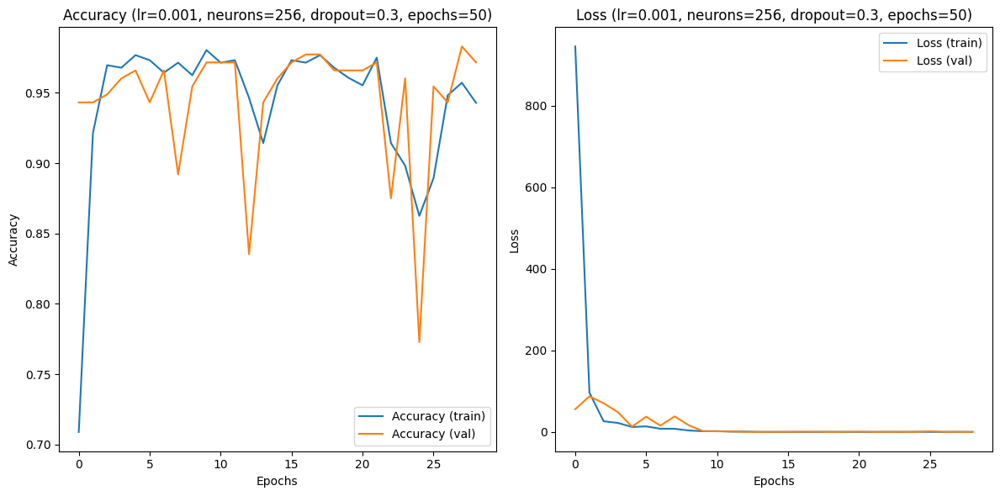

6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 726ms/step


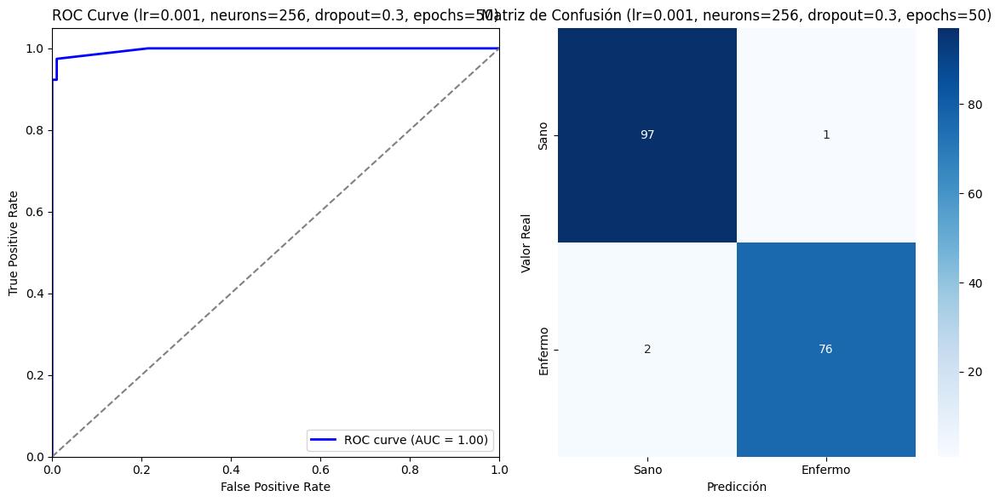

Accuracy: 0.9830
Sensibilidad (Recall Positivo): 0.9744
Especificidad (Recall Negativo): 0.9898
AUC: 0.9966


In [ ]:
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# Mejores hiperparámetros
num_neurons = 256
dropout_rate = 0.3
lr = 0.001
epochs = 50

# Creamos y compilar el modelo
model = build_model(num_neurons, dropout_rate)
optimizer = Adam(learning_rate=lr)
model.compile(optimizer=optimizer, loss="binary_crossentropy", metrics=["accuracy"])

# Nombre para guardar el modelo con mejor test_accuracy
model_filename = f"best_model_test.h5"

# Configuración de callbacks: guardar el mejor modelo
callbacks = [
    ModelCheckpoint(model_filename, save_best_only=True, monitor="val_accuracy", mode="max", verbose=1),
    EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
]

# Entrenamiento del modelo
history = model.fit(
    X_train, y_train,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    callbacks=callbacks,
    validation_data=(X_test, y_test)
)

# Grafica de accuracy y loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Accuracy (train)')
plt.plot(history.history['val_accuracy'], label='Accuracy (val)')
plt.title(f'Accuracy (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Loss (train)')
plt.plot(history.history['val_loss'], label='Loss (val)')
plt.title(f'Loss (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Cargamos el mejor modelo guardado
best_model = load_model(model_filename)

# Realizamos predicciones con el modelo mejorado
y_pred_probs = best_model.predict(X_test)  # Probabilidades
y_pred = (y_pred_probs > 0.5).astype(int)  # Convertir a clases (0 o 1) con umbral 0.5

# Calculamos la curva ROC y AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)

# Grafica de la curva ROC
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curve (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
plt.legend(loc="lower right")

# Generar y graficar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)
plt.subplot(1, 2, 2)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Sano", "Enfermo"], yticklabels=["Sano", "Enfermo"])
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.title(f'Matriz de Confusión (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')

plt.tight_layout()
plt.show()

# Calcular métricas adicionales
tn, fp, fn, tp = cm.ravel()

accuracy = (tp + tn) / (tp + tn + fp + fn)
sensibilidad = tp / (tp + fn)  # Recall clase positiva
especificidad = tn / (tn + fp)  # Recall clase negativa

print(f"Accuracy: {accuracy:.4f}")
print(f"Sensibilidad (Recall Positivo): {sensibilidad:.4f}")
print(f"Especificidad (Recall Negativo): {especificidad:.4f}")
print(f"AUC: {roc_auc:.4f}")

#### **8.A Interpretrabilidad del modelo usando CAM**

A continuación, mostraremos la **interpretabilidad** del modelo, con la técnica **CAM** para mostrar las partes donde el modelo ha hecho mas énfasis a la hora de tomar decisiones.

Generando Grad-CAM para la clase 0...


<ipython-input-18-f7ea9d2b5ae9>:40: RuntimeWarning: invalid value encountered in divide
  heatmap /= np.max(heatmap)  # Normalizar
<ipython-input-18-f7ea9d2b5ae9>:51: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


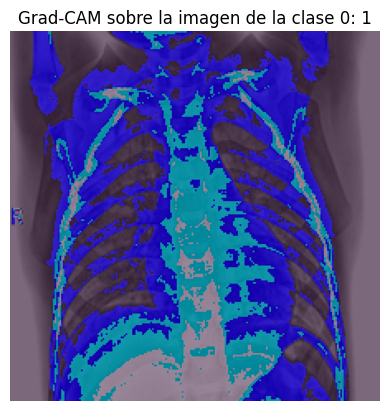

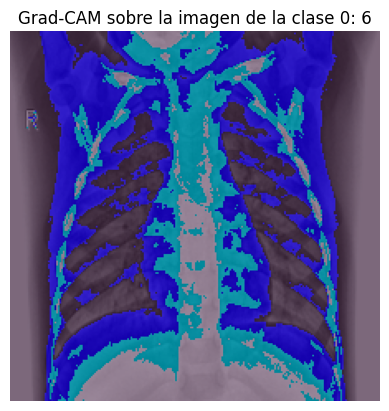

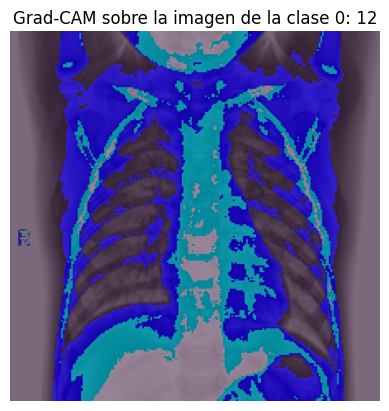

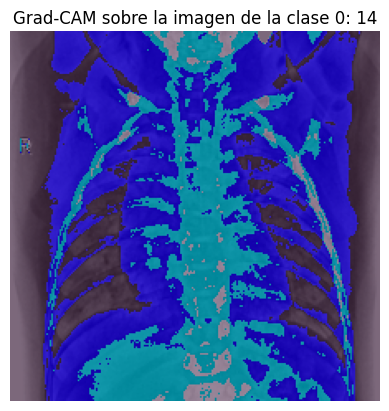

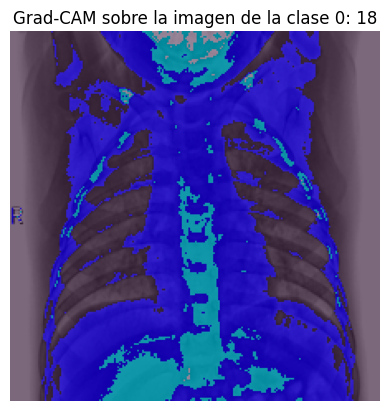

Generando Grad-CAM para la clase 1...


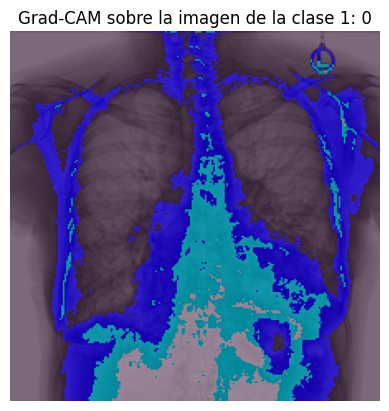

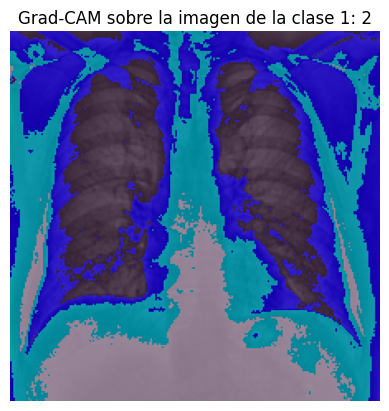

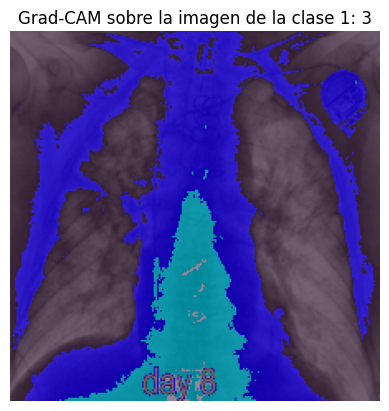

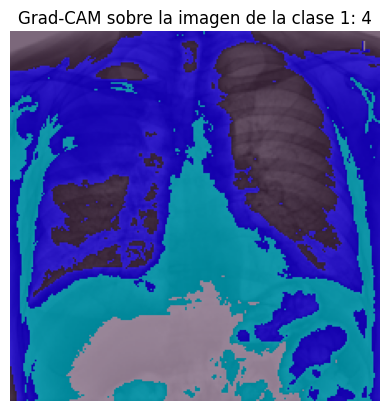

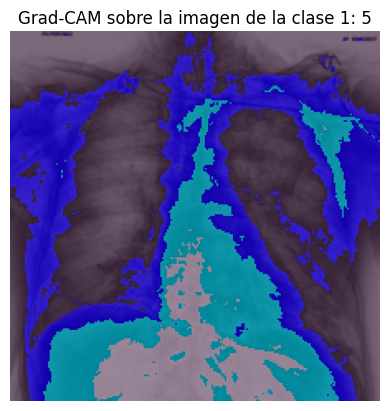

In [ ]:
# Cargamos el mejor modelo guardado tras el entrenamiento
best_model = load_model("best_model_test.h5")

# Nombre de la última capa convolucional de ResNet50
last_conv_layer_name = "conv5_block3_3_conv"

# Desbloqueamos solo la última capa convolucional para permitir Grad-CAM
for layer in best_model.layers:
    if layer.name == last_conv_layer_name:
        layer.trainable = True

# Creamos modelo que devuelve activaciones + predicción final
grad_model = tf.keras.models.Model(
    inputs=best_model.input,
    outputs=[best_model.get_layer(last_conv_layer_name).output, best_model.output]
)

# Función para aplicar Grad-CAM
def compute_gradcam(img_array, model, layer_name):
    with tf.GradientTape() as tape:
        conv_output, predictions = model(img_array, training=False)
        class_idx = tf.argmax(predictions[0])  # Clase con mayor probabilidad
        loss = predictions[:, class_idx]  # Tomar salida de la clase predicha

    # 🔹 Calcular gradientes de la predicción respecto a la capa convolucional
    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Promediar gradientes

    # 🔹 Aplicar pesos de importancia a los mapas de activación
    conv_output = conv_output[0] * pooled_grads
    heatmap = tf.reduce_mean(conv_output, axis=-1).numpy()

    # 🔹 ReLU y normalización
    heatmap = np.maximum(heatmap, 0)  # ReLU
    heatmap /= np.max(heatmap)  # Normalizar

    return heatmap

# 🔹 Función para superponer Grad-CAM sobre la imagen original
def superimpose_gradcam(img_array, heatmap, alpha=0.4):
    img = img_array[0] * 255.0  # Volver a la escala de 0-255
    img = np.uint8(img)

    # Convertir heatmap en imagen de colores
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Superponer el mapa de calor sobre la imagen original
    superimposed_img = cv2.addWeighted(heatmap, alpha, img, 1 - alpha, 0)

    return superimposed_img

# 🔹 Función para procesar y mostrar Grad-CAM para las imágenes del conjunto de test
def process_and_generate_gradcam(X_test, y_test, num_images=5):
    class_0_indices = np.where(y_test == 0)[0][:num_images]
    class_1_indices = np.where(y_test == 1)[0][:num_images]

    # 🔹 Procesar imágenes de la clase 0
    print("Generando Grad-CAM para la clase 0...")
    for idx in class_0_indices:
        img_array = np.expand_dims(X_test[idx], axis=0)  # Añadir la dimensión del batch
        heatmap = compute_gradcam(img_array, grad_model, last_conv_layer_name)
        superimposed_img = superimpose_gradcam(img_array, heatmap)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title(f"Grad-CAM sobre la imagen de la clase 0: {idx}")
        plt.show()

    # 🔹 Procesar imágenes de la clase 1
    print("Generando Grad-CAM para la clase 1...")
    for idx in class_1_indices:
        img_array = np.expand_dims(X_test[idx], axis=0)  # Añadir la dimensión del batch
        heatmap = compute_gradcam(img_array, grad_model, last_conv_layer_name)
        superimposed_img = superimpose_gradcam(img_array, heatmap)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title(f"Grad-CAM sobre la imagen de la clase 1: {idx}")
        plt.show()

# 🔹 Procesar y mostrar Grad-CAM para las imágenes del conjunto de test
process_and_generate_gradcam(X_test, y_test)

### **SECCIÓN B: RESOLUCIÓN DEL PROBLEMA MULTICLASE**

En esta sección construiremos el clasificador multiclase. Para ello, realizamos los siguientes pasos:

#### **4.2.B. Aleatorización de los datos y división en train, validation y test**

Dividimos el dataset en conjuntos de entrenamiento (train), prueba (test) y validación (validation). Para ello, utilizamos la función `train_test_split` de la librería sklearn. Decidimos dividir los datos en un **80% para train** y **20% para test**. El conjunto de **validación** se corresponderá con un **20% del conjunto de entrenamiento**.

Realizamos **particiones estratificadas** para asegurarnos de que disponemos de una muestra representativa de imágenes de cada clase en cada uno de nuestros 3 conjuntos. Además, aleatorizamos las imágenes especificando el parámetro `suffle=True`.

Número de imágenes por clase en el conjunto de entrenamiento:
0     31
1    219
2    310
Name: count, dtype: int64

Número de imágenes por clase en el conjunto de validación:
0     8
1    54
2    78
Name: count, dtype: int64

Número de imágenes por clase en el conjunto de test:
0     9
1    69
2    98
Name: count, dtype: int64


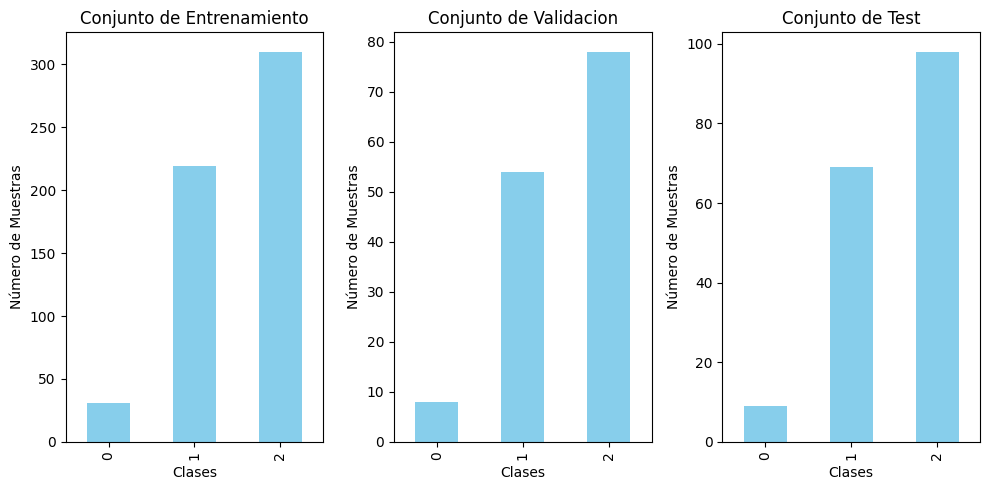

In [ ]:
# Dividimos los datos en conjuntos de entrenamiento, validación y prueba
X_train_temp, X_test, y_train_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y, shuffle=True)
X_train, X_validation, y_train, y_validation = train_test_split(X_train_temp, y_train_temp, test_size=0.2, random_state=42, stratify=y_train_temp, shuffle=True)

y_train_series = pd.Series(y_train.flatten())  # Aplanamos y convertimos a Series
y_validation_series = pd.Series(y_validation.flatten())
y_test_series = pd.Series(y_test.flatten())

conteo_clases_train = y_train_series.value_counts().sort_index()
conteo_clases_test = y_test_series.value_counts().sort_index()
conteo_clases_validation = y_validation_series.value_counts().sort_index()

# Imprimimos número de imágenes de cada clase en el conjunto de entrenamiento
print("Número de imágenes por clase en el conjunto de entrenamiento:")
print(conteo_clases_train)

# Imprimimos número de imágenes de cada clase en el conjunto de validación
print("\nNúmero de imágenes por clase en el conjunto de validación:")
print(conteo_clases_validation)

# Imprimimos número de imágenes de cada clase en el conjunto de test
print("\nNúmero de imágenes por clase en el conjunto de test:")
print(conteo_clases_test)

# Creamos la gráfica de barras para los conjuntos de entrenamiento y prueba
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
conteo_clases_train.plot(kind='bar', color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Número de Muestras')
plt.title('Conjunto de Entrenamiento')

plt.subplot(1, 3, 2)
conteo_clases_validation.plot(kind='bar', color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Número de Muestras')
plt.title('Conjunto de Validacion')

plt.subplot(1, 3, 3)
conteo_clases_test.plot(kind='bar', color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Número de Muestras')
plt.title('Conjunto de Test')


plt.tight_layout()
plt.show()

#### **4.3.B. Data augmentation de la clase neumonia**

En esta sección, implementaremos la técnica de **data augmentation** con el objetivo de aumentar la cantidad de ejemplos de la clase Neumonía Bacteriana, que presenta un número significativamente inferior de instancias en comparación con las otras dos clases ("COVID-19" y "Sano"). Esta técnica tiene como objetivo equilibrar el conjunto de datos, lo que es crucial para mejorar el rendimiento del modelo, ya que el desbalance de clases puede llevar a un sesgo hacia las clases mayoritarias.

El data augmentation solo se aplicará sobre los datos de entrenamiento (train), ya que nuestro objetivo es mejorar la capacidad del modelo para generalizar y evitar que aprenda patrones específicos de los datos de validación o test. La aplicación de estas transformaciones en los datos de validación y test podría afectar la evaluación real del modelo en datos no vistos.

In [ ]:
X_train_class_0 = X_train[y_train == 0]
y_train_class_0 = y_train[y_train == 0]

A continuación, realizamos data augmentation solo para la clase de neumonia (clase 0):

Número de imágenes pre-existentes (conjunto train): 31
Número de nuevas imágenes generadas: 186
Imágenes totales de entrenamiento (incluidas las nuevas): 217


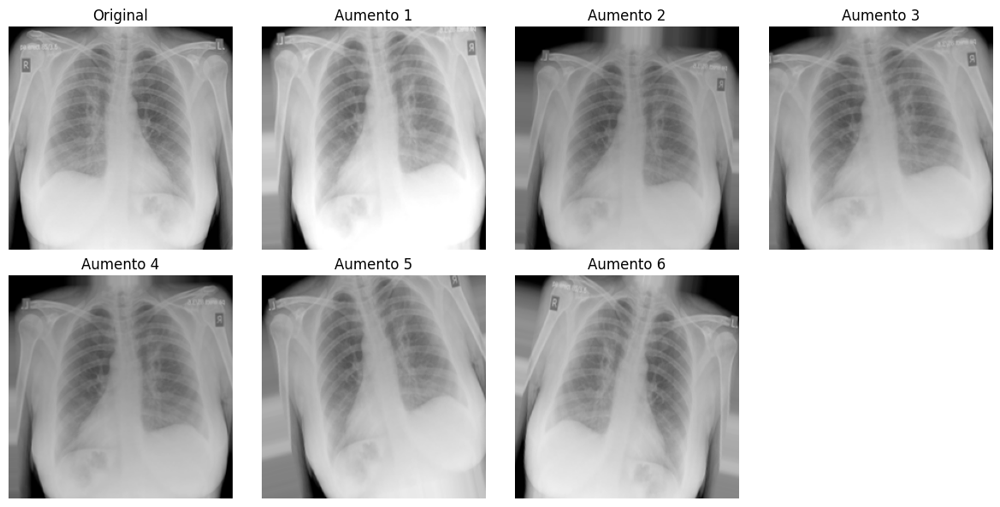

In [ ]:
# Configurar Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=15,            # Rotación entre -15° y 15°
    width_shift_range=0.05,        # Traslación horizontal (5%)
    height_shift_range=0.05,       # Traslación vertical (5%)
    zoom_range=0.1,               # Zoom de ±10%
    brightness_range=[0.8, 1.2],  # Ajuste de brillo
    horizontal_flip=True,         # Volteo horizontal (si aplica)
    fill_mode='nearest'           # Relleno de píxeles fuera de bordes
)

num_augmented = 6  # Número de imágenes aumentadas por cada imagen original

# Función para aplicar Data Augmentation a un conjunto de imágenes
def augment_images(images, num_augmented=num_augmented):
    augmented_images = []
    for img in images:
        img = img.reshape((1,) + img.shape)  # Agregar dimensión batch
        i = 0
        for batch in datagen.flow(img, batch_size=1):
            augmented_images.append(batch[0])
            i += 1
            if i >= num_augmented:
                break  # Detenemos después de generar 'num_augmented' imágenes
    return np.array(augmented_images)

# Generamos nuevas imágenes de la clase 0
X_class_0_augmented = augment_images(X_train_class_0)
print(f"Número de imágenes pre-existentes (conjunto train): {X_train_class_0.shape[0]}")

# Concatenamos imágenes originales con las aumentadas
X_train_class_0_final = np.concatenate((X_train_class_0, X_class_0_augmented), axis=0)
y_train_class_0_final = np.concatenate((y_train_class_0, np.zeros(len(X_class_0_augmented))), axis=0)  # Etiquetas de clase 0

print(f"Número de nuevas imágenes generadas: {X_class_0_augmented.shape[0]}")
print(f"Imágenes totales de entrenamiento (incluidas las nuevas): {X_train_class_0_final.shape[0]}")

# Mostrar imágenes originales y aumentadas
plt.figure(figsize=(12, 6))
plt.subplot(2, 4, 1)
plt.imshow(X_train_class_0_final[0].astype('uint8'), cmap='gray')
plt.title("Original")
plt.axis('off')

for i, img in enumerate(X_class_0_augmented[:num_augmented]):
    plt.subplot(2, 4, i+2)
    plt.imshow(img.astype('uint8'), cmap='gray')
    plt.title(f"Aumento {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

Concatenamos las imágenes de clase 0 (incluidas las aumentadas) con las de las otras clases (COVID-19 y sano).


In [ ]:
# Filtramos las imágenes de las clases 1 y 2
X_train_class_1_2 = X_train[y_train != 0]
y_train_class_1_2 = y_train[y_train != 0]

# Concatenamos las imágenes de clase 0 (aumentadas) con las de las otras clases
X_train = np.concatenate((X_train_class_0_final, X_train_class_1_2), axis=0)
y_train = np.concatenate((y_train_class_0_final, y_train_class_1_2), axis=0)

# Después de la concatenación, convertir las etiquetas a enteros
y_train = y_train.astype(int)

print(f"Imágenes totales en el conjunto de entrenamiento: {y.shape[0]}")

# Verificar la distribución de clases después de la concatenación
conteo_clases_train_final = pd.Series(y_train.flatten()).value_counts().sort_index()

# Diccionario de mapeo de clases
clase_nombres = {0: "Neumonía", 1: "COVID-19", 2: "Sano"}

# Reemplazar los índices por los nombres de las clases
conteo_clases_train_final.index = conteo_clases_train_final.index.map(clase_nombres)

print("\nNúmero de imágenes por clase en el conjunto de entrenamiento final:")
print(conteo_clases_train_final)

Imágenes totales en el conjunto de entrenamiento: 876

Número de imágenes por clase en el conjunto de entrenamiento final:
Neumonía    217
COVID-19    219
Sano        310
Name: count, dtype: int64


Mostramos la gráfica de barras correspondiente al número de imágenes para cada clase.

(array([0, 1, 2]),
 [Text(0, 0, 'Neumonía'), Text(1, 0, 'COVID-19'), Text(2, 0, 'Sano')])

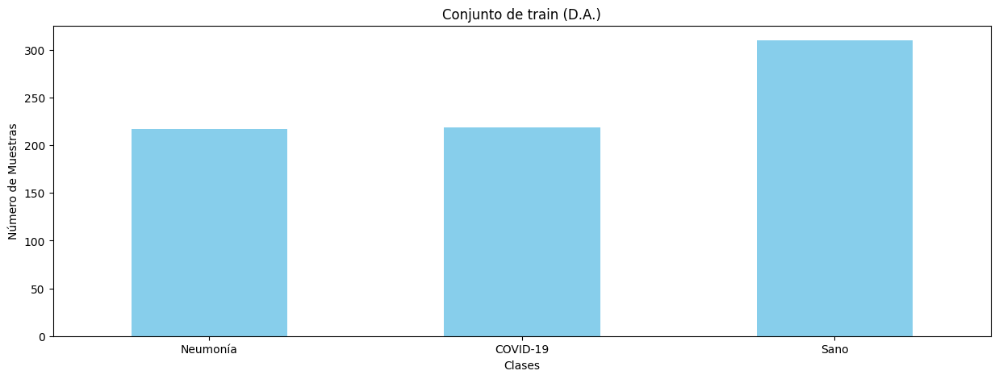

In [ ]:
plt.figure(figsize=(15, 5))

conteo_clases_train_final.plot(kind='bar', color='skyblue')
plt.xlabel('Clases')
plt.ylabel('Número de Muestras')
plt.title('Conjunto de train (D.A.)')
# Rotar etiquetas del eje x a horizontal
plt.xticks(rotation=0)

Observamos que ahora tenemos un problema balanceado.

#### **4.4.B Normalización de los datos**

Dado que utilizamos **ResNet50** como base de nuestra arquitectura, es fundamental asegurar que las imágenes de entrada cumplan con el mismo preprocesamiento utilizado durante el entrenamiento original de dicho modelo. ResNet50 fue entrenado con el dataset ImageNet, cuyas imágenes fueron normalizadas restando el valor medio de cada canal (R, G, B).

Para asegurar la compatibilidad y el correcto funcionamiento del modelo preentrenado, aplicamos el preprocesamiento utilizando la función `preprocess_input` de TensorFlow, que realiza esta normalización de manera automática. Este paso es esencial para que el modelo interprete correctamente las características de las imágenes de nuestro conjunto de datos.

In [ ]:
# Normalizamos las imágenes antes de hacer la predicción
X_train = preprocess_input(X_train)  # Aplicamos el preprocesamiento a las imágenes de entrenamiento
X_validation = preprocess_input(X_validation)  # Aplicamos el preprocesamiento a las imágenes de validación
X_test = preprocess_input(X_test)  # Aplicamos el preprocesamiento a las imágenes de test

#### **5.B Construcción del modelo pre-entrenado ImageNet**

En este caso, como ya expusimos anteriormente, si queremos resolver el problema multiclase (neumonia vs covid vs sano), el modelo más adecuado es **COVID-Net**. Sin embargo, tras explorar sus características e intentar descargarlo, no fue posible obtener el modelo. Por esta razón, optamos por utilizar **ImageNet**, un modelo preentrenado con imágenes de propósito general, para llevar a cabo la **clasificación multiclase**.

In [ ]:
# Función para construir el modelo con distintos hiperparámetros para un problema multiclase con 3 clases
def build_model_multiclase(num_neurons, dropout_rate):
    # Cargamos el modelo base (suponiendo que es ResNet50 o similar)
    base_model = tf.keras.applications.ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

    # Congelamos las capas convolucionales del modelo base
    base_model.trainable = False

    # Añadimos capas finales para la clasificación multiclase
    x = Flatten()(base_model.output)
    x = Dense(num_neurons, activation="relu")(x)
    x = Dropout(dropout_rate)(x)
    output = Dense(3, activation="softmax")(x)  # 3 neuronas para 3 clases y softmax para salida multiclase

    # Definimos el modelo
    model = Model(inputs=base_model.input, outputs=output)

    return model

#### **6.B Experimentación con varios modelos y selección de hiperparámetros**


A continuación, procedemos a entrenar el modelo y evaluarlo con el conjunto de validación. Realizamos múltiples experimientos con distintos hiperparámetros para así escoger los que mejor rendimiento ofrecen para nuestro problema

Entrenando con lr=0.0001, neuronas=128, dropout=0.3, epochs=50
Epoch 1/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step - accuracy: 0.6271 - loss: 2.6172
Epoch 1: val_accuracy improved from -inf to 0.92857, saving model to best_model_lr0.0001_neurons128_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 74s 3s/step - accuracy: 0.6322 - loss: 2.5661 - val_accuracy: 0.9286 - val_loss: 0.1699
Epoch 2/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9504 - loss: 0.1343
Epoch 2: val_accuracy did not improve from 0.92857
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9506 - loss: 0.1342 - val_accuracy: 0.9286 - val_loss: 0.1401
Epoch 3/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9690 - loss: 0.0533
Epoch 3: val_accuracy improved from 0.92857 to 0.93571, saving model to best_model_lr0.0001_neurons128_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 356ms/step - accuracy: 0.9696 - loss: 0.0528 - val_accuracy: 0.9357 - val_loss: 0.1315
Epoch 4/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9949 - loss: 0.0226
Epoch 4: val_accuracy did not improve from 0.93571
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - accuracy: 0.9949 - loss: 0.0228 - val_accuracy: 0.9286 - val_loss: 0.1346
Epoch 5/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 1.0000 - loss: 0.0117
Epoch 5: val_accuracy did not improve from 0.93571
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - accuracy: 1.0000 - loss: 0.0118 - val_accuracy: 0.9357 - val_loss: 0.1495
Epoch 6/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9986 - loss: 0.0120
Epoch 6: val_accuracy improved from 0.93571 to 0.94286, saving model to best_model_lr0.0001_neurons128_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 20s 772ms/step - accuracy: 0.9986 - loss: 0.0120 - val_accuracy: 0.9429 - val_loss: 0.1208
Epoch 7/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 1.0000 - loss: 0.0049
Epoch 7: val_accuracy improved from 0.94286 to 0.95000, saving model to best_model_lr0.0001_neurons128_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 17s 614ms/step - accuracy: 1.0000 - loss: 0.0050 - val_accuracy: 0.9500 - val_loss: 0.1191
Epoch 8/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9959 - loss: 0.0095
Epoch 8: val_accuracy did not improve from 0.95000
24/24 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - accuracy: 0.9960 - loss: 0.0093 - val_accuracy: 0.9214 - val_loss: 0.1497
Epoch 9/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9945 - loss: 0.0128
Epoch 9: val_accuracy did not improve from 0.95000
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step - accuracy: 0.9946 - loss: 0.0126 - val_accuracy: 0.9500 - val_loss: 0.1338
Epoch 10/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 1.0000 - loss: 0.0052
Epoch 10: val_accuracy did not improve from 0.95000
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - accuracy: 1.0000 - loss: 0.0052 - val_accuracy: 0.9286 - val_loss: 0.1650
Epoch 11/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9979 - loss: 0.0046
Epoch 11: val_accuracy did not impr

24/24 ━━━━━━━━━━━━━━━━━━━━ 9s 374ms/step - accuracy: 0.9965 - loss: 0.0091 - val_accuracy: 0.9571 - val_loss: 0.1592
Epoch 14/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 1.0000 - loss: 0.0044
Epoch 14: val_accuracy did not improve from 0.95714
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 1.0000 - loss: 0.0043 - val_accuracy: 0.9429 - val_loss: 0.1076
Epoch 15/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9989 - loss: 0.0043
Epoch 15: val_accuracy did not improve from 0.95714
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.9989 - loss: 0.0043 - val_accuracy: 0.9500 - val_loss: 0.1173
Epoch 16/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9998 - loss: 0.0020
Epoch 16: val_accuracy did not improve from 0.95714
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.9997 - loss: 0.0021 - val_accuracy: 0.9286 - val_loss: 0.1470


5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 905ms/step
AUC for class pair (0, 1): 1.00


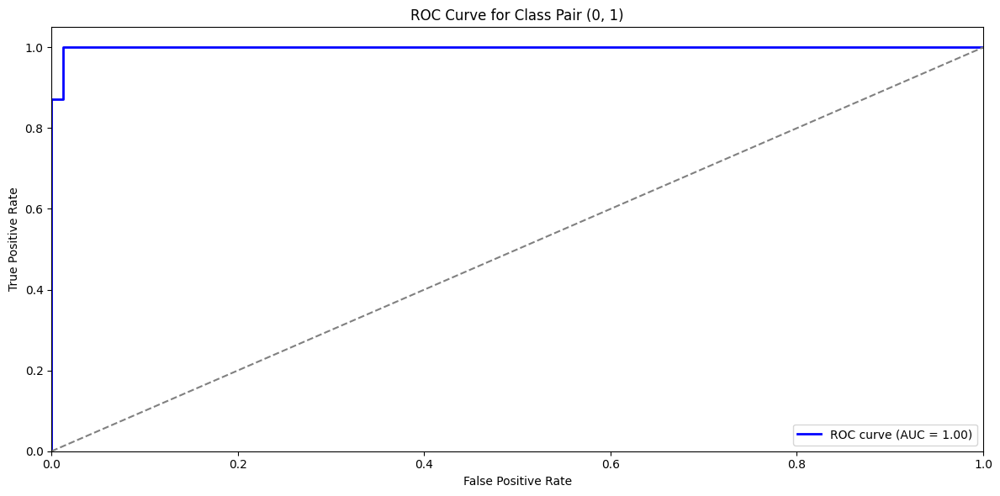

AUC for class pair (0, 2): 0.96


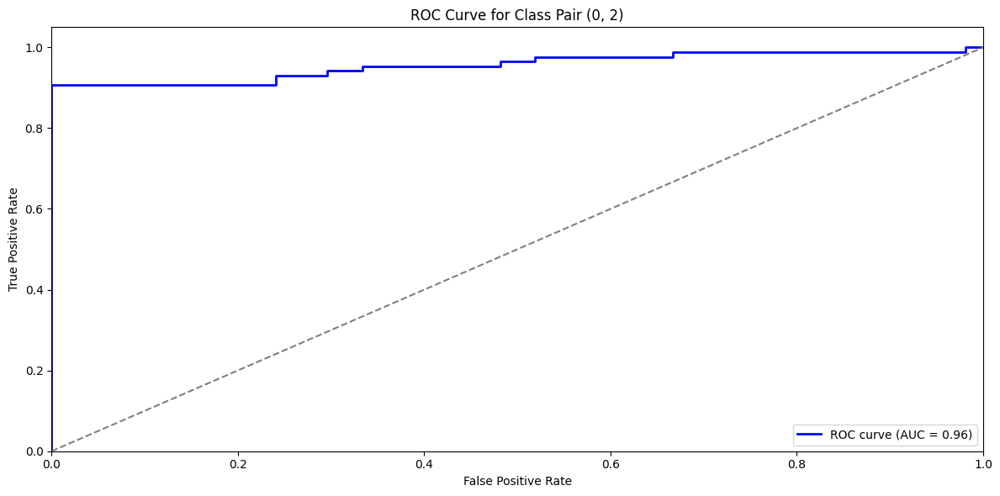

AUC for class pair (1, 2): 0.78


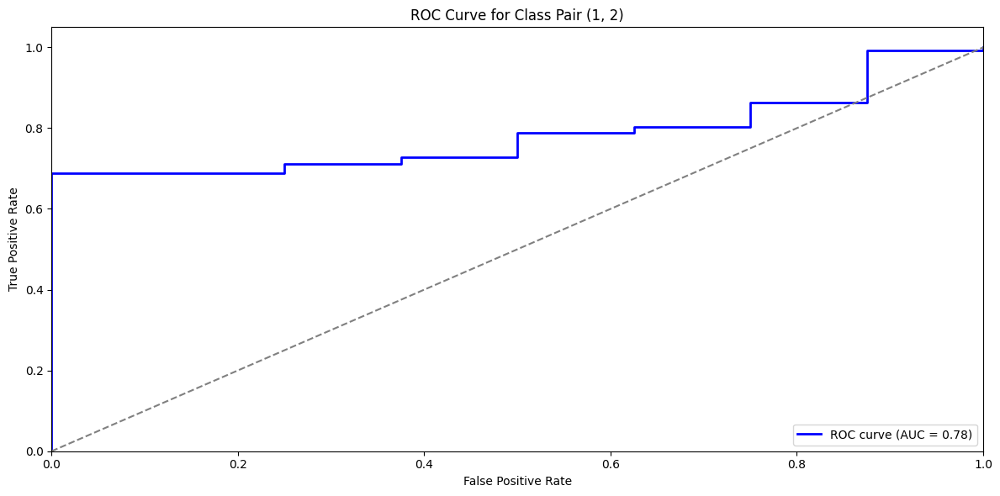

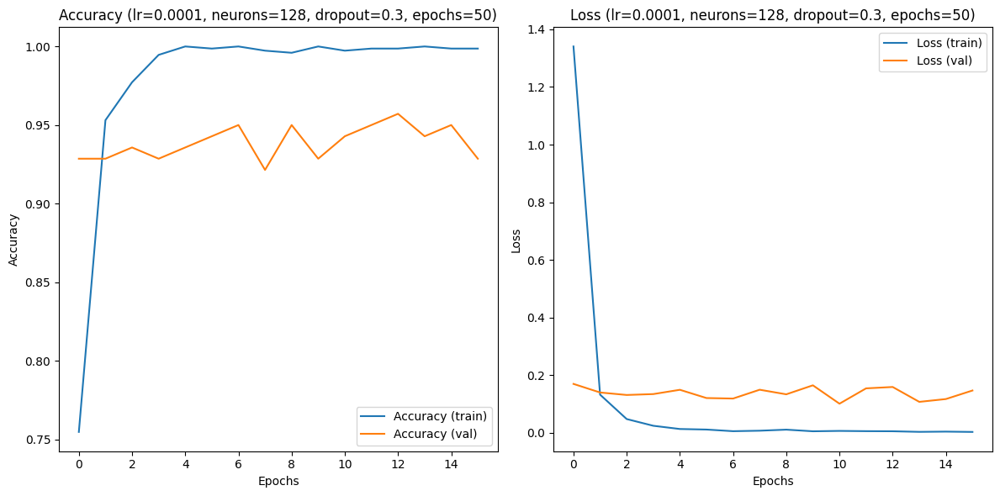

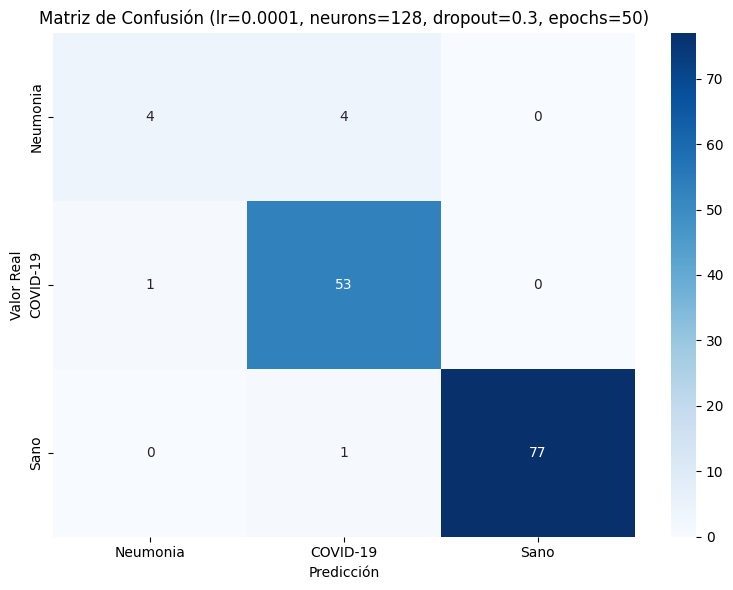

Entrenando con lr=0.0001, neuronas=128, dropout=0.5, epochs=50
Epoch 1/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - accuracy: 0.6716 - loss: 2.0094
Epoch 1: val_accuracy improved from -inf to 0.93571, saving model to best_model_lr0.0001_neurons128_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 32s 908ms/step - accuracy: 0.6761 - loss: 1.9773 - val_accuracy: 0.9357 - val_loss: 0.2564
Epoch 2/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9568 - loss: 0.0914
Epoch 2: val_accuracy did not improve from 0.93571
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.9563 - loss: 0.0928 - val_accuracy: 0.9357 - val_loss: 0.2006
Epoch 3/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9708 - loss: 0.0606
Epoch 3: val_accuracy improved from 0.93571 to 0.94286, saving model to best_model_lr0.0001_neurons128_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 13s 459ms/step - accuracy: 0.9706 - loss: 0.0618 - val_accuracy: 0.9429 - val_loss: 0.1372
Epoch 4/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9787 - loss: 0.0508
Epoch 4: val_accuracy did not improve from 0.94286
24/24 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - accuracy: 0.9785 - loss: 0.0512 - val_accuracy: 0.9143 - val_loss: 0.2665
Epoch 5/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9805 - loss: 0.0510
Epoch 5: val_accuracy did not improve from 0.94286
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.9808 - loss: 0.0502 - val_accuracy: 0.9214 - val_loss: 0.2288
Epoch 6/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9858 - loss: 0.0310
Epoch 6: val_accuracy did not improve from 0.94286
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - accuracy: 0.9862 - loss: 0.0306 - val_accuracy: 0.9357 - val_loss: 0.1235
Epoch 7/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9994 - loss: 0.0120
Epoch 7: val_accuracy did not improve

24/24 ━━━━━━━━━━━━━━━━━━━━ 19s 727ms/step - accuracy: 0.9986 - loss: 0.0064 - val_accuracy: 0.9571 - val_loss: 0.1139
Epoch 10/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9977 - loss: 0.0061
Epoch 10: val_accuracy did not improve from 0.95714
24/24 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 0.9976 - loss: 0.0064 - val_accuracy: 0.9571 - val_loss: 0.1107
Epoch 11/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 1.0000 - loss: 0.0044
Epoch 11: val_accuracy did not improve from 0.95714
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - accuracy: 0.9999 - loss: 0.0047 - val_accuracy: 0.9571 - val_loss: 0.1259
Epoch 12/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9997 - loss: 0.0048
Epoch 12: val_accuracy improved from 0.95714 to 0.96429, saving model to best_model_lr0.0001_neurons128_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 648ms/step - accuracy: 0.9996 - loss: 0.0049 - val_accuracy: 0.9643 - val_loss: 0.1104
Epoch 13/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9992 - loss: 0.0036
Epoch 13: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - accuracy: 0.9992 - loss: 0.0037 - val_accuracy: 0.9643 - val_loss: 0.1260


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 794ms/step
AUC for class pair (0, 1): 1.00


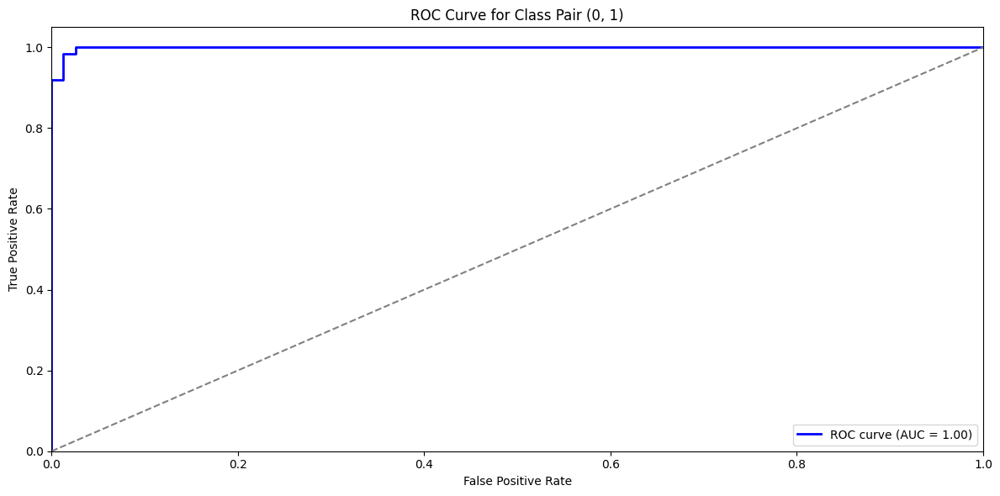

AUC for class pair (0, 2): 0.96


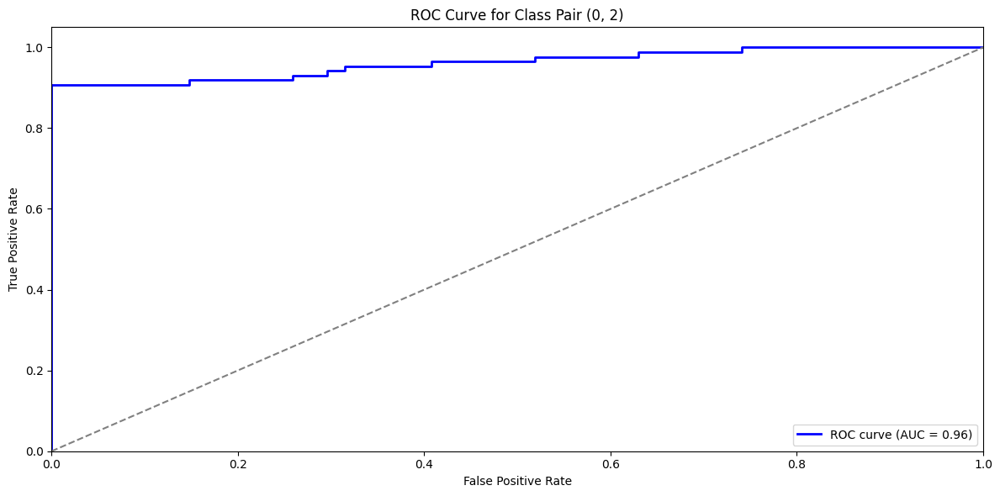

AUC for class pair (1, 2): 0.76


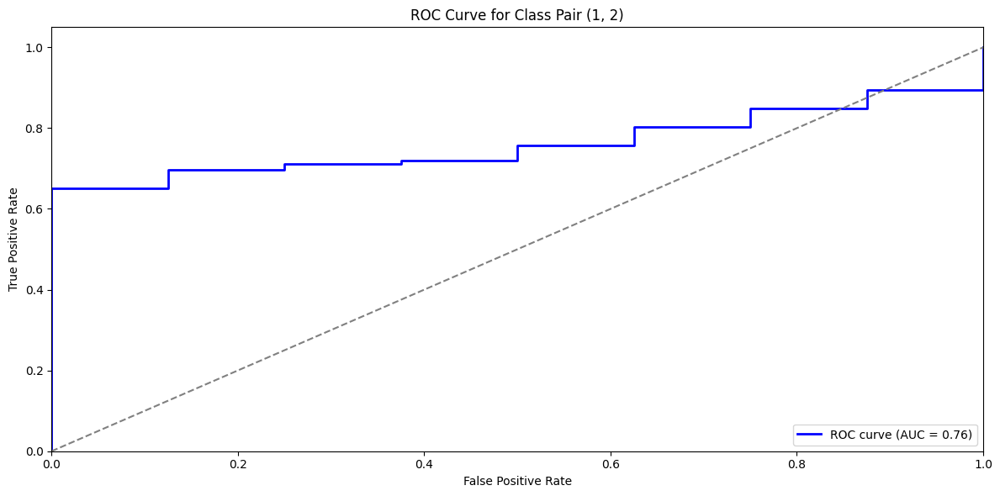

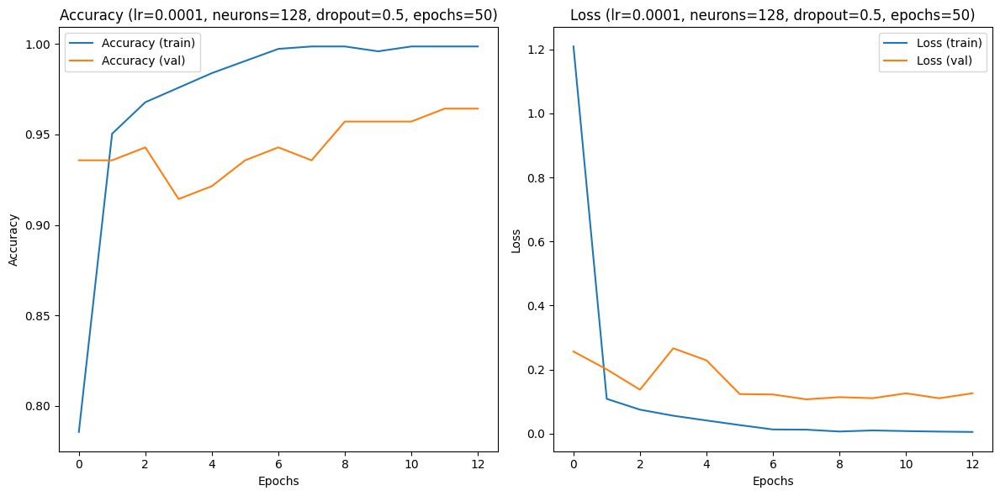

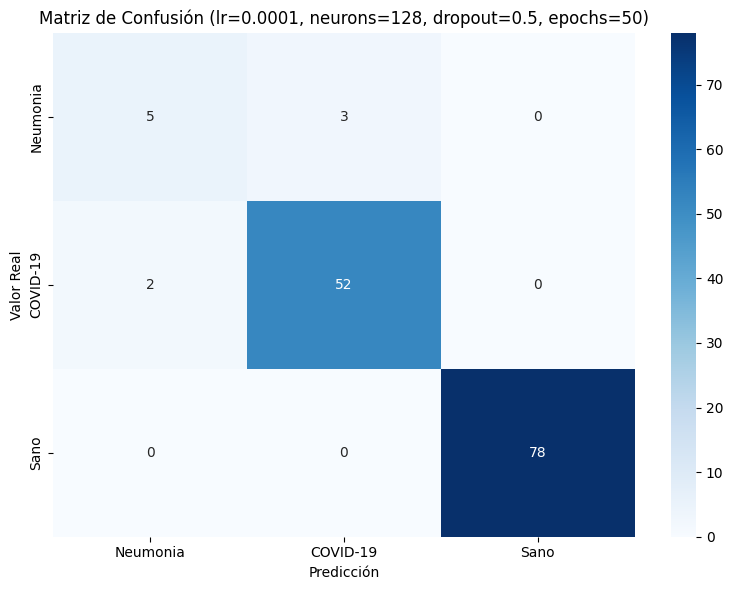

Entrenando con lr=0.0001, neuronas=256, dropout=0.3, epochs=50
Epoch 1/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step - accuracy: 0.6352 - loss: 3.6286
Epoch 1: val_accuracy improved from -inf to 0.95000, saving model to best_model_lr0.0001_neurons256_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - accuracy: 0.6403 - loss: 3.5647 - val_accuracy: 0.9500 - val_loss: 0.2615
Epoch 2/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9642 - loss: 0.0987
Epoch 2: val_accuracy did not improve from 0.95000
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.9646 - loss: 0.0974 - val_accuracy: 0.9429 - val_loss: 0.0984
Epoch 3/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9980 - loss: 0.0154
Epoch 3: val_accuracy improved from 0.95000 to 0.95714, saving model to best_model_lr0.0001_neurons256_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 17s 639ms/step - accuracy: 0.9980 - loss: 0.0155 - val_accuracy: 0.9571 - val_loss: 0.1164
Epoch 4/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9890 - loss: 0.0283
Epoch 4: val_accuracy improved from 0.95714 to 0.96429, saving model to best_model_lr0.0001_neurons256_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.9883 - loss: 0.0296 - val_accuracy: 0.9643 - val_loss: 0.1149
Epoch 5/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.9934 - loss: 0.0179
Epoch 5: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step - accuracy: 0.9933 - loss: 0.0182 - val_accuracy: 0.8786 - val_loss: 0.3773
Epoch 6/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9793 - loss: 0.0432
Epoch 6: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - accuracy: 0.9800 - loss: 0.0421 - val_accuracy: 0.9500 - val_loss: 0.1045
Epoch 7/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9954 - loss: 0.0111
Epoch 7: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9956 - loss: 0.0110 - val_accuracy: 0.9571 - val_loss: 0.1537


4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 820ms/step
AUC for class pair (0, 1): 1.00


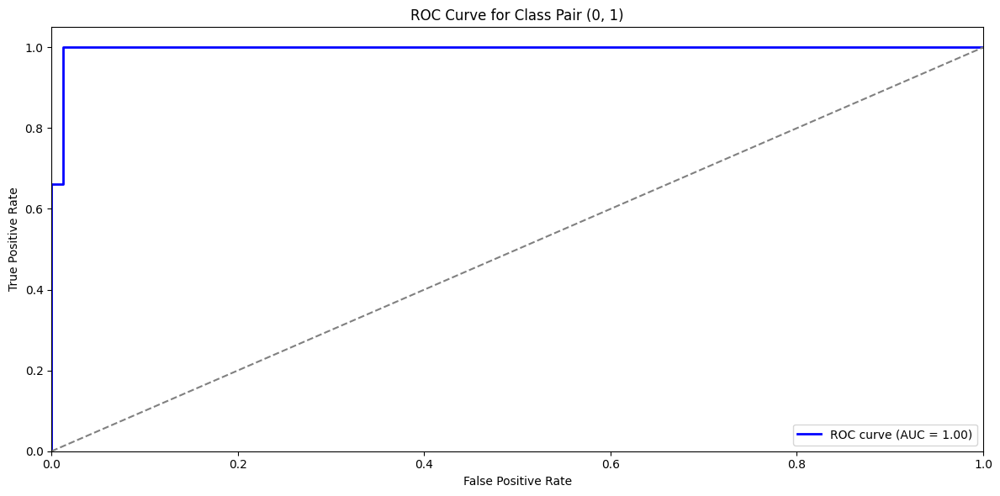

AUC for class pair (0, 2): 0.95


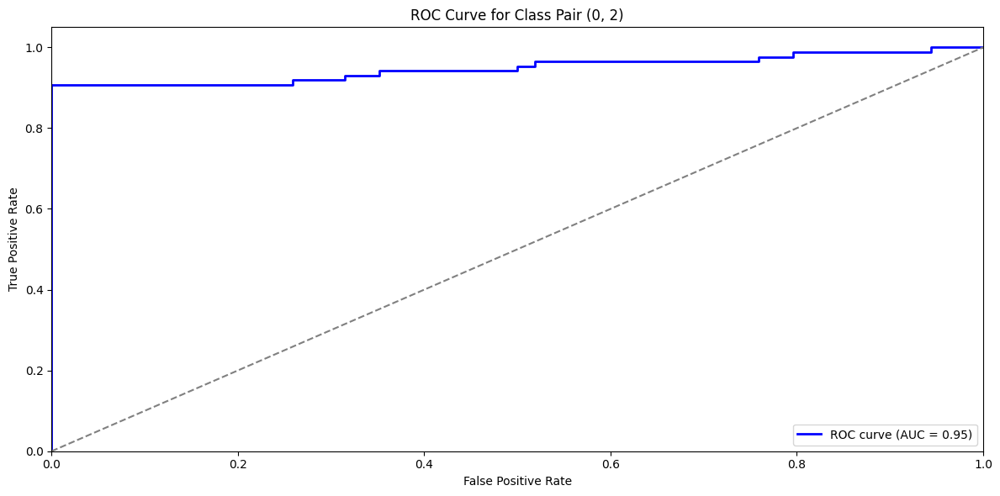

AUC for class pair (1, 2): 0.82


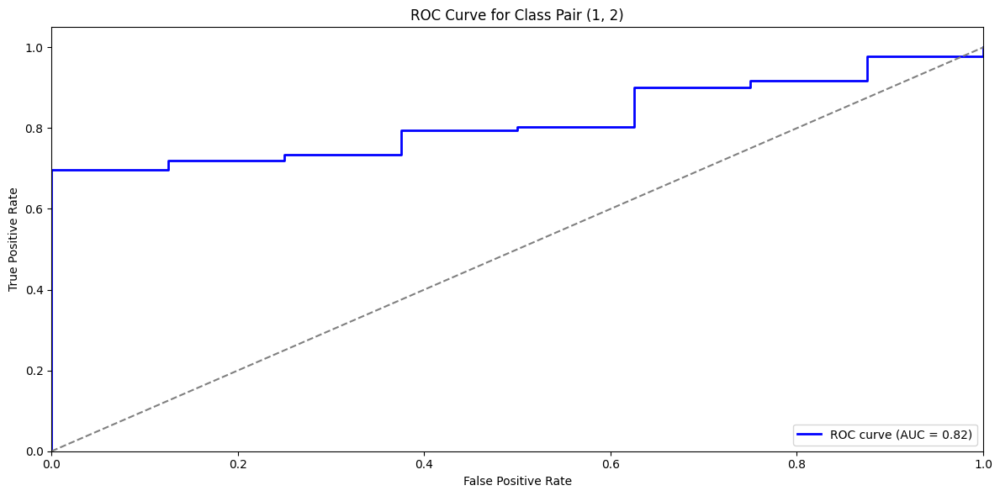

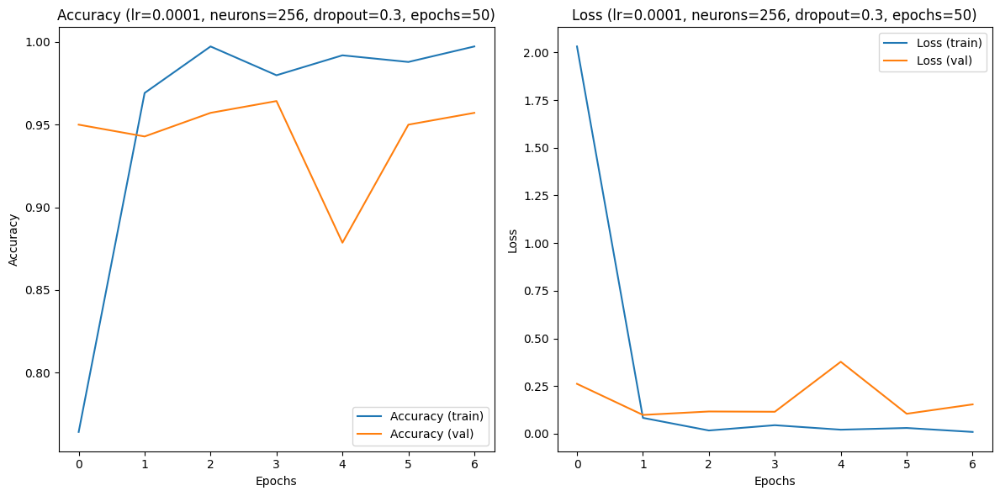

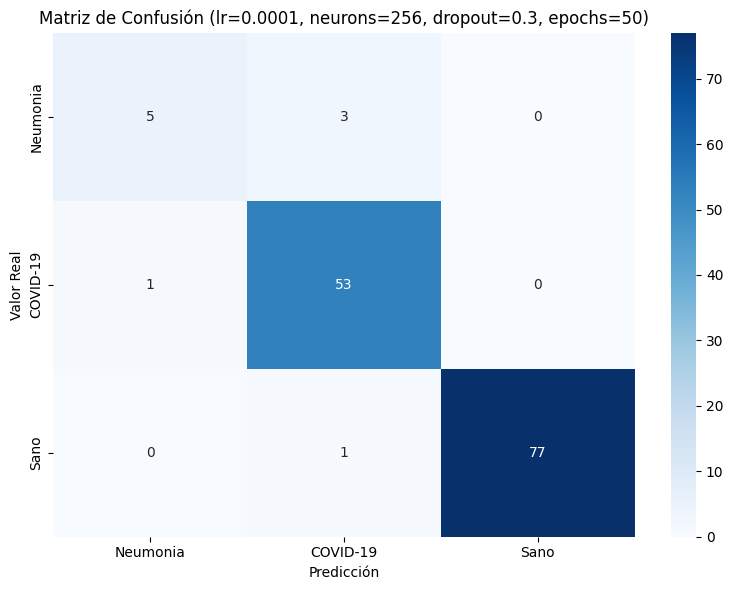

Entrenando con lr=0.0001, neuronas=256, dropout=0.5, epochs=50
Epoch 1/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - accuracy: 0.6628 - loss: 3.2969
Epoch 1: val_accuracy improved from -inf to 0.90714, saving model to best_model_lr0.0001_neurons256_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.6678 - loss: 3.2411 - val_accuracy: 0.9071 - val_loss: 0.4041
Epoch 2/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9600 - loss: 0.1686
Epoch 2: val_accuracy improved from 0.90714 to 0.95714, saving model to best_model_lr0.0001_neurons256_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 24s 692ms/step - accuracy: 0.9597 - loss: 0.1678 - val_accuracy: 0.9571 - val_loss: 0.2077
Epoch 3/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.9836 - loss: 0.0569
Epoch 3: val_accuracy improved from 0.95714 to 0.96429, saving model to best_model_lr0.0001_neurons256_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 19s 834ms/step - accuracy: 0.9839 - loss: 0.0568 - val_accuracy: 0.9643 - val_loss: 0.1353
Epoch 4/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9901 - loss: 0.0168
Epoch 4: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - accuracy: 0.9903 - loss: 0.0170 - val_accuracy: 0.9500 - val_loss: 0.1443
Epoch 5/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 1.0000 - loss: 0.0084
Epoch 5: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - accuracy: 1.0000 - loss: 0.0084 - val_accuracy: 0.9429 - val_loss: 0.1174
Epoch 6/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 1.0000 - loss: 0.0036
Epoch 6: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 134ms/step - accuracy: 1.0000 - loss: 0.0036 - val_accuracy: 0.9643 - val_loss: 0.0933
Epoch 7/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9990 - loss: 0.0026
Epoch 7: val_accuracy did not improve 

24/24 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 1.0000 - loss: 0.0032 - val_accuracy: 0.9714 - val_loss: 0.1009
Epoch 11/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 1.0000 - loss: 0.0020
Epoch 11: val_accuracy did not improve from 0.97143
24/24 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - accuracy: 1.0000 - loss: 0.0020 - val_accuracy: 0.9571 - val_loss: 0.1076


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 792ms/step
AUC for class pair (0, 1): 1.00


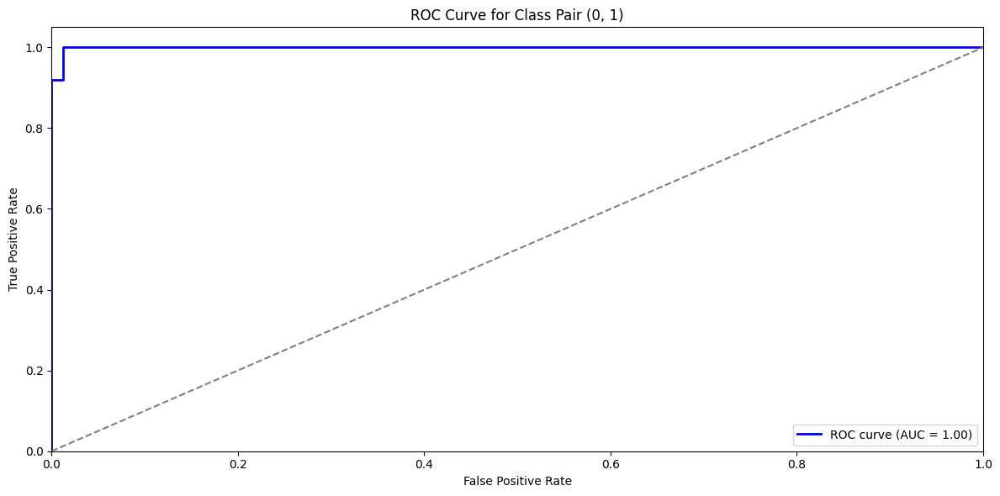

AUC for class pair (0, 2): 0.97


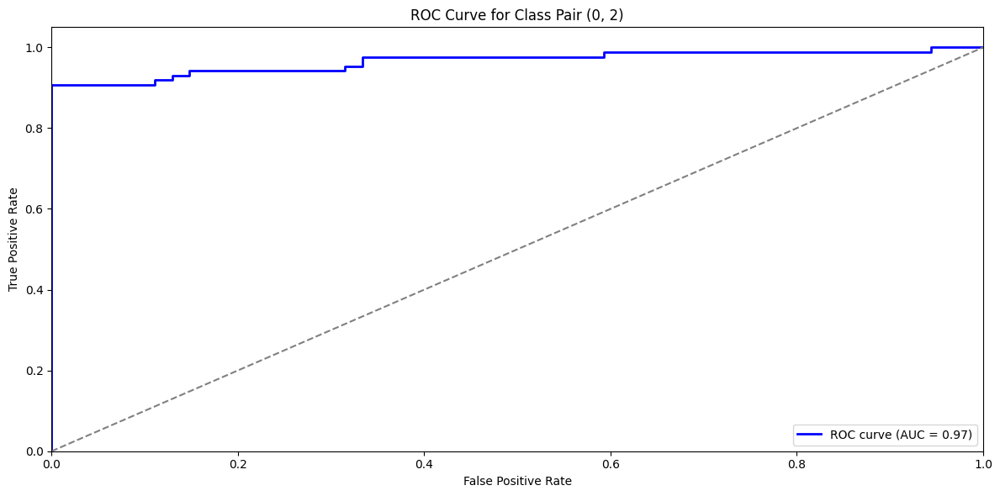

AUC for class pair (1, 2): 0.74


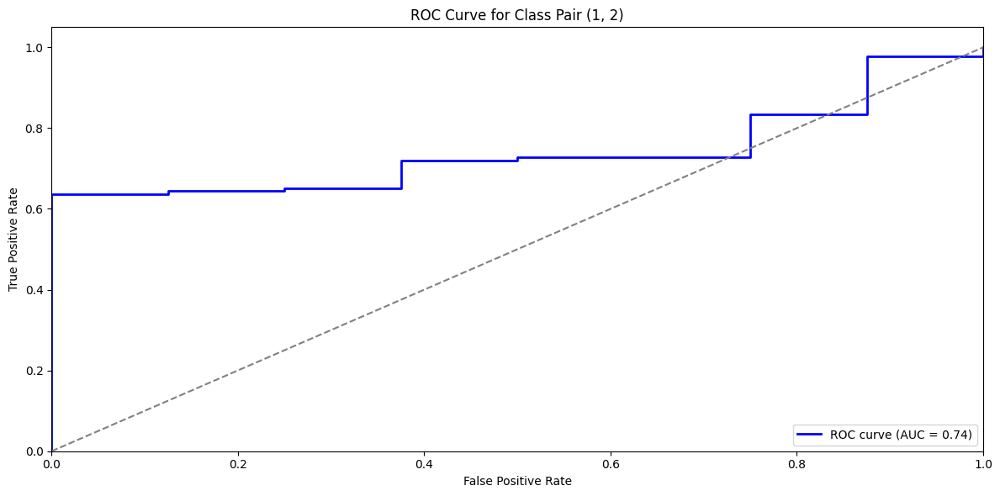

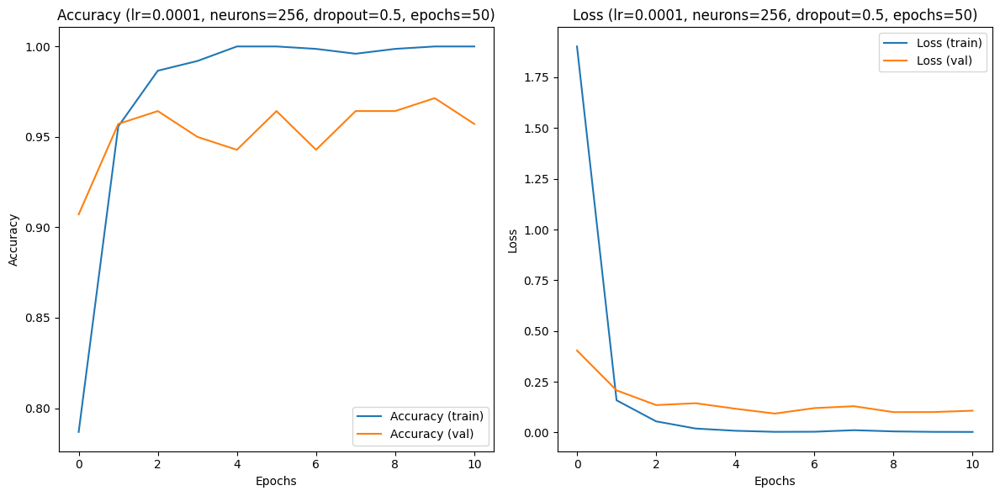

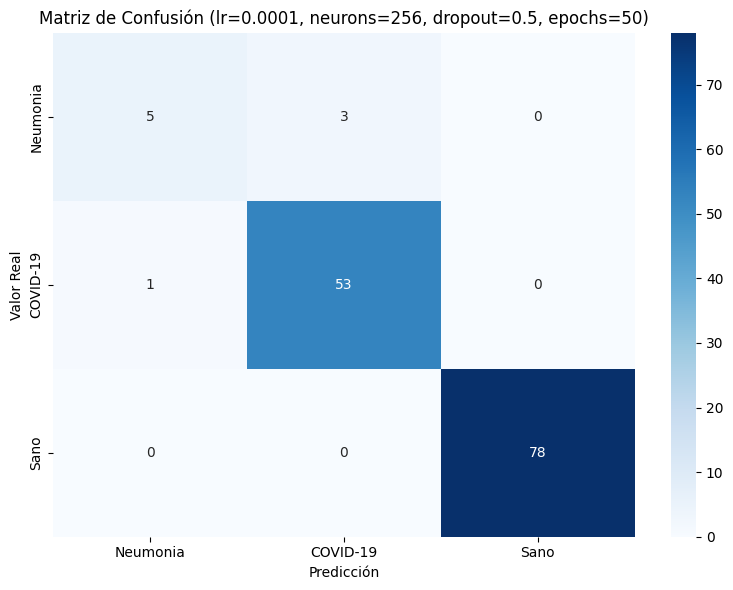

Entrenando con lr=0.001, neuronas=128, dropout=0.3, epochs=50
Epoch 1/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.6644 - loss: 18.0043
Epoch 1: val_accuracy improved from -inf to 0.88571, saving model to best_model_lr0.001_neurons128_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.6689 - loss: 17.6944 - val_accuracy: 0.8857 - val_loss: 2.4947
Epoch 2/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9636 - loss: 0.7343
Epoch 2: val_accuracy improved from 0.88571 to 0.92857, saving model to best_model_lr0.001_neurons128_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 11s 485ms/step - accuracy: 0.9635 - loss: 0.7243 - val_accuracy: 0.9286 - val_loss: 0.5088
Epoch 3/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9888 - loss: 0.0833
Epoch 3: val_accuracy did not improve from 0.92857
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - accuracy: 0.9884 - loss: 0.0861 - val_accuracy: 0.9071 - val_loss: 0.7097
Epoch 4/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9867 - loss: 0.1092
Epoch 4: val_accuracy improved from 0.92857 to 0.95000, saving model to best_model_lr0.001_neurons128_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 18s 784ms/step - accuracy: 0.9864 - loss: 0.1073 - val_accuracy: 0.9500 - val_loss: 0.4200
Epoch 5/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9894 - loss: 0.0696
Epoch 5: val_accuracy improved from 0.95000 to 0.98571, saving model to best_model_lr0.001_neurons128_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 17s 615ms/step - accuracy: 0.9896 - loss: 0.0673 - val_accuracy: 0.9857 - val_loss: 0.3453
Epoch 6/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9930 - loss: 0.0196
Epoch 6: val_accuracy did not improve from 0.98571
24/24 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - accuracy: 0.9930 - loss: 0.0199 - val_accuracy: 0.9571 - val_loss: 0.4610
Epoch 7/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9857 - loss: 0.0628
Epoch 7: val_accuracy did not improve from 0.98571
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step - accuracy: 0.9858 - loss: 0.0633 - val_accuracy: 0.9357 - val_loss: 0.4200
Epoch 8/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9850 - loss: 0.1021
Epoch 8: val_accuracy did not improve from 0.98571
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - accuracy: 0.9849 - loss: 0.1048 - val_accuracy: 0.9429 - val_loss: 0.3589
Epoch 9/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9923 - loss: 0.0300
Epoch 9: val_accuracy did not improve 

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 991ms/step
AUC for class pair (0, 1): 1.00


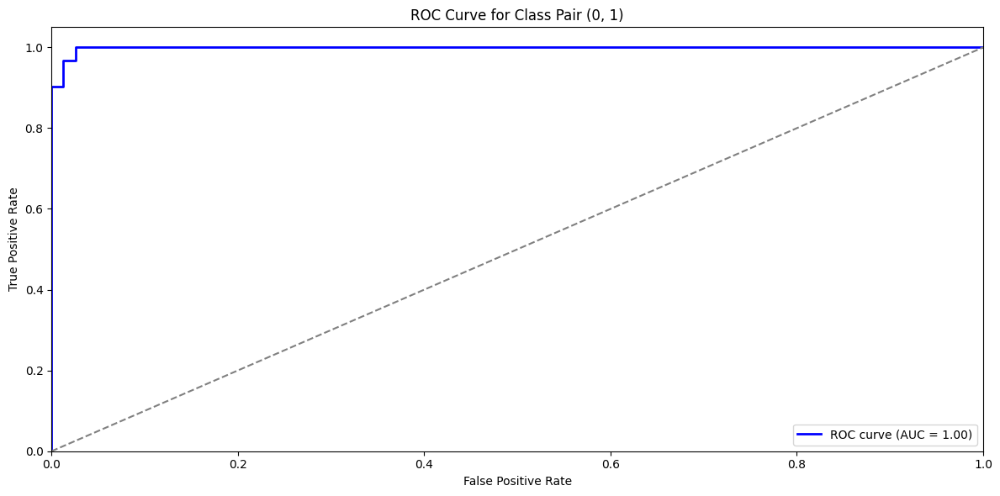

AUC for class pair (0, 2): 0.96


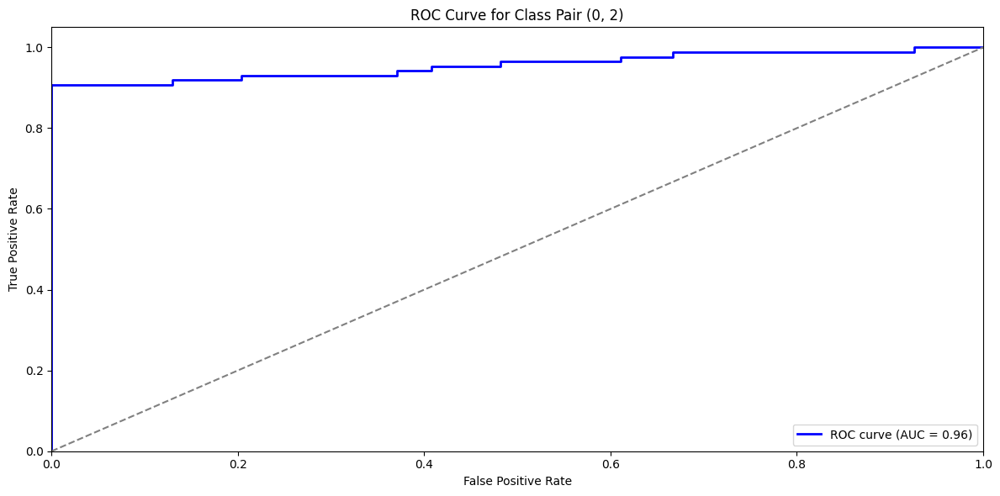

AUC for class pair (1, 2): 0.79


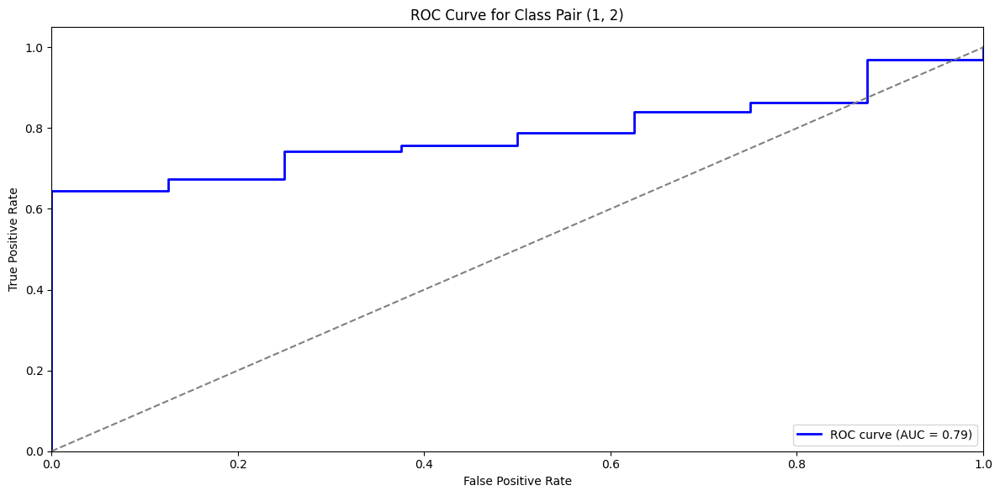

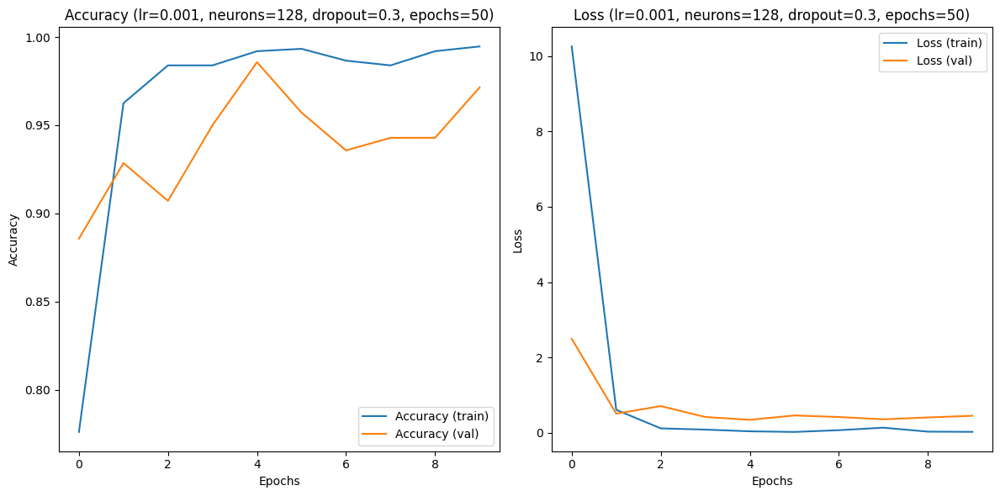

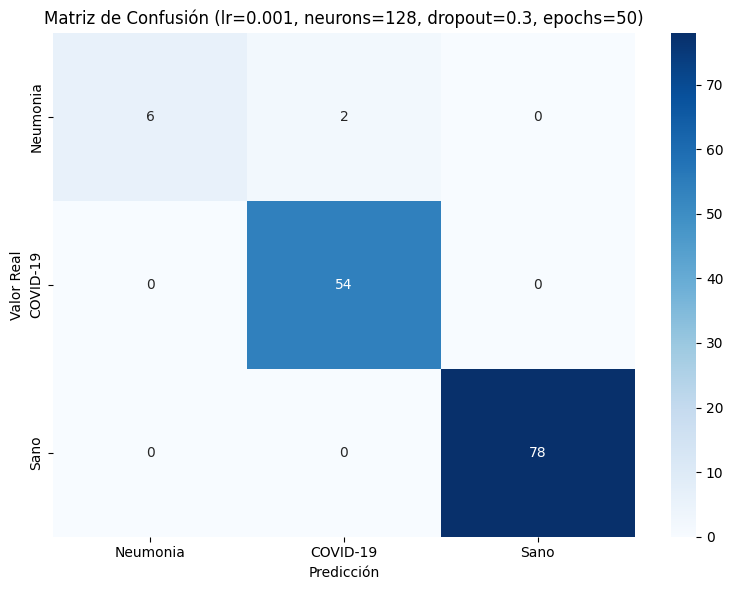

Entrenando con lr=0.001, neuronas=128, dropout=0.5, epochs=50
Epoch 1/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.6567 - loss: 10.9678
Epoch 1: val_accuracy improved from -inf to 0.91429, saving model to best_model_lr0.001_neurons128_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - accuracy: 0.6612 - loss: 10.8067 - val_accuracy: 0.9143 - val_loss: 1.4544
Epoch 2/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9229 - loss: 1.1785
Epoch 2: val_accuracy improved from 0.91429 to 0.94286, saving model to best_model_lr0.001_neurons128_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 14s 604ms/step - accuracy: 0.9235 - loss: 1.1483 - val_accuracy: 0.9429 - val_loss: 0.3487
Epoch 3/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9529 - loss: 0.5404
Epoch 3: val_accuracy did not improve from 0.94286
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - accuracy: 0.9527 - loss: 0.5248 - val_accuracy: 0.9214 - val_loss: 0.1944
Epoch 4/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9714 - loss: 0.0893
Epoch 4: val_accuracy improved from 0.94286 to 0.95000, saving model to best_model_lr0.001_neurons128_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 13s 552ms/step - accuracy: 0.9711 - loss: 0.0888 - val_accuracy: 0.9500 - val_loss: 0.1787
Epoch 5/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9871 - loss: 0.0593
Epoch 5: val_accuracy did not improve from 0.95000
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - accuracy: 0.9870 - loss: 0.0592 - val_accuracy: 0.9357 - val_loss: 0.2364
Epoch 6/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9814 - loss: 0.1077
Epoch 6: val_accuracy did not improve from 0.95000
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.9816 - loss: 0.1041 - val_accuracy: 0.9429 - val_loss: 0.3454
Epoch 7/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9832 - loss: 0.0994
Epoch 7: val_accuracy improved from 0.95000 to 0.96429, saving model to best_model_lr0.001_neurons128_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.9829 - loss: 0.1002 - val_accuracy: 0.9643 - val_loss: 0.1912
Epoch 8/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9876 - loss: 0.0333
Epoch 8: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step - accuracy: 0.9874 - loss: 0.0340 - val_accuracy: 0.9500 - val_loss: 0.2827
Epoch 9/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9807 - loss: 0.0571
Epoch 9: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.9807 - loss: 0.0570 - val_accuracy: 0.9500 - val_loss: 0.2210


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 798ms/step
AUC for class pair (0, 1): 1.00


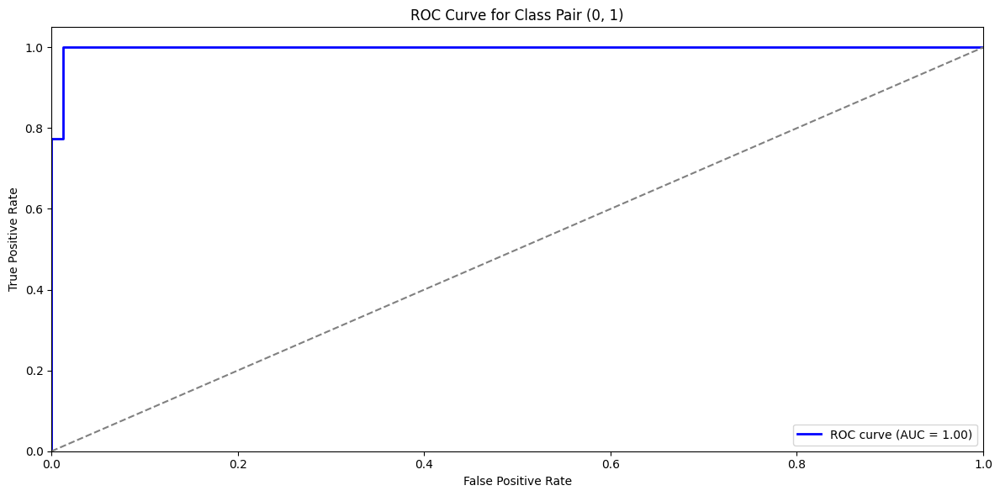

AUC for class pair (0, 2): 0.96


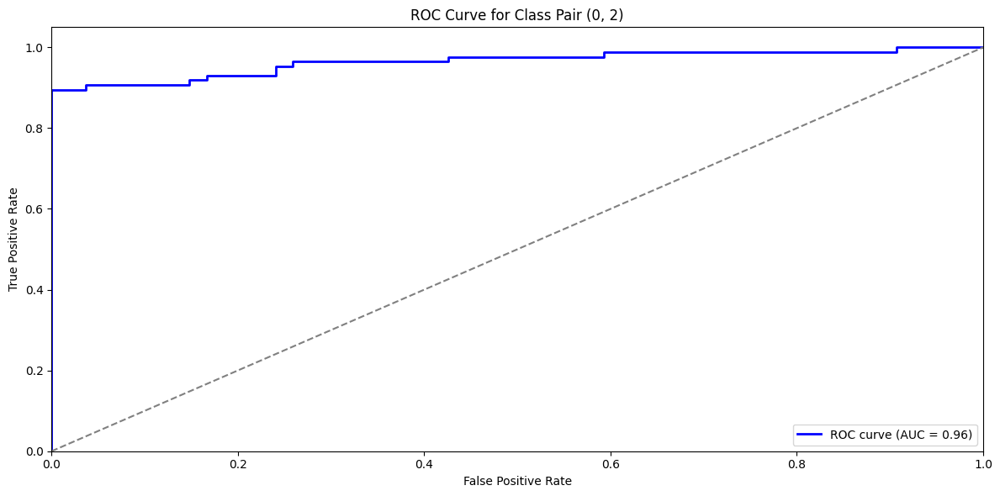

AUC for class pair (1, 2): 0.74


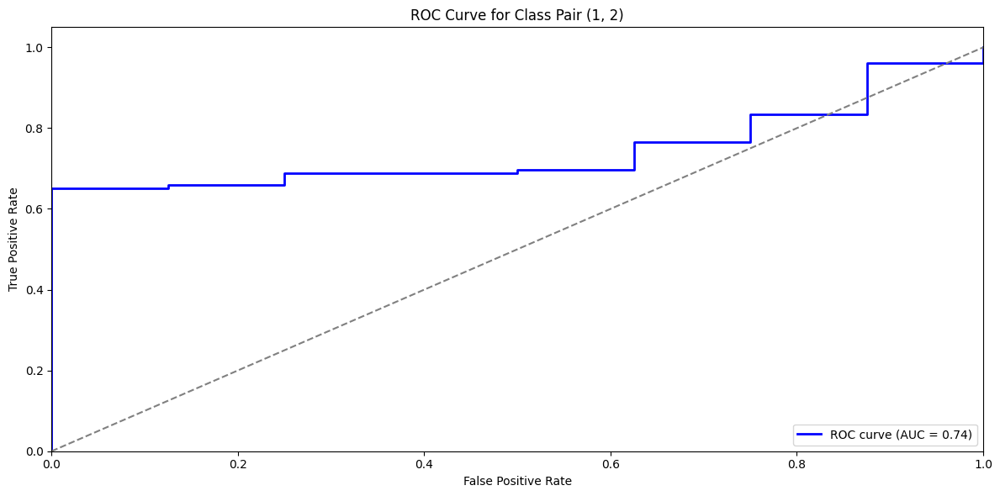

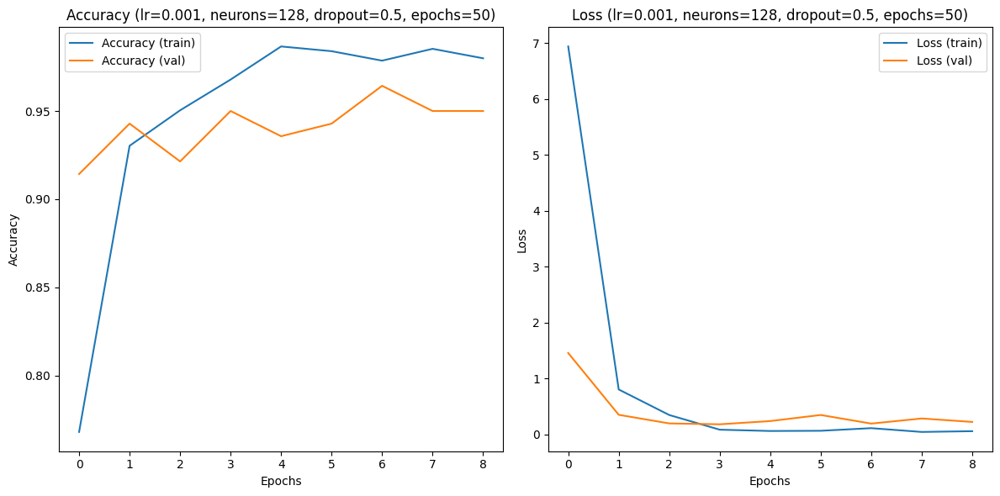

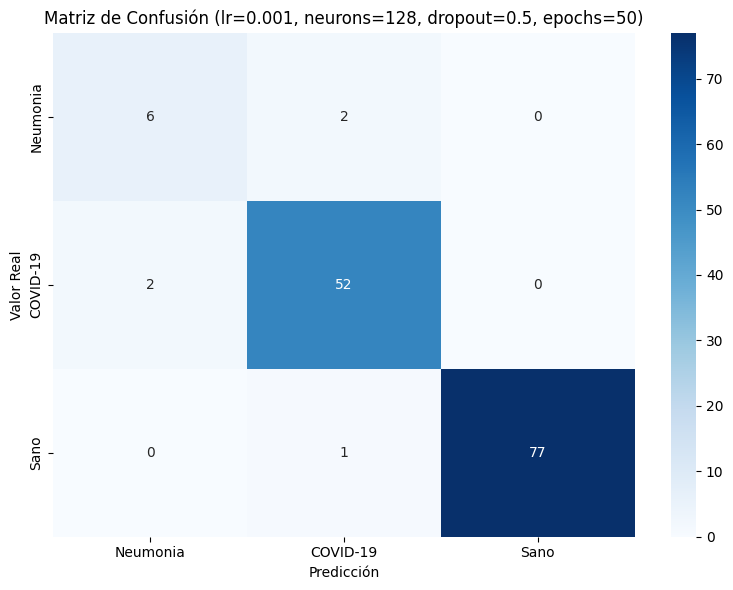

Entrenando con lr=0.001, neuronas=256, dropout=0.3, epochs=50
Epoch 1/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.6522 - loss: 23.8679
Epoch 1: val_accuracy improved from -inf to 0.94286, saving model to best_model_lr0.001_neurons256_dropout0.3_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - accuracy: 0.6564 - loss: 23.4226 - val_accuracy: 0.9429 - val_loss: 1.5197
Epoch 2/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.9481 - loss: 1.0192
Epoch 2: val_accuracy did not improve from 0.94286
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - accuracy: 0.9485 - loss: 1.0064 - val_accuracy: 0.8857 - val_loss: 1.7281
Epoch 3/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9726 - loss: 0.4674
Epoch 3: val_accuracy did not improve from 0.94286
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.9730 - loss: 0.4516 - val_accuracy: 0.9143 - val_loss: 0.8389
Epoch 4/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9861 - loss: 0.1302
Epoch 4: val_accuracy did not improve from 0.94286
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 138ms/step - accuracy: 0.9866 - loss: 0.1251 - val_accuracy: 0.9143 - val_loss: 0.5167
Epoch 5/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9985 - loss: 0.0225
Epoch 5: val_accuracy did not improve fr

24/24 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.9944 - loss: 0.0230 - val_accuracy: 0.9643 - val_loss: 0.4366
Epoch 8/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.9986 - loss: 0.0036
Epoch 8: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 17s 122ms/step - accuracy: 0.9986 - loss: 0.0036 - val_accuracy: 0.9571 - val_loss: 0.2561
Epoch 9/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9999 - loss: 5.6334e-04
Epoch 9: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - accuracy: 0.9998 - loss: 0.0010 - val_accuracy: 0.9571 - val_loss: 0.2605
Epoch 10/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9996 - loss: 0.0029
Epoch 10: val_accuracy did not improve from 0.96429
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - accuracy: 0.9995 - loss: 0.0032 - val_accuracy: 0.9429 - val_loss: 0.2449
Epoch 11/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.9989 - loss: 0.0029
Epoch 11: val_accuracy did not im

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 811ms/step
AUC for class pair (0, 1): 1.00


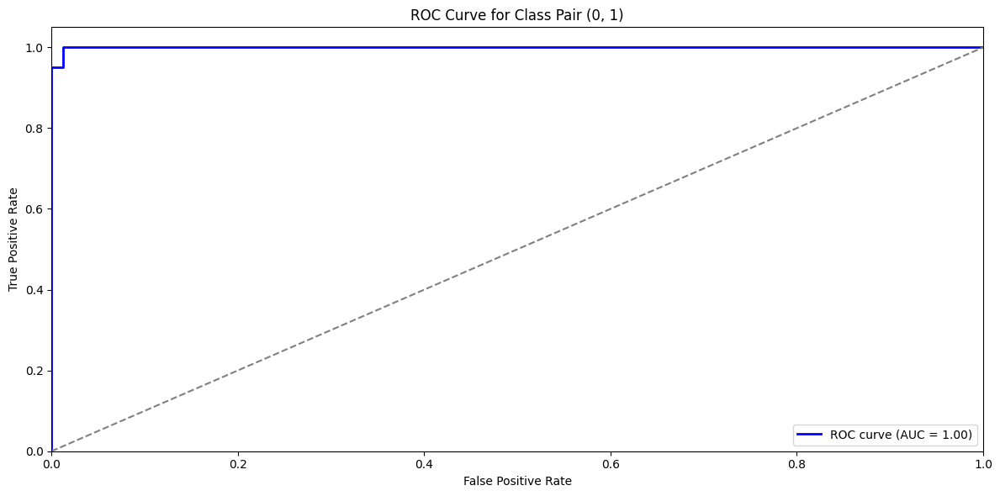

AUC for class pair (0, 2): 0.95


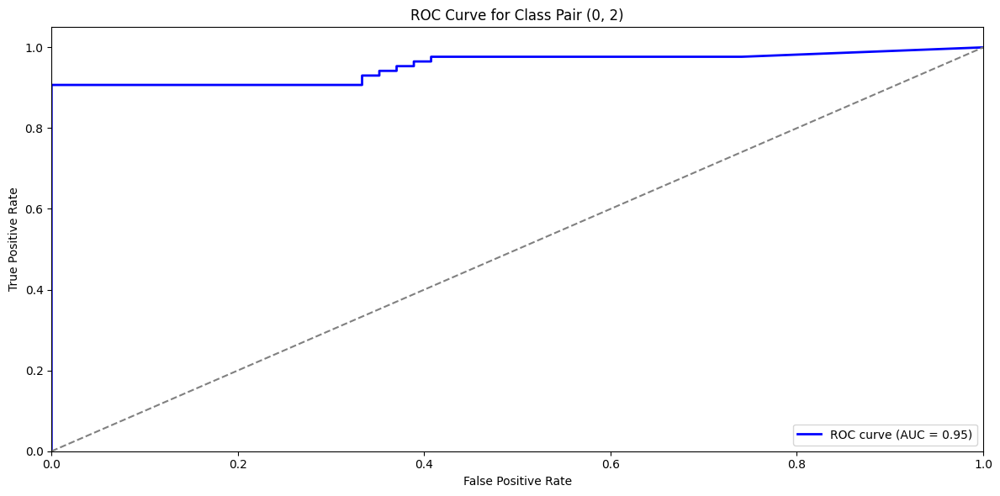

AUC for class pair (1, 2): 0.79


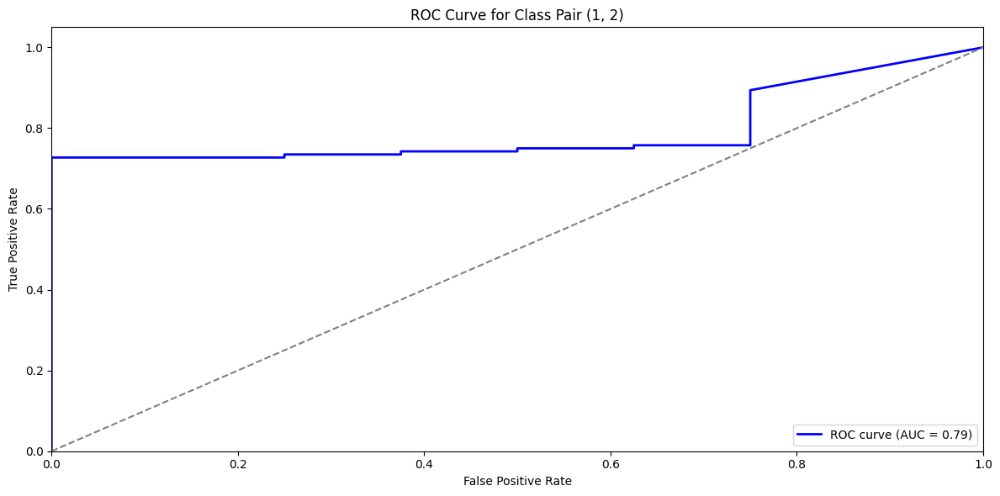

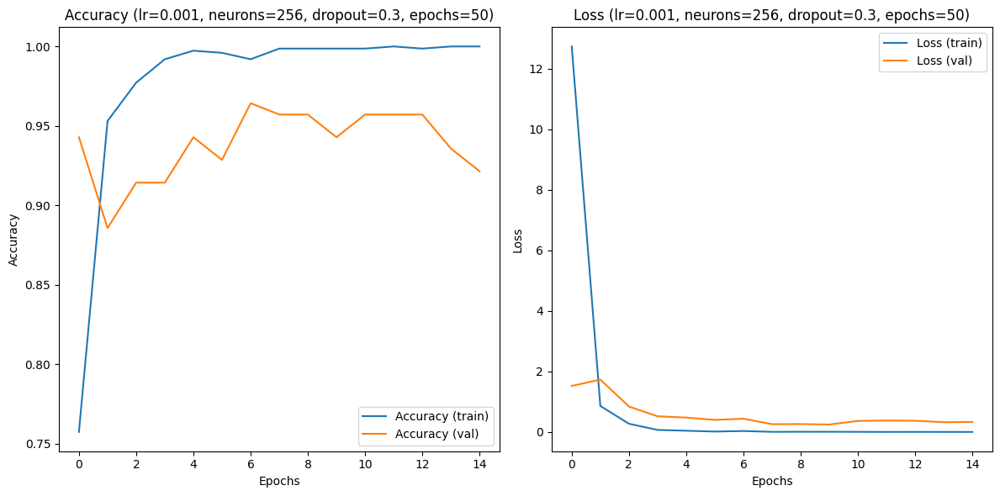

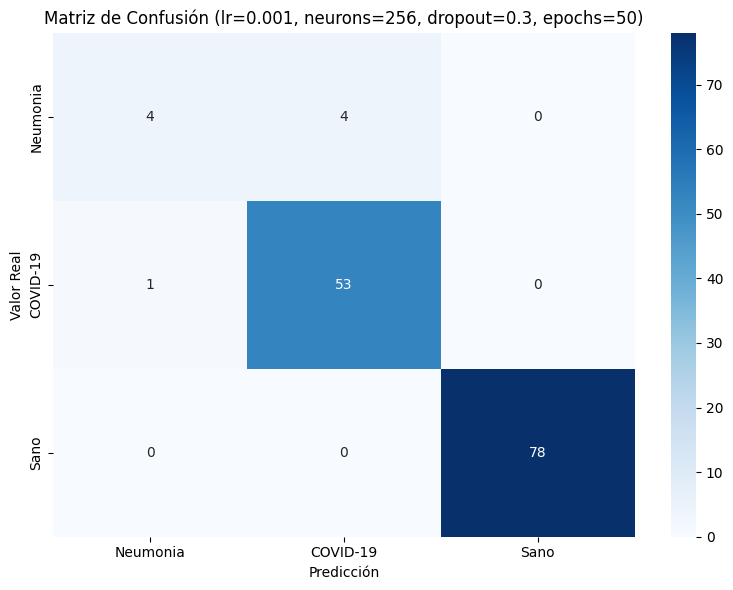

Entrenando con lr=0.001, neuronas=256, dropout=0.5, epochs=50
Epoch 1/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.7068 - loss: 19.0436
Epoch 1: val_accuracy improved from -inf to 0.95000, saving model to best_model_lr0.001_neurons256_dropout0.5_epochs50.h5


24/24 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - accuracy: 0.7104 - loss: 18.7638 - val_accuracy: 0.9500 - val_loss: 1.7852
Epoch 2/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.9356 - loss: 2.2785
Epoch 2: val_accuracy did not improve from 0.95000
24/24 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - accuracy: 0.9362 - loss: 2.2156 - val_accuracy: 0.9500 - val_loss: 1.1537
Epoch 3/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9856 - loss: 0.2840
Epoch 3: val_accuracy did not improve from 0.95000
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 139ms/step - accuracy: 0.9858 - loss: 0.2816 - val_accuracy: 0.9429 - val_loss: 0.4884
Epoch 4/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9794 - loss: 0.3050
Epoch 4: val_accuracy did not improve from 0.95000
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9792 - loss: 0.3107 - val_accuracy: 0.9429 - val_loss: 1.9478
Epoch 5/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.9691 - loss: 0.9708
Epoch 5: val_accuracy improved from 0.9

24/24 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9696 - loss: 0.9428 - val_accuracy: 0.9571 - val_loss: 1.3598
Epoch 6/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9829 - loss: 0.1144
Epoch 6: val_accuracy did not improve from 0.95714
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - accuracy: 0.9829 - loss: 0.1137 - val_accuracy: 0.9214 - val_loss: 1.1022
Epoch 7/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.9903 - loss: 0.1092
Epoch 7: val_accuracy did not improve from 0.95714
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - accuracy: 0.9902 - loss: 0.1137 - val_accuracy: 0.9357 - val_loss: 0.7296
Epoch 8/50
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9951 - loss: 0.0381
Epoch 8: val_accuracy did not improve from 0.95714
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - accuracy: 0.9946 - loss: 0.0460 - val_accuracy: 0.9357 - val_loss: 0.9807


5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 966ms/step
AUC for class pair (0, 1): 1.00


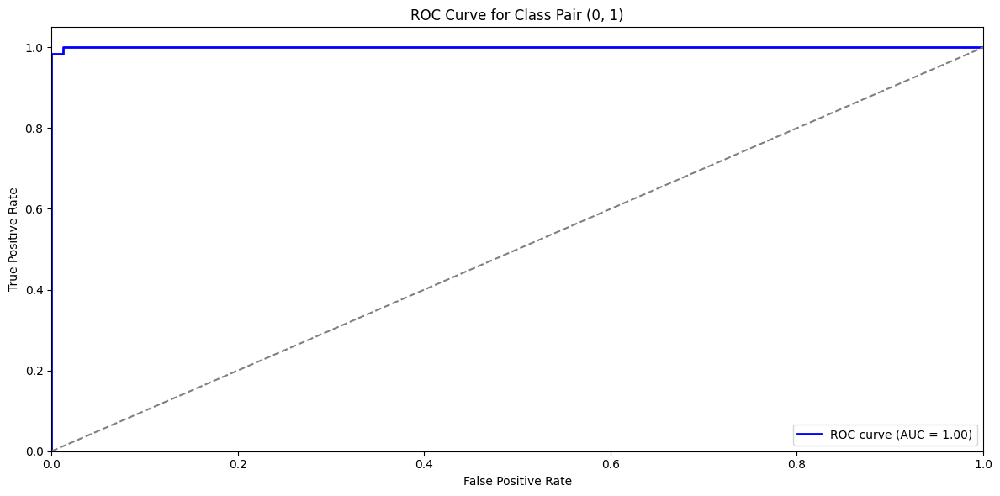

AUC for class pair (0, 2): 0.94


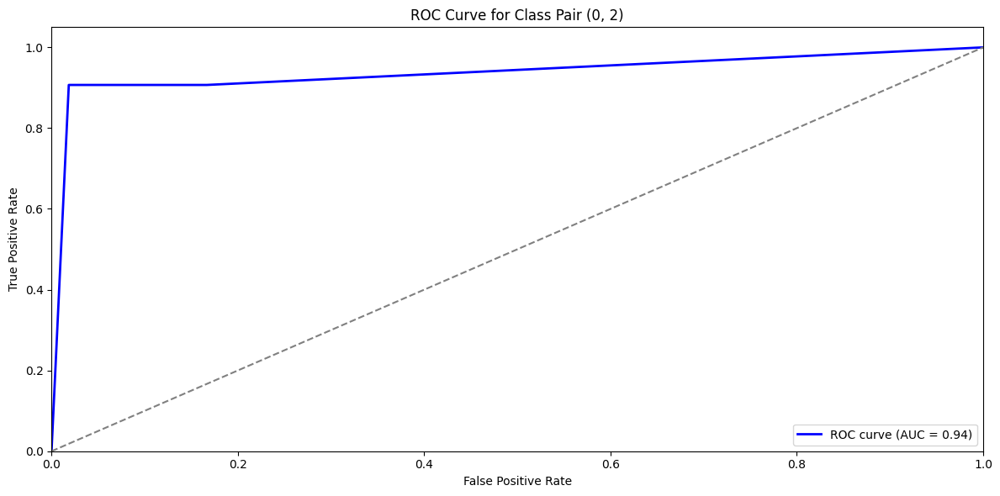

AUC for class pair (1, 2): 0.83


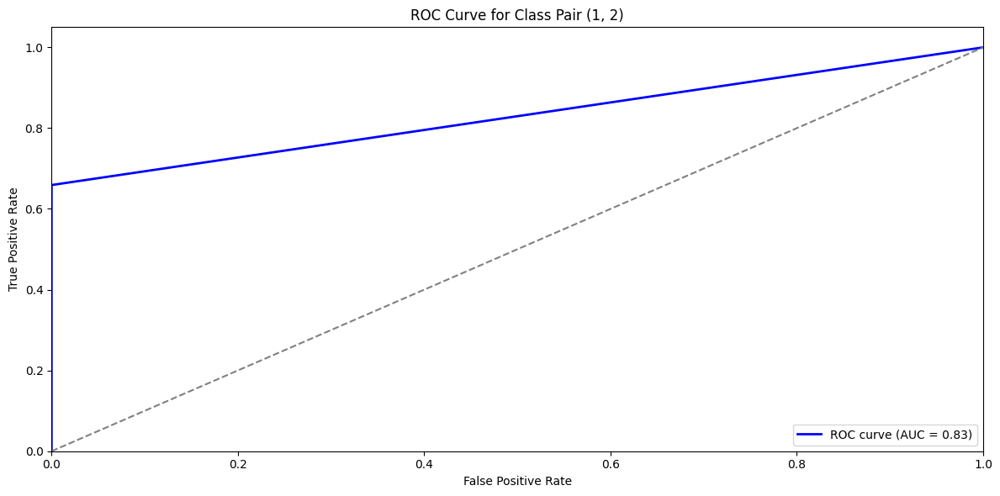

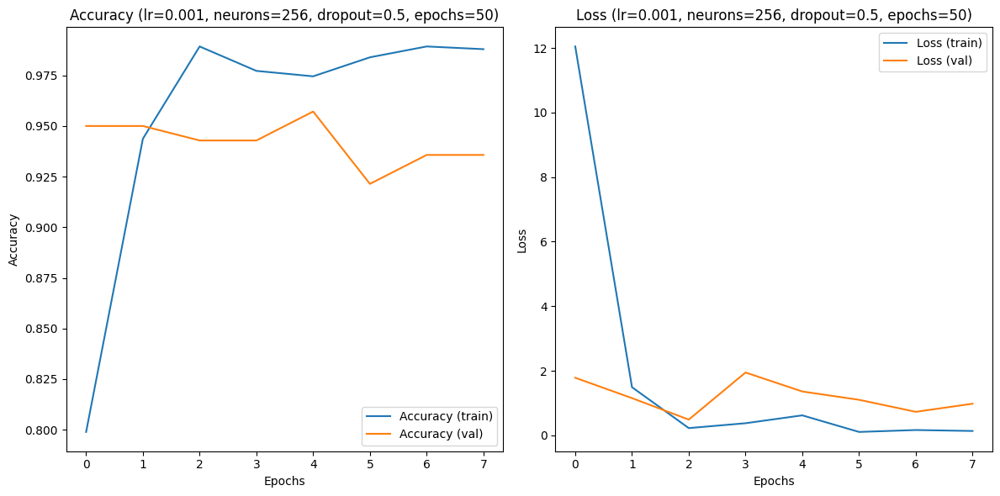

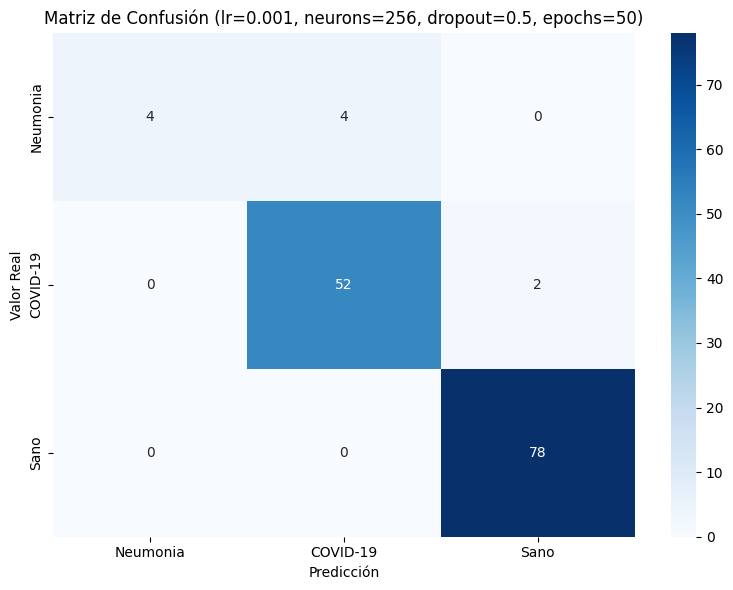

       lr  neurons  dropout  epochs  val_acc            sensitivity  \
0  0.0001      128      0.3      50    0.957    [0.5, 0.981, 0.987]   
1  0.0001      128      0.5      50    0.964    [0.625, 0.963, 1.0]   
2  0.0001      256      0.3      50    0.964  [0.625, 0.981, 0.987]   
3  0.0001      256      0.5      50    0.971    [0.625, 0.981, 1.0]   
4  0.0010      128      0.3      50    0.986       [0.75, 1.0, 1.0]   
5  0.0010      128      0.5      50    0.964   [0.75, 0.963, 0.987]   
6  0.0010      256      0.3      50    0.964      [0.5, 0.981, 1.0]   
7  0.0010      256      0.5      50    0.957      [0.5, 0.963, 1.0]   

           specificity              f1_scores  
0  [0.992, 0.942, 1.0]  [0.615, 0.946, 0.994]  
1  [0.985, 0.965, 1.0]    [0.667, 0.954, 1.0]  
2  [0.992, 0.953, 1.0]  [0.714, 0.955, 0.994]  
3  [0.992, 0.965, 1.0]    [0.714, 0.964, 1.0]  
4    [1.0, 0.977, 1.0]    [0.857, 0.982, 1.0]  
5  [0.985, 0.965, 1.0]   [0.75, 0.954, 0.994]  
6  [0.992, 0.953, 1.0]  

In [ ]:
# Configuración de la semilla para la reproducibilidad
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# Hiperparámetros a probar
learning_rates = [0.0001, 0.001]
num_neurons_list = [128, 256]
dropout_rates = [0.3, 0.5]
num_epochs_list = [50]

# Almacenar resultados
results = []

# Función para liberar memoria
def clear_memory():
    gc.collect()

for lr in learning_rates:
    for num_neurons in num_neurons_list:
        for dropout_rate in dropout_rates:
            for epochs in num_epochs_list:
                print(f"Entrenando con lr={lr}, neuronas={num_neurons}, dropout={dropout_rate}, epochs={epochs}")

                # Crear y compilar el modelo
                model = build_model_multiclase(num_neurons, dropout_rate)
                optimizer = Adam(learning_rate=lr)
                model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])

                # Nombre para guardar el modelo con mejor val_accuracy
                model_filename = f"best_model_lr{lr}_neurons{num_neurons}_dropout{dropout_rate}_epochs{epochs}.h5"

                # Configuración de callbacks: guardar el mejor modelo
                callbacks = [
                    ModelCheckpoint(model_filename, save_best_only=True, monitor="val_accuracy", mode="max", verbose=1),
                    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
                ]

                # Entrenamiento del modelo
                history = model.fit(
                    X_train, y_train,
                    epochs=epochs,
                    batch_size=32,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=(X_validation, y_validation)
                )

                # Liberar memoria de los modelos no necesarios
                del model
                clear_memory()

                # Cargar el mejor modelo
                best_model = load_model(model_filename)

                # Obtener predicciones del mejor modelo
                y_pred_probs = best_model.predict(X_validation)  # Probabilidades

                # Obtener las predicciones de clase (el índice de la clase con la probabilidad más alta)
                y_pred = np.argmax(y_pred_probs, axis=1)

                # Calcular la curva ROC y AUC para cada par de clases
                for class_index1 in range(3):  # Para cada clase (0, 1, 2)
                    for class_index2 in range(class_index1 + 1, 3):
                        # Crear un conjunto binario para las clases actuales
                        binary_labels = np.where((y_validation == class_index1) | (y_validation == class_index2), 1, 0)
                        binary_preds = np.where((y_pred == class_index1) | (y_pred == class_index2), 1, 0)
                        binary_probs = y_pred_probs[:, [class_index1, class_index2]]

                        # Calcular la curva ROC para el par de clases
                        fpr, tpr, _ = roc_curve(binary_labels, binary_probs[:, 1])
                        roc_auc = auc(fpr, tpr)
                        print(f"AUC for class pair ({class_index1}, {class_index2}): {roc_auc:.2f}")

                        # Graficar la curva ROC para cada par de clases
                        plt.figure(figsize=(12, 6))
                        plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
                        plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Línea diagonal
                        plt.xlim([0.0, 1.0])
                        plt.ylim([0.0, 1.05])
                        plt.xlabel('False Positive Rate')
                        plt.ylabel('True Positive Rate')
                        plt.title(f'ROC Curve for Class Pair ({class_index1}, {class_index2})')
                        plt.legend(loc="lower right")
                        plt.tight_layout()
                        plt.show()

                # Generar la matriz de confusión (con 3 clases)
                cm = confusion_matrix(y_validation, y_pred)

                # Calcular sensibilidad, especificidad y F1 score para cada clase
                sensitivity_per_class = [0, 0, 0]  # Lista para sensibilidad
                specificity_per_class = [0, 0, 0]  # Lista para especificidad
                f1_per_class = [0, 0, 0]  # Lista para F1 score

                for i in range(3):  # Para cada clase (0, 1, 2)
                    TP = cm[i, i]
                    FN = np.sum(cm[i, :]) - TP
                    FP = np.sum(cm[:, i]) - TP
                    TN = np.sum(cm) - (TP + FN + FP)

                    sensitivity_per_class[i] = round(TP / (TP + FN) if (TP + FN) > 0 else 0, 3)
                    specificity_per_class[i] = round(TN / (TN + FP) if (TN + FP) > 0 else 0, 3)

                    # Calcular el F1 score para cada clase usando average=None y redondear el valor
                    f1_scores = f1_score(y_validation, y_pred, labels=[i], average=None)
                    f1_per_class[i] = round(f1_scores[0], 3)  # Redondear el primer valor

                val_acc = round(accuracy_score(y_validation, y_pred), 3)

                # Guardar métricas en results
                results.append({
                    "lr": lr,
                    "neurons": num_neurons,
                    "dropout": dropout_rate,
                    "epochs": epochs,
                    "val_acc": val_acc,
                    "sensitivity": sensitivity_per_class,
                    "specificity": specificity_per_class,
                    "f1_scores": f1_per_class
                })

                # Graficas para el entrenamiento actual (accuracy y loss)
                plt.figure(figsize=(12, 6))
                plt.subplot(1, 2, 1)
                plt.plot(history.history['accuracy'], label='Accuracy (train)')
                plt.plot(history.history['val_accuracy'], label='Accuracy (val)')
                plt.title(f'Accuracy (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
                plt.xlabel('Epochs')
                plt.ylabel('Accuracy')
                plt.legend()

                plt.subplot(1, 2, 2)
                plt.plot(history.history['loss'], label='Loss (train)')
                plt.plot(history.history['val_loss'], label='Loss (val)')
                plt.title(f'Loss (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
                plt.xlabel('Epochs')
                plt.ylabel('Loss')
                plt.legend()

                plt.tight_layout()
                plt.show()

                # Graficar la matriz de confusión para las 3 clases
                plt.figure(figsize=(8, 6))
                sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Neumonia", "COVID-19", "Sano"], yticklabels=["Neumonia", "COVID-19", "Sano"])
                plt.xlabel('Predicción')
                plt.ylabel('Valor Real')
                plt.title(f'Matriz de Confusión (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
                plt.tight_layout()
                plt.show()

                # Liberar memoria después de mostrar gráficos
                clear_memory()

# Mostrar los resultados finales en tabla
results_df = pd.DataFrame(results)
print(results_df)

# Opcional: Guardar en CSV para análisis posterior
results_df.to_csv("experimentos_multiclase_resultados.csv", index=False)

El modelo que se selecciona es aquel que **maximiza el accuracy de validación**, así como las métricas adicionales de **sensibilidad, especificidad y F1-score**. Al revisar los resultados obtenidos, un modelo sobresale por su rendimiento superior en todas estas métricas en comparación con los demás. Este modelo se corresponde con la siguiente configuración de hiperparámetros:

* **lr = 0.001, neuronas = 128, dropout = 0.3**


#### **7.B Entrenamiento del modelo final y evaluación sobre el conjunto de test**

Una vez identificados los mejores hiperparámetros, procedemos a entrenar el **modelo final** utilizando la combinación óptima de parámetros. Para maximizar el aprovechamiento de los datos disponibles y mejorar la capacidad generalizadora del modelo, este entrenamiento se realiza utilizando el **conjunto completo de train y validation**, asegurando así que el modelo final haya aprendido de la mayor cantidad de ejemplos posible antes de evaluarse sobre el conjunto de test.

Para ello, primero debemos juntar los conjuntos de entrenamiento y validacion en uno solo:

In [ ]:
# Concatenar X_train con X_validation
X_train = np.concatenate((X_train, X_validation), axis=0)

# Concatenar y_train con y_validation
y_train = np.concatenate((y_train, y_validation), axis=0)

Entrenamos con los datos de entrenamiento y validación conjuntamente y evaluamos sobre el conjunto de test.

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - accuracy: 0.7293 - loss: 7.8454
Epoch 1: val_accuracy improved from -inf to 0.94318, saving model to best_model_test.h5


28/28 ━━━━━━━━━━━━━━━━━━━━ 38s 786ms/step - accuracy: 0.7327 - loss: 7.7534 - val_accuracy: 0.9432 - val_loss: 1.9827
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.9585 - loss: 0.7810
Epoch 2: val_accuracy did not improve from 0.94318
28/28 ━━━━━━━━━━━━━━━━━━━━ 16s 108ms/step - accuracy: 0.9588 - loss: 0.7780 - val_accuracy: 0.9205 - val_loss: 1.7905
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.9742 - loss: 0.3535
Epoch 3: val_accuracy improved from 0.94318 to 0.94886, saving model to best_model_test.h5


28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 307ms/step - accuracy: 0.9741 - loss: 0.3546 - val_accuracy: 0.9489 - val_loss: 1.4736
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.9917 - loss: 0.0720
Epoch 4: val_accuracy did not improve from 0.94886
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - accuracy: 0.9915 - loss: 0.0754 - val_accuracy: 0.8807 - val_loss: 2.4015
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.9817 - loss: 0.1075
Epoch 5: val_accuracy did not improve from 0.94886
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.9817 - loss: 0.1097 - val_accuracy: 0.8750 - val_loss: 2.4251
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.9912 - loss: 0.1075
Epoch 6: val_accuracy did not improve from 0.94886
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.9910 - loss: 0.1091 - val_accuracy: 0.8750 - val_loss: 2.4151
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.9799 - loss: 0.2665
Epoch 7: val_accuracy did not improve f

28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 288ms/step - accuracy: 0.9918 - loss: 0.0624 - val_accuracy: 0.9602 - val_loss: 0.6291
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.9999 - loss: 0.0014    
Epoch 12: val_accuracy did not improve from 0.96023
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - accuracy: 0.9999 - loss: 0.0019 - val_accuracy: 0.9432 - val_loss: 0.7501
Epoch 13/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.9999 - loss: 9.8179e-04
Epoch 13: val_accuracy did not improve from 0.96023
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - accuracy: 0.9999 - loss: 0.0013 - val_accuracy: 0.9489 - val_loss: 0.7464
Epoch 14/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.9967 - loss: 0.0061
Epoch 14: val_accuracy did not improve from 0.96023
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - accuracy: 0.9968 - loss: 0.0061 - val_accuracy: 0.9489 - val_loss: 0.8941
Epoch 15/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.9985 - loss: 0.0027
Epoch 15: val_accuracy 

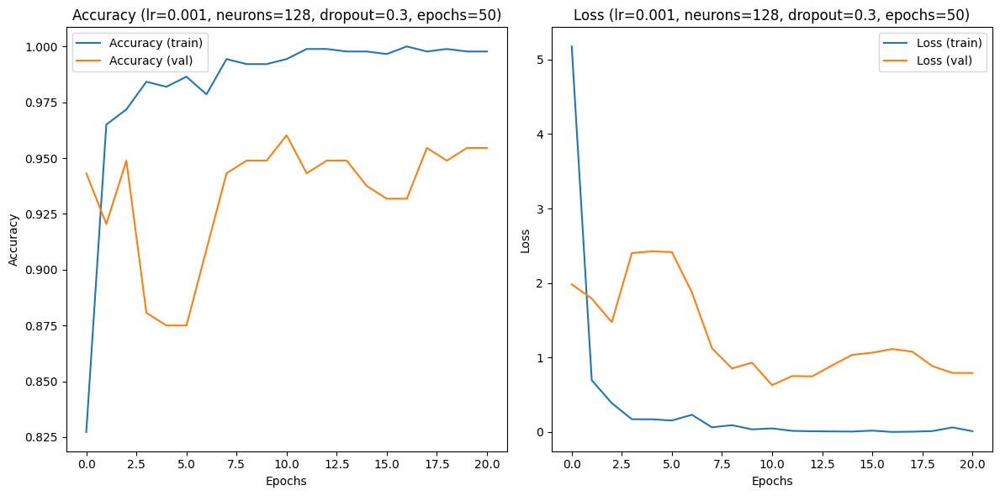

6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 700ms/step
AUC para clase 0: 0.94
AUC para clase 1: 0.98
AUC para clase 2: 1.00


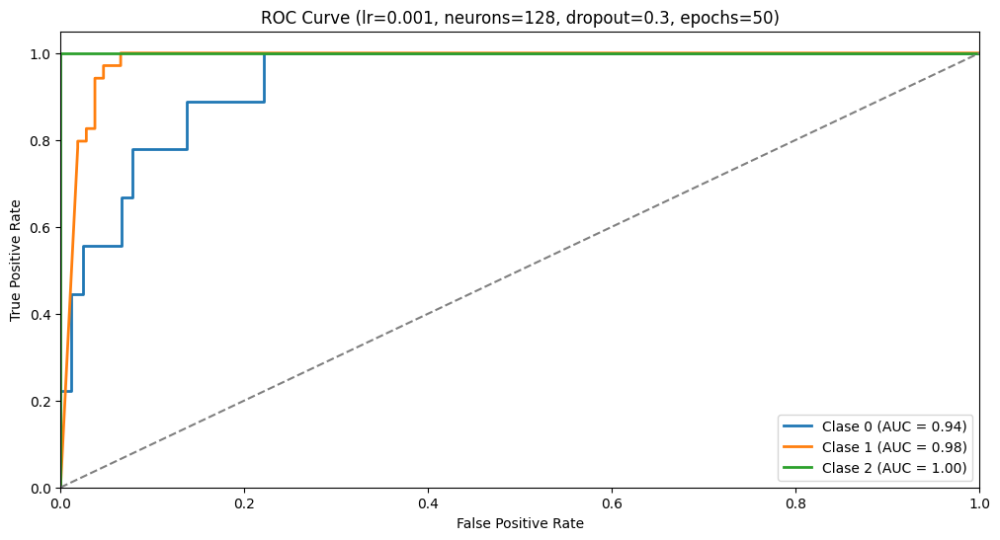

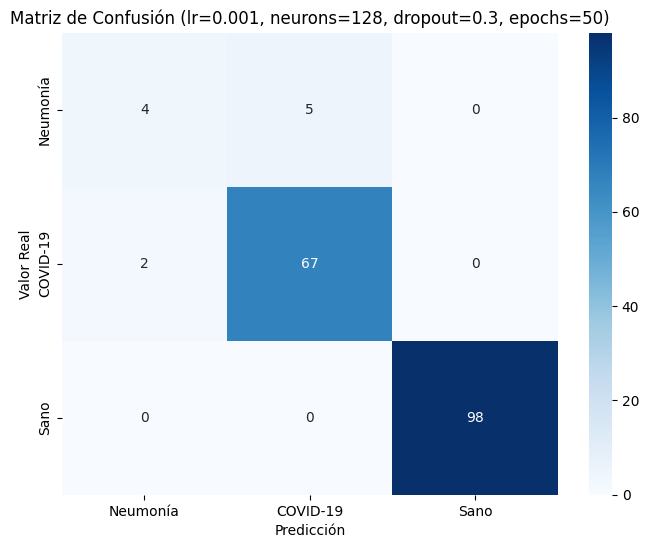

Accuracy: 0.9602
Precisión para clase 0: 0.6667
Recall para clase 0: 0.4444
F1 Score para clase 0: 0.5333
Especificidad para clase 0: 0.988
Precisión para clase 1: 0.9306
Recall para clase 1: 0.9710
F1 Score para clase 1: 0.9504
Especificidad para clase 1: 0.953
Precisión para clase 2: 1.0000
Recall para clase 2: 1.0000
F1 Score para clase 2: 1.0000
Especificidad para clase 2: 1.000
AUC promedio: 0.9743


In [ ]:
# Configuración de la semilla para la reproducibilidad
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# Mejores hiperparámetros
num_neurons = 128
dropout_rate = 0.3
lr = 0.001
epochs = 50

# Crear y compilar el modelo
model = build_model_multiclase(num_neurons, dropout_rate)
optimizer = Adam(learning_rate=lr)
model.compile(optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"])

# Nombre para guardar el modelo con mejor val_accuracy
model_filename = f"best_model_test.h5"

# Configuración de callbacks: guardar el mejor modelo
callbacks = [
    ModelCheckpoint(model_filename, save_best_only=True, monitor="val_accuracy", mode="max", verbose=1),
    EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
]

# Entrenamiento del modelo
history = model.fit(
    X_train, y_train,
    epochs=epochs,
    batch_size=32,
    verbose=1,
    callbacks=callbacks,
    validation_data=(X_test, y_test)
)

# Graficar accuracy y loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Accuracy (train)')
plt.plot(history.history['val_accuracy'], label='Accuracy (val)')
plt.title(f'Accuracy (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Loss (train)')
plt.plot(history.history['val_loss'], label='Loss (val)')
plt.title(f'Loss (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Cargar el mejor modelo guardado
best_model = load_model(model_filename)

# Realizar predicciones con el modelo mejorado
y_pred_probs = best_model.predict(X_test)  # Probabilidades de cada clase

# Obtener las predicciones de clase (índice de la clase con la probabilidad más alta)
y_pred = np.argmax(y_pred_probs, axis=1)

# Convertir y_test a formato one-hot
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])

# Calcular AUC para cada clase
fpr, tpr, roc_auc = {}, {}, {}

for class_index in range(3):
    fpr[class_index], tpr[class_index], _ = roc_curve(y_test_bin[:, class_index], y_pred_probs[:, class_index])
    roc_auc[class_index] = auc(fpr[class_index], tpr[class_index])
    print(f"AUC para clase {class_index}: {roc_auc[class_index]:.2f}")

# Graficar la curva ROC para cada clase
plt.figure(figsize=(12, 6))
for class_index in range(3):
    plt.plot(fpr[class_index], tpr[class_index], lw=2, label=f'Clase {class_index} (AUC = {roc_auc[class_index]:.2f})')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curve (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
plt.legend(loc="lower right")
plt.show()

# Generar y graficar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Neumonía", "COVID-19", "Sano"], yticklabels=["Neumonía", "COVID-19", "Sano"])
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.title(f'Matriz de Confusión (lr={lr}, neurons={num_neurons}, dropout={dropout_rate}, epochs={epochs})')
plt.show()


# Calcular métricas adicionales
accuracy = np.trace(cm) / np.sum(cm)  # Exactitud: (TP+TN) / total
precision = np.diag(cm) / np.sum(cm, axis=0)  # Precisión para cada clase
recall = np.diag(cm) / np.sum(cm, axis=1)  # Recall para cada clase
f1_scores = 2 * (precision * recall) / (precision + recall)  # F1 Score para cada clase

# Calcular especificidad para cada clase
specificity = np.zeros(3)

for i in range(3):  # Para cada clase (0, 1, 2)
    TN = np.sum(cm) - (np.sum(cm[i, :]) + np.sum(cm[:, i]) - cm[i, i])  # Cálculo de TN
    FP = np.sum(cm[:, i]) - cm[i, i]  # Cálculo de FP

    specificity[i] = round(TN / (TN + FP) if (TN + FP) > 0 else 0, 3)  # Especificidad

print(f"Accuracy: {accuracy:.4f}")
for i in range(3):
    print(f"Precisión para clase {i}: {precision[i]:.4f}")
    print(f"Recall para clase {i}: {recall[i]:.4f}")
    print(f"F1 Score para clase {i}: {f1_scores[i]:.4f}")
    print(f"Especificidad para clase {i}: {specificity[i]:.3f}")  # Especificidad


# AUC promedio
average_auc = np.mean(list(roc_auc.values()))
print(f"AUC promedio: {average_auc:.4f}")

#### **8.B Interpretrabilidad del modelo usando CAM**

A continuación, mostraremos la **interpretabilidad** del modelo, con la técnica **CAM** para mostrar las partes donde el modelo ha hecho mas énfasis a la hora de tomar decisiones

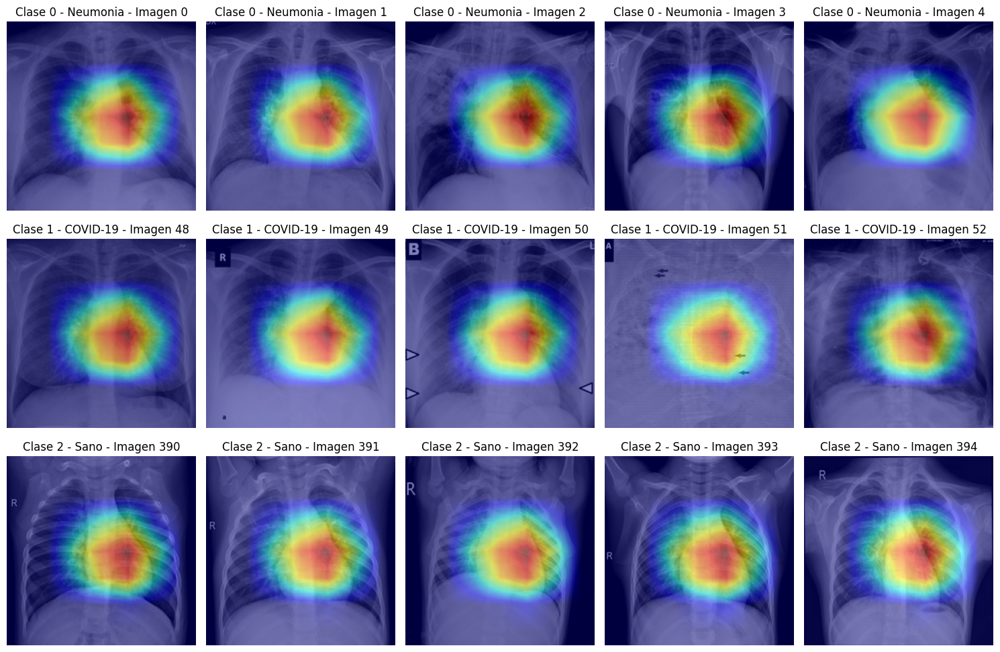

In [ ]:
# Seleccionar la última capa convolucional
last_conv_layer = None
for layer in reversed(best_model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D):
        last_conv_layer = layer
        break

# Modelo para obtener activaciones y predicciones
grad_model = Model(inputs=best_model.input, outputs=[last_conv_layer.output, best_model.output])

# Seleccionar las imágenes de cada clase
class_0_indices = np.where(y == 0)[0]  # Índices de la clase 0 (por ejemplo, Neumonía)
class_1_indices = np.where(y == 1)[0]  # Índices de la clase 1 (por ejemplo, COVID-19)
class_2_indices = np.where(y == 2)[0]  # Índices de la clase 2 (por ejemplo, Sano)

# Seleccionar las primeras 5 imágenes de cada clase
class_0_images = X[class_0_indices[:5]]
class_1_images = X[class_1_indices[:5]]
class_2_images = X[class_2_indices[:5]]

# Función para obtener la Class Activation Map (CAM) para cada clase
def get_cam(image, model):
    image = image.astype("float32") / 255.0  # Convertir a float32 y normalizar a [0,1]
    image = np.expand_dims(image, axis=0)  # Agregar dimensión batch

    with tf.GradientTape() as tape:
        inputs = tf.convert_to_tensor(image)
        tape.watch(inputs)
        last_conv_layer_output, predictions = model(inputs)
        class_idx = tf.argmax(predictions[0])  # Índice de la clase predicha
        class_output = predictions[:, class_idx]  # Probabilidad de la clase predicha

    # Calcular gradientes con respecto a la salida de la última capa convolucional
    grads = tape.gradient(class_output, last_conv_layer_output)

    # Promediar los gradientes sobre las dimensiones espaciales
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Obtener activaciones de la última capa convolucional
    last_conv_layer_output = last_conv_layer_output[0]

    # Ajustar la forma de pooled_grads para la multiplicación correcta
    pooled_grads = tf.reshape(pooled_grads, (1, 1, 1, -1))

    # Ponderar activaciones por los gradientes
    last_conv_layer_output *= pooled_grads

    # Promedio sobre la dimensión de los canales para obtener la CAM
    cam = np.mean(last_conv_layer_output, axis=-1)

    # Normalizar el CAM para que esté en el rango [0,1]
    cam = np.maximum(cam, 0)  # Eliminar valores negativos
    cam = cam - np.min(cam)   # Ajustar valores mínimos a 0
    cam = cam / (np.max(cam) + 1e-8)  # Evitar división por 0

    # Redimensionar la CAM al tamaño de entrada de la red
    cam = tf.image.resize(cam[..., tf.newaxis], (224, 224)).numpy()

    return cam

# Mostrar imágenes con su correspondiente CAM para cada clase
plt.figure(figsize=(15, 10))

# Mostrar imágenes de la clase 0 (Neumonía)
for i, image in enumerate(class_0_images):
    cam = get_cam(image, grad_model)
    plt.subplot(3, 5, i+1)  # Organiza en una cuadrícula 3x5
    plt.imshow(image.astype("float32") / 255.0)  # Normalizar para visualización
    plt.imshow(cam.squeeze(), cmap='jet', alpha=0.5)
    plt.title(f'Clase 0 - Neumonia - Imagen {class_0_indices[i]}')
    plt.axis('off')

# Mostrar imágenes de la clase 1 (COVID-19)
for i, image in enumerate(class_1_images):
    cam = get_cam(image, grad_model)
    plt.subplot(3, 5, i+6)  # Organiza en una cuadrícula 3x5
    plt.imshow(image.astype("float32") / 255.0)  # Normalizar para visualización
    plt.imshow(cam.squeeze(), cmap='jet', alpha=0.5)
    plt.title(f'Clase 1 - COVID-19 - Imagen {class_1_indices[i]}')
    plt.axis('off')

# Mostrar imágenes de la clase 2 (Sano)
for i, image in enumerate(class_2_images):
    cam = get_cam(image, grad_model)
    plt.subplot(3, 5, i+11)  # Organiza en una cuadrícula 3x5
    plt.imshow(image.astype("float32") / 255.0)  # Normalizar para visualización
    plt.imshow(cam.squeeze(), cmap='jet', alpha=0.5)
    plt.title(f'Clase 2 - Sano - Imagen {class_2_indices[i]}')
    plt.axis('off')

plt.tight_layout()
plt.show()

## **4. Conclusiones**

En conclusión, se han desarrollado y entrenado dos modelos de clasificación utilizando imágenes médicas de radiografías torácicas. El primer modelo es un clasificador binario, cuyo rendimiento ha sido destacado con un accuracy de 98.30%, una sensibilidad de 97.44% y un F1-score de 97.89%. Este modelo, basado en la arquitectura ResNet50 y los pesos preentrenados de DeepCOVID-XR, ha demostrado ser extremadamente eficaz en la detección de COVID-19 y neumonía bacteriana, lo que resalta su potencial como herramienta complementaria en el diagnóstico clínico. El uso de transfer learning ha sido clave en la optimización del modelo, alcanzando métricas sólidas con un esfuerzo de entrenamiento reducido. Además, la correcta optimización de los hiperparámetros ha permitido priorizar la detección de casos positivos, minimizando así el riesgo de falsos negativos y ayudando a prevenir la propagación del virus.

A pesar del excelente desempeño, se identificaron ciertas limitaciones, especialmente en la interpretabilidad del modelo. Los mapas de activación sugieren que el modelo se enfoca en las regiones pulmonares, pero la similitud en las activaciones entre las distintas clases dificulta una comprensión clara de los criterios de decisión. Este aspecto subraya la importancia de validar los resultados con especialistas en radiología, así como evaluar el desempeño en entornos hospitalarios con datos externos, para garantizar la fiabilidad del modelo antes de su implementación en la práctica clínica.

Por otro lado, el clasificador multiclase, basado también en ResNet50, ha logrado un accuracy global de 96%. Sin embargo, el modelo muestra limitaciones en la detección de la clase neumonía bacteriana, con una baja sensibilidad de 0.44, lo que resulta en una alta tasa de falsos negativos. Este desafío podría estar relacionado con la escasez de datos para esta clase y la dificultad del modelo para generalizar a partir del data augmentation, cuyo enfoque en transformaciones geométricas no refleja completamente las variaciones de las radiografías reales. En contraste, el modelo ha demostrado un excelente rendimiento en la detección de COVID-19 y en la identificación de sujetos sanos, con una sensibilidad de 0.97 y 1.0, respectivamente.

El análisis de los mapas de activación del modelo multiclase también muestra que la red se enfoca correctamente en la región pulmonar, lo que es clínicamente relevante. Sin embargo, la similitud en las activaciones entre las clases dificulta la interpretación de los criterios utilizados por el modelo para diferenciar entre ellas. Este aspecto resalta la necesidad de validar los hallazgos con especialistas en radiología.

En resumen, aunque el clasificador multiclase presenta un buen desempeño general, su aplicación clínica aún enfrenta retos, especialmente en la detección de neumonía bacteriana. Para mejorar su rendimiento, se sugiere la recopilación de más datos específicos para esta clase, la implementación de técnicas de balanceo de clases y la exploración de enfoques avanzados de data augmentation. Además, la supervisión de profesionales de la salud en su uso será esencial para asegurar decisiones diagnósticas precisas y evitar posibles riesgos asociados con su implementación en entornos médicos reales.
Por último, cabe mencionar que hemos tenido especiales dificultades a la hora de ejecutar el código de esta práctica ya que la GPU no siempre estaba disponible en Google Collab. Además, en algunas ocasiones, la RAM llegaba a su límite y se generaba un error “ResourceExhaustedError: Graph execution error". Estos inconvenientes afectaron la ejecución de nuestros experimentos. También queríamos comentar que hemos dedicado un gran esfuerzo a la práctica, dado que 2 de los 3 integrantes del grupo no tenían apenas conocimientos sobre Inteligencia Artificial, y menos sobre CNNs.
